In [68]:
import itertools

import numpy as np
import pandas as pd
from econml.dr import DRLearner
from sklearn.impute import KNNImputer
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBClassifier, XGBRegressor
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
import matplotlib.pyplot as plt
from sklift.viz import plot_qini_curve
from sklift.metrics import uplift_auc_score, qini_auc_score
import matplotlib.pyplot as plt

In [4]:
# Load dataset
data = pd.read_csv('../data/bsc_project_set.csv')

# Drop id
data = data.drop(['id', 'Unnamed: 0', 'peep'], axis=1)


# Convert categorical data into numeric
# 'sex' and 'peep_regime' are categorical, use pd.get_dummies
categorical_columns = ['sex', 'peep_regime', 'mort_28']
data = pd.get_dummies(data, columns=categorical_columns, drop_first=False)
data = data.drop(['sex_F','peep_regime_low', 'mort_28_True'], axis = 1)


numeric_columns = data.columns.difference(['mort_28_False'])
impute_columns = data.columns.difference(['mort_28_False', 'sex_M', 'peep_regime_high'])

# Normalize data
# scaler = StandardScaler()
# scaler = Normalizer()
scaler = MinMaxScaler()
data[numeric_columns] = scaler.fit_transform(data[numeric_columns])

# Impute missing data
# imputer = SimpleImputer(strategy='mean')
imputer = KNNImputer(n_neighbors=11, weights='uniform')
# Impute using Iterative Imputer
# imputer = IterativeImputer(max_iter=10, random_state=768)


data[numeric_columns] = imputer.fit_transform(data[numeric_columns])

# Define treatment and outcome columns
treatment_column = 'peep_regime_high'
outcome_column = 'mort_28_False'

# Define features (excluding treatment and outcome)
features = list(set(data.columns) - {treatment_column, outcome_column})

# Confounding variables
confounders = ['age', 'sex_M', 'weight', 'height', 'pf_ratio', 'po2', 'pco2' , 'fio2', 'bilirubin','urea' , 'driving_pressure', 'plateau_pressure']
features_without_confounders = list(set(features) - set(confounders))


# # Reorder columns in the data DataFrame
# ordered_columns = features_without_confounders + confounders + [treatment_column, outcome_column]
# data = data[ordered_columns]


# print(data.shape)

# features first, then confounders
ordered_columns = features_without_confounders + confounders
# confounders first, then features
ordered_columns =  confounders + features_without_confounders


selected_features = ['age', 'urea', 'weight', 'height', 'pf_ratio', 'po2', 'ph' , 'fio2', 'heart_rate' , 'driving_pressure', 'plateau_pressure', 'hco3', 'respiratory_rate']

X = data[selected_features].values
Y = data[outcome_column].values
T = data[treatment_column].values

# Train-test split
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    data[selected_features], data[outcome_column], data[treatment_column], test_size=0.2, random_state=768)

Evaluating Logistic Regression for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


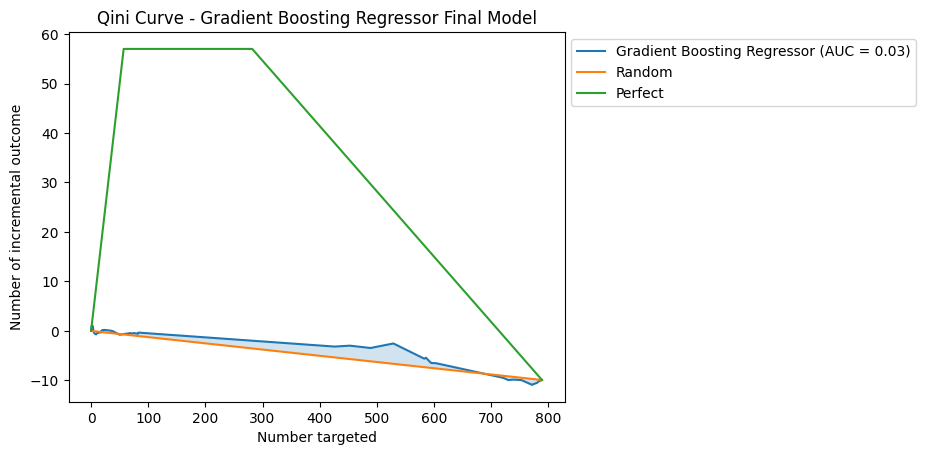

Gradient Boosting Regressor Final Model AUQC: 0.06024669405143106

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


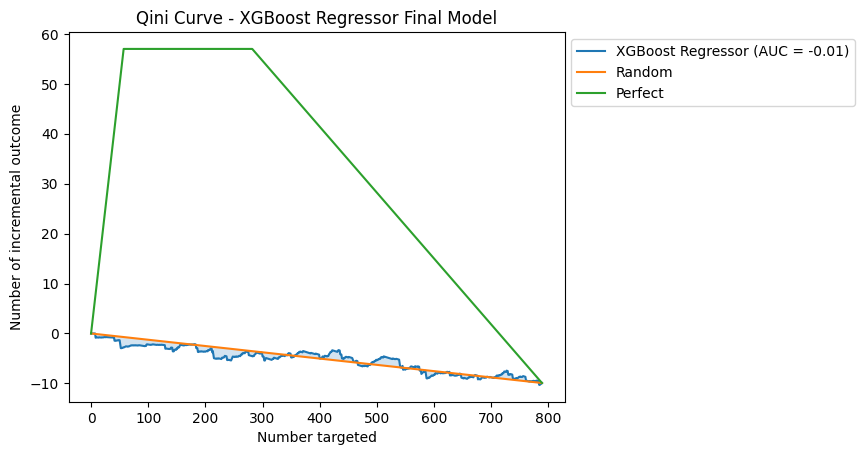

XGBoost Regressor Final Model AUQC: -0.017983686702960407

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


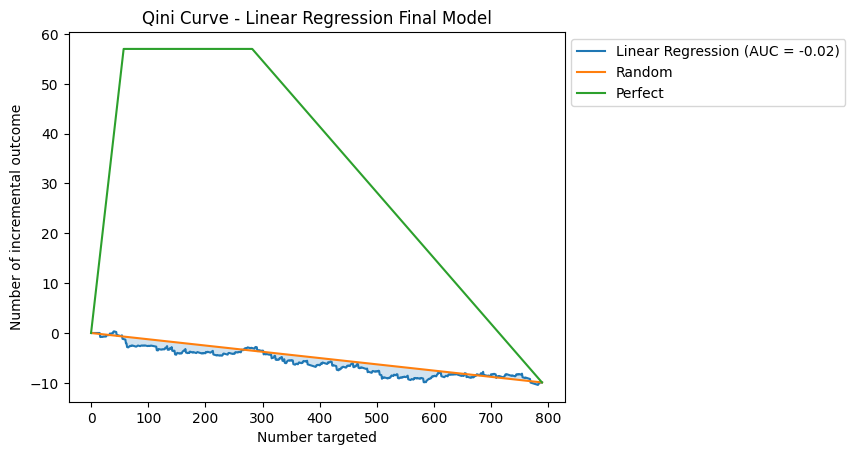

Linear Regression Final Model AUQC: -0.03553614135971187

Evaluating Logistic Regression for propensity and Random Forest for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


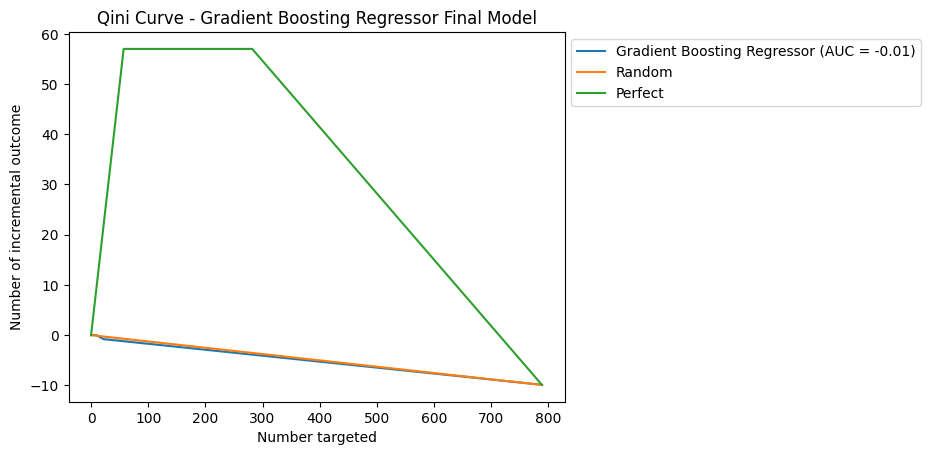

Gradient Boosting Regressor Final Model AUQC: -0.03289566152465979

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


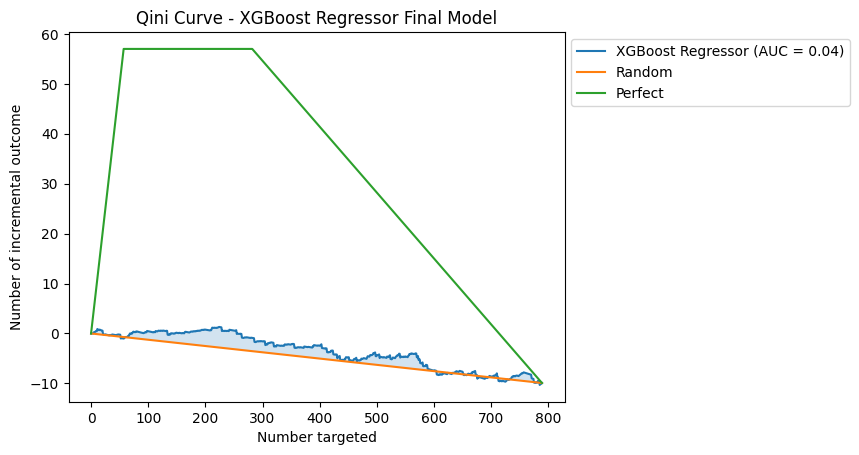

XGBoost Regressor Final Model AUQC: 0.04098033858753519

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


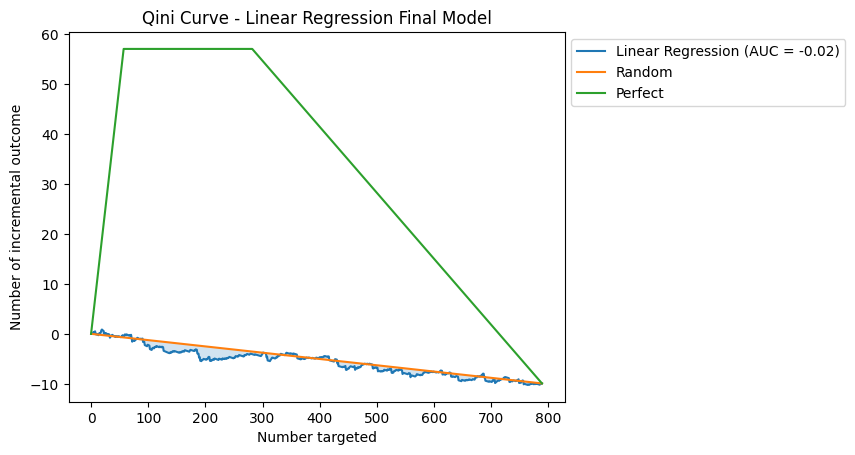

Linear Regression Final Model AUQC: -0.012166180099890636

Evaluating Logistic Regression for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


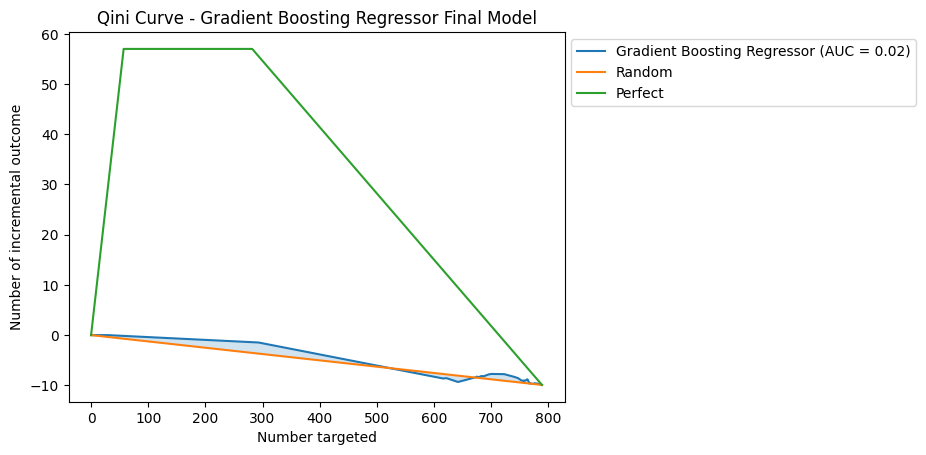

Gradient Boosting Regressor Final Model AUQC: 0.031451051000129654

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


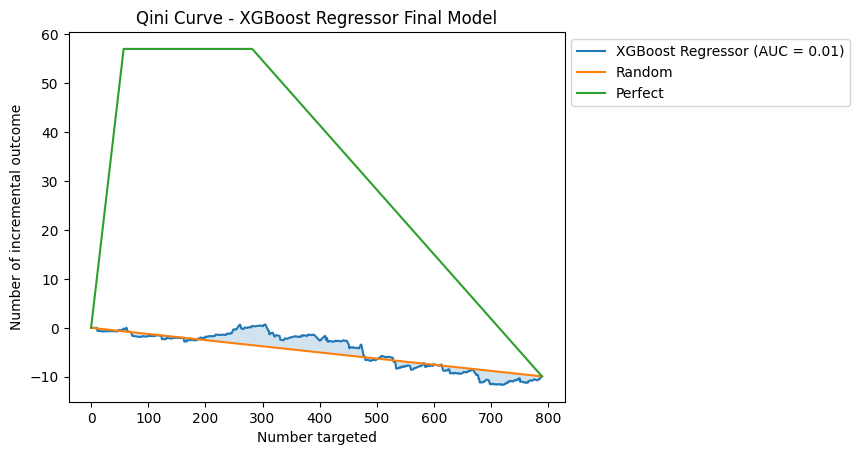

XGBoost Regressor Final Model AUQC: 0.0004622609719985386

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


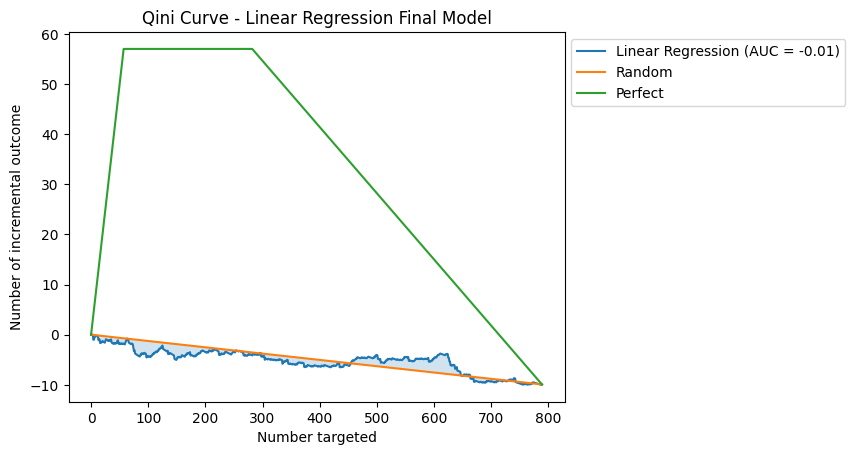

Linear Regression Final Model AUQC: 0.02163348925978412

Evaluating Logistic Regression for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


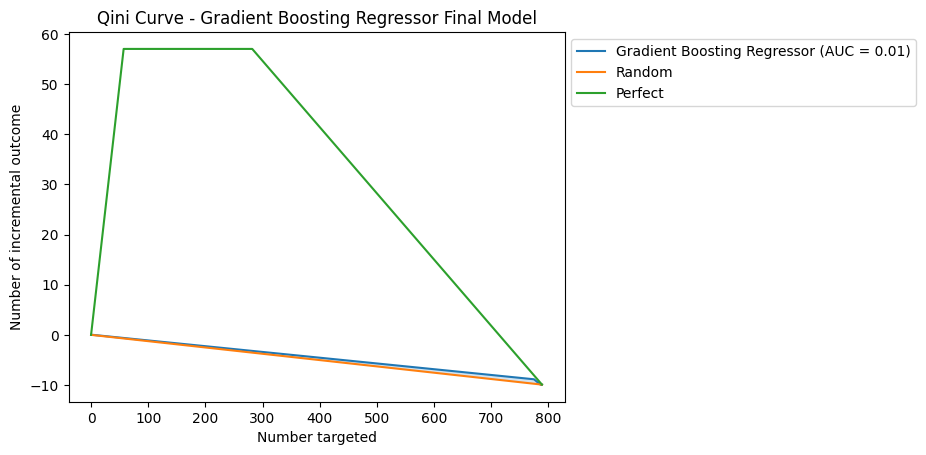

Gradient Boosting Regressor Final Model AUQC: 0.014066235418621727

Evaluating DR-Learner with XGBoost Regressor as the final model...


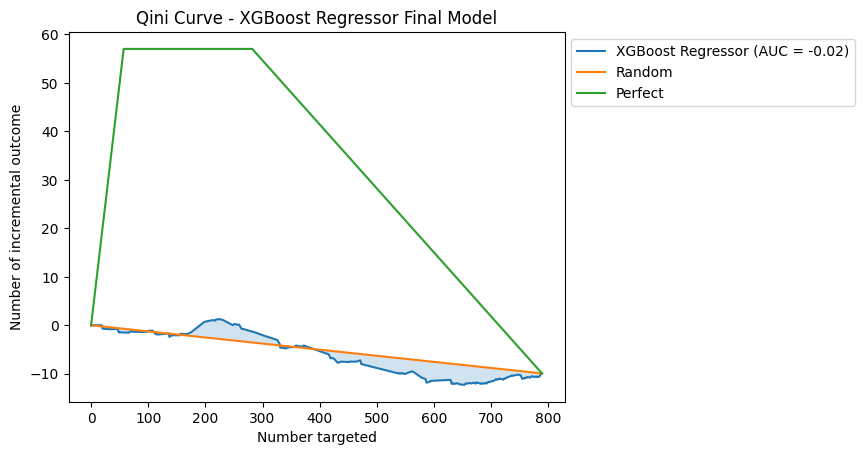

XGBoost Regressor Final Model AUQC: -0.0453299201591458

Evaluating DR-Learner with Linear Regression as the final model...


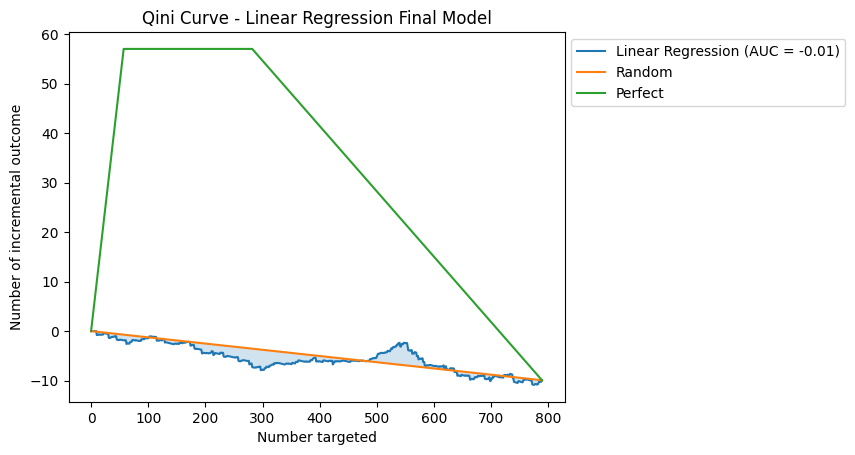

Linear Regression Final Model AUQC: -0.06294369010135949

Evaluating Logistic Regression for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


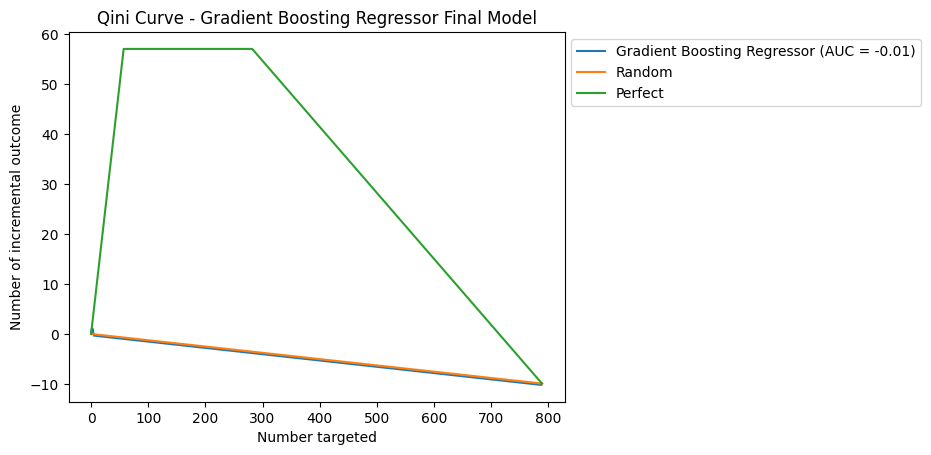

Gradient Boosting Regressor Final Model AUQC: -0.00774529631365767

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


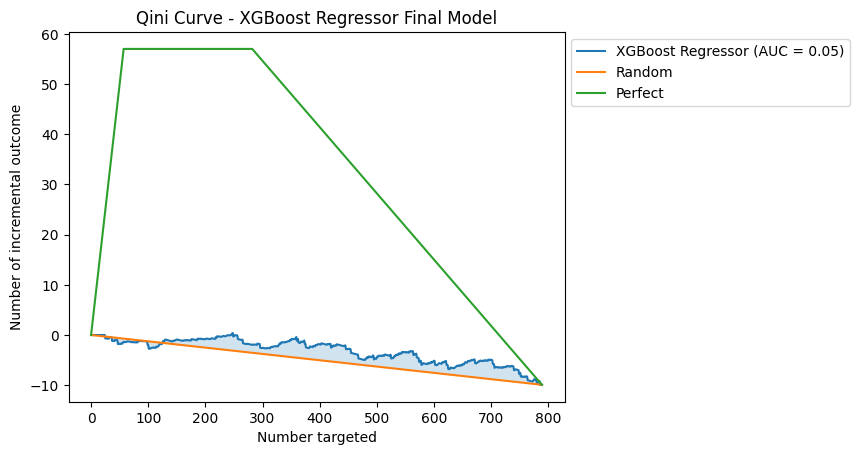

XGBoost Regressor Final Model AUQC: 0.05782431706661317

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


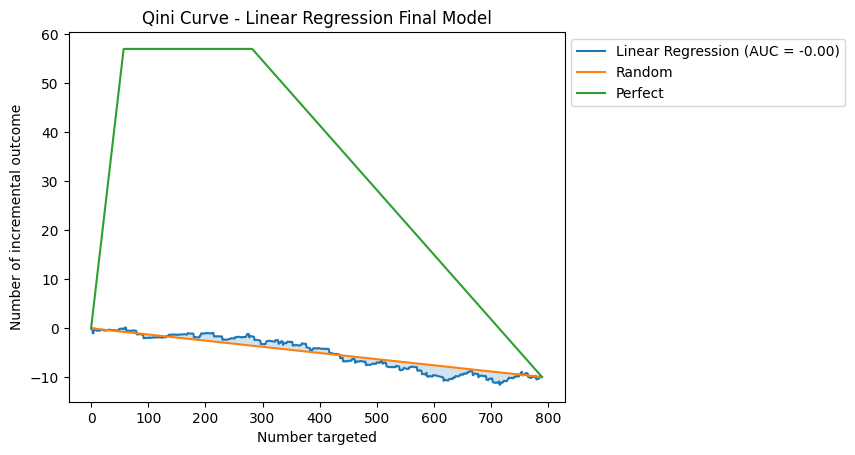

Linear Regression Final Model AUQC: -0.05026728682130639

Evaluating Logistic Regression for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


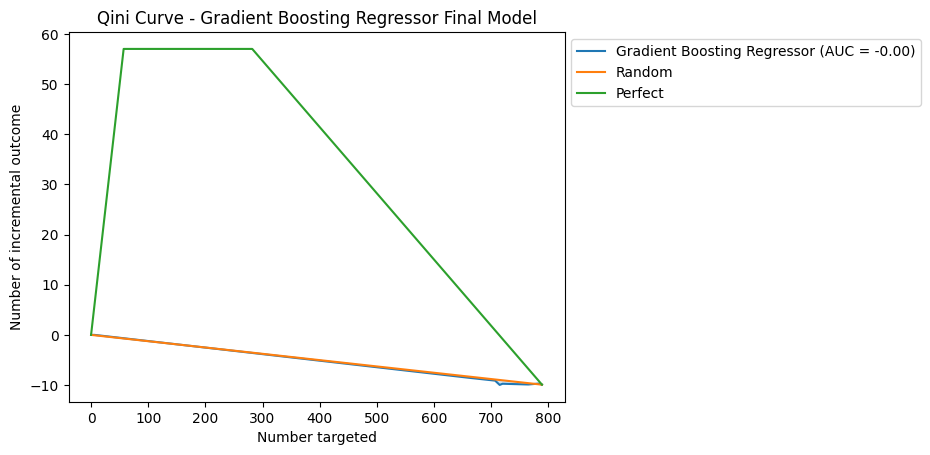

Gradient Boosting Regressor Final Model AUQC: 0.01437006446598497

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


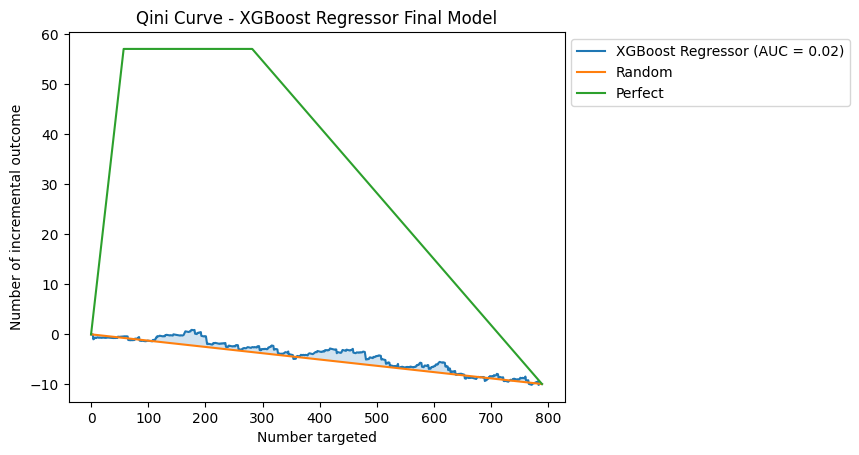

XGBoost Regressor Final Model AUQC: 0.01646599118654576

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


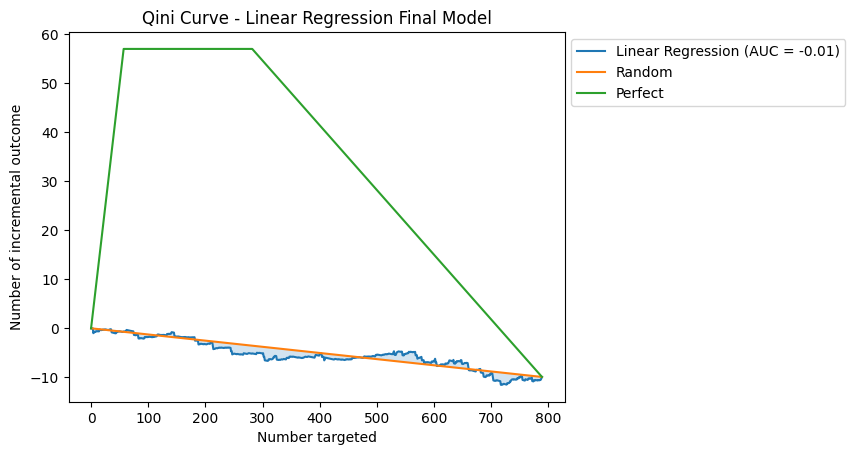

Linear Regression Final Model AUQC: -0.07986921812245981

Evaluating Random Forest for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


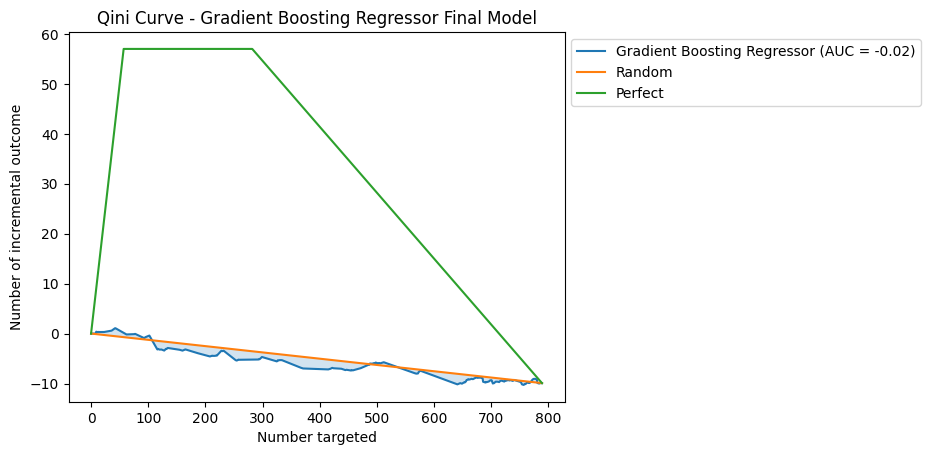

Gradient Boosting Regressor Final Model AUQC: -0.017777698368344686

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


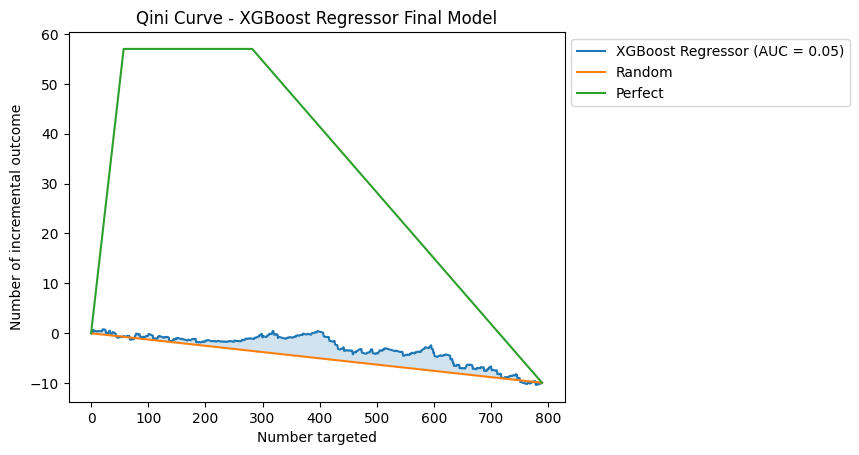

XGBoost Regressor Final Model AUQC: 0.06960226881027991

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


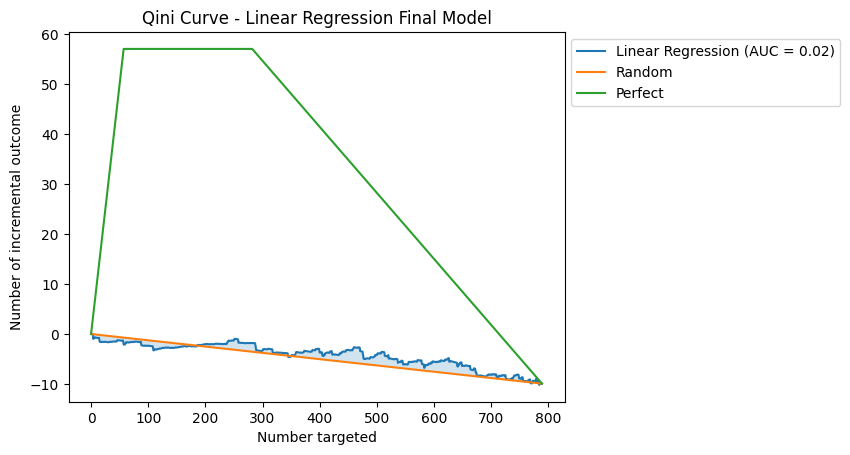

Linear Regression Final Model AUQC: -0.0430660168633644

Evaluating Random Forest for propensity and Random Forest for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


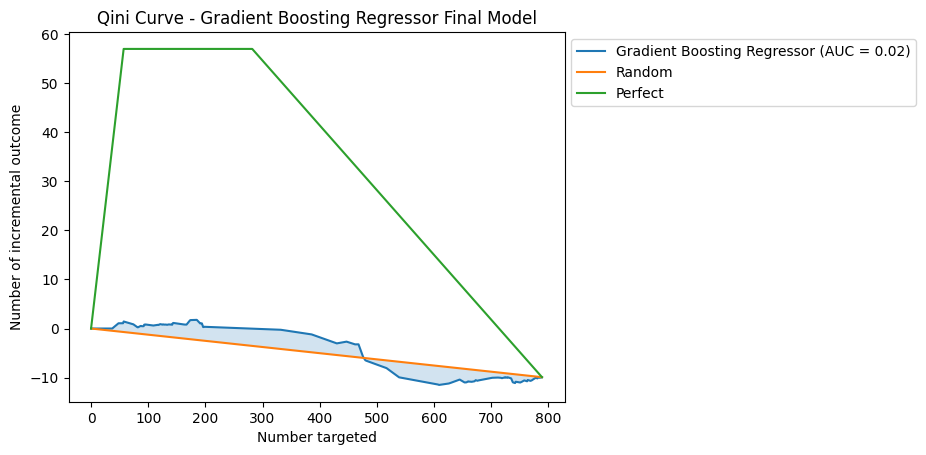

Gradient Boosting Regressor Final Model AUQC: 0.057942701301112856

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


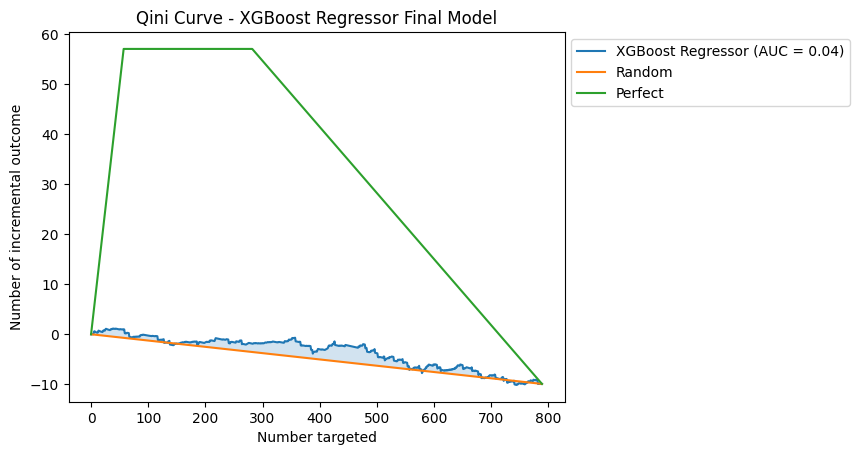

XGBoost Regressor Final Model AUQC: 0.031760294240504125

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


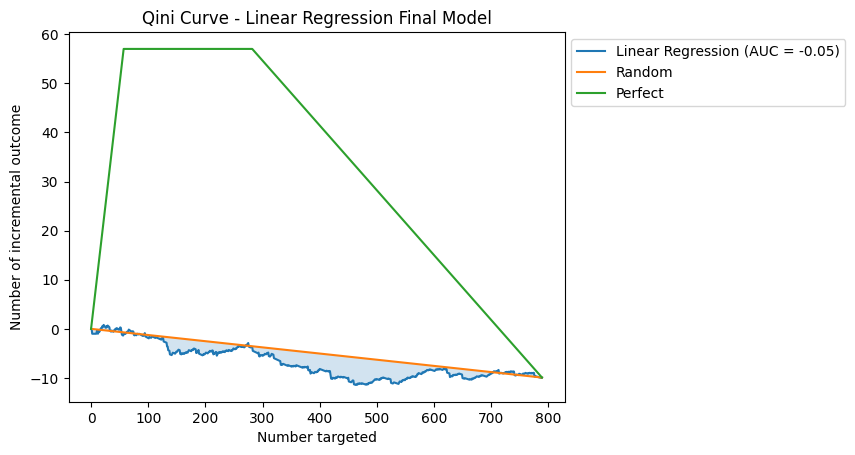

Linear Regression Final Model AUQC: -0.024070673567511316

Evaluating Random Forest for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


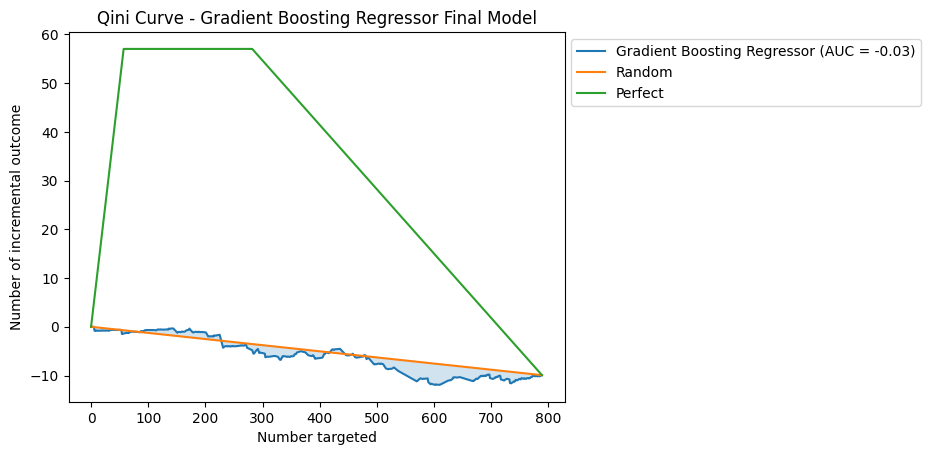

Gradient Boosting Regressor Final Model AUQC: -0.04741093424145967

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


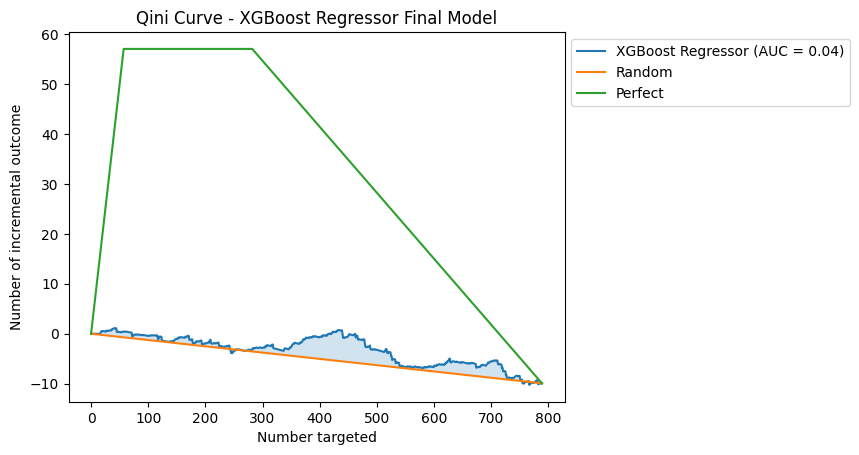

XGBoost Regressor Final Model AUQC: 0.05881994548756935

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


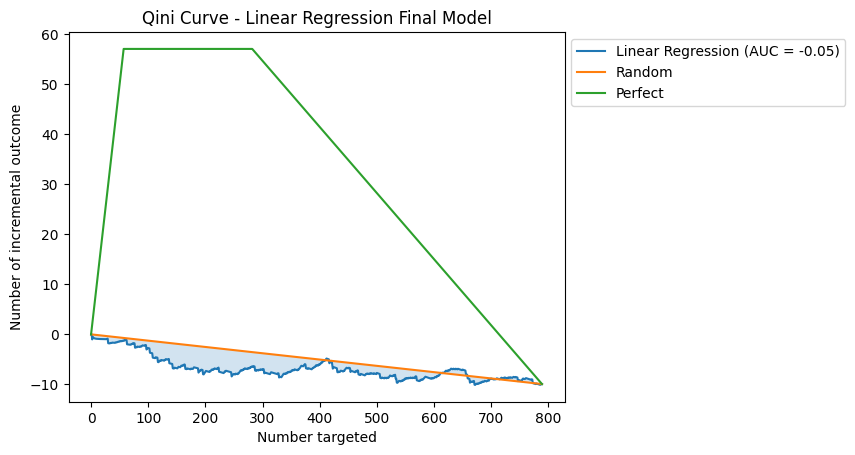

Linear Regression Final Model AUQC: -0.023689011777101667

Evaluating Random Forest for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


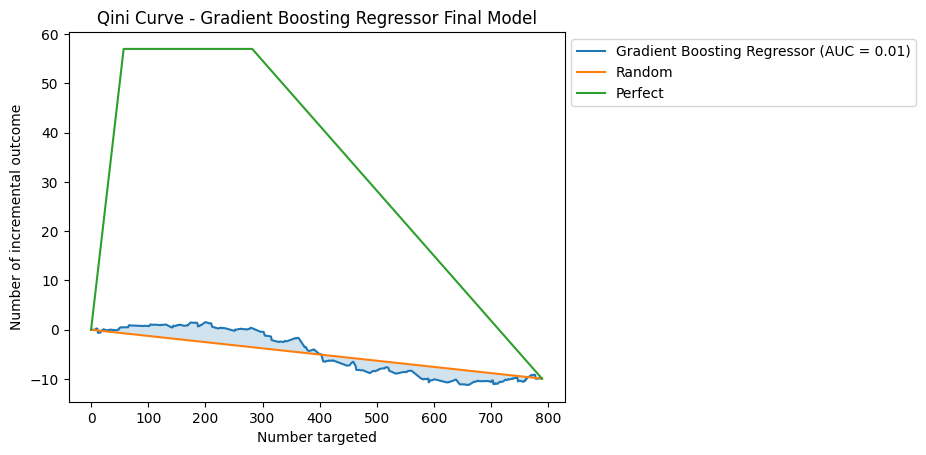

Gradient Boosting Regressor Final Model AUQC: 0.014665832441966583

Evaluating DR-Learner with XGBoost Regressor as the final model...


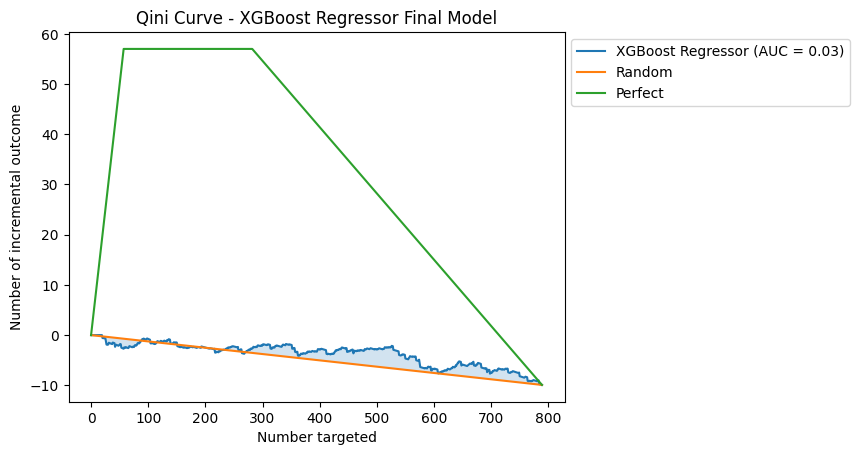

XGBoost Regressor Final Model AUQC: 0.04539225078684918

Evaluating DR-Learner with Linear Regression as the final model...


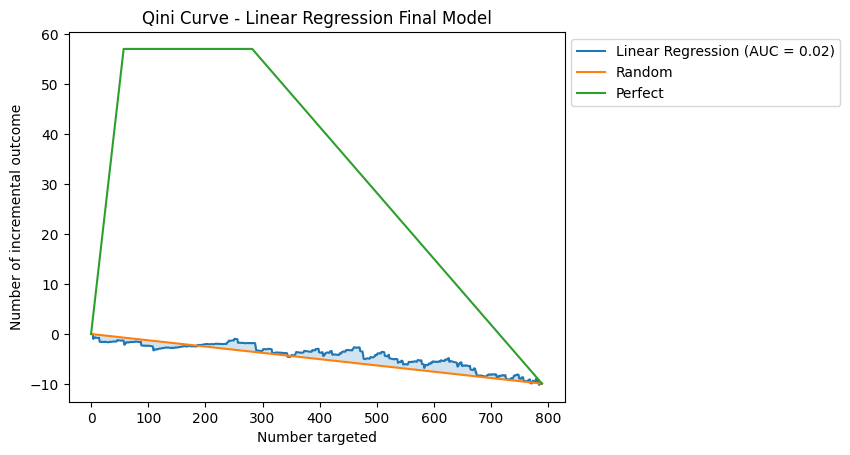

Linear Regression Final Model AUQC: -0.04318283156425146

Evaluating Random Forest for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


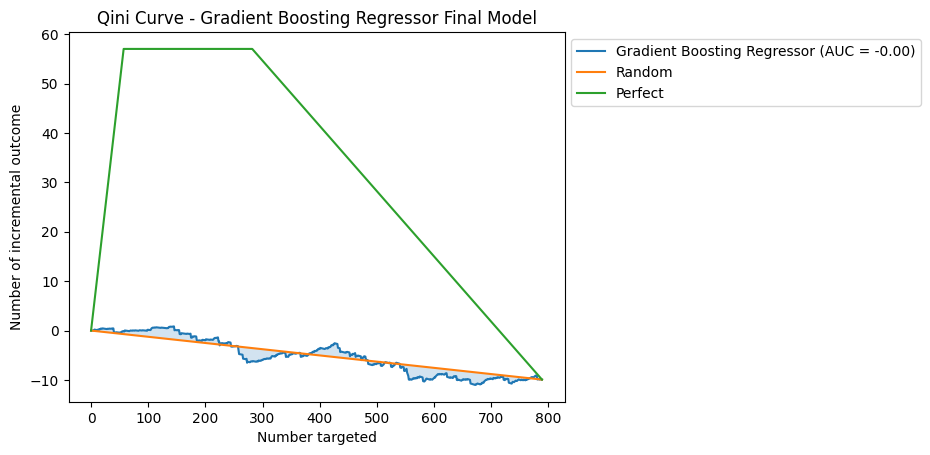

Gradient Boosting Regressor Final Model AUQC: -0.0038020522303919176

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


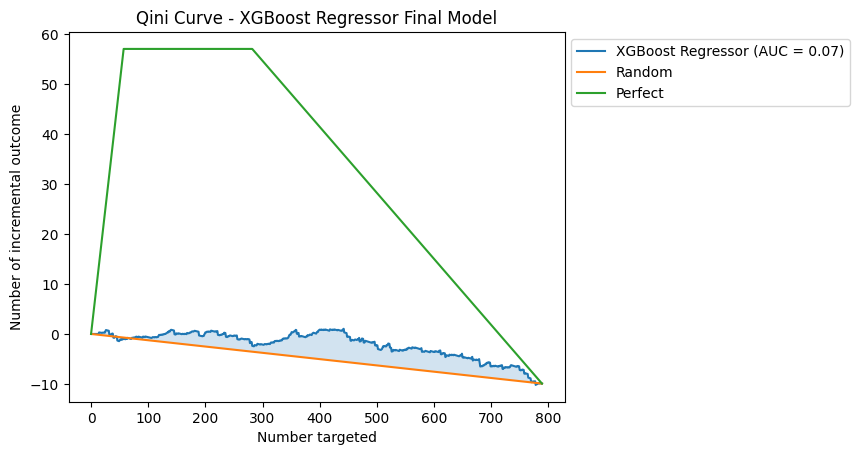

XGBoost Regressor Final Model AUQC: 0.10737966119873799

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


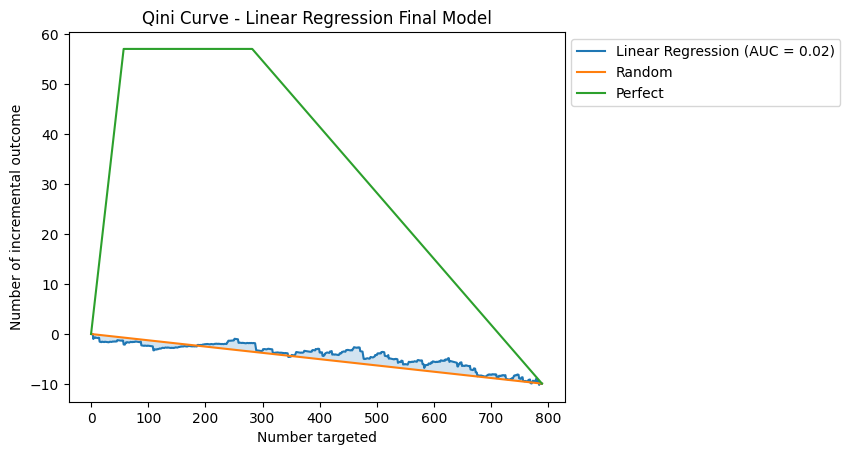

Linear Regression Final Model AUQC: -0.042988126512185

Evaluating Random Forest for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


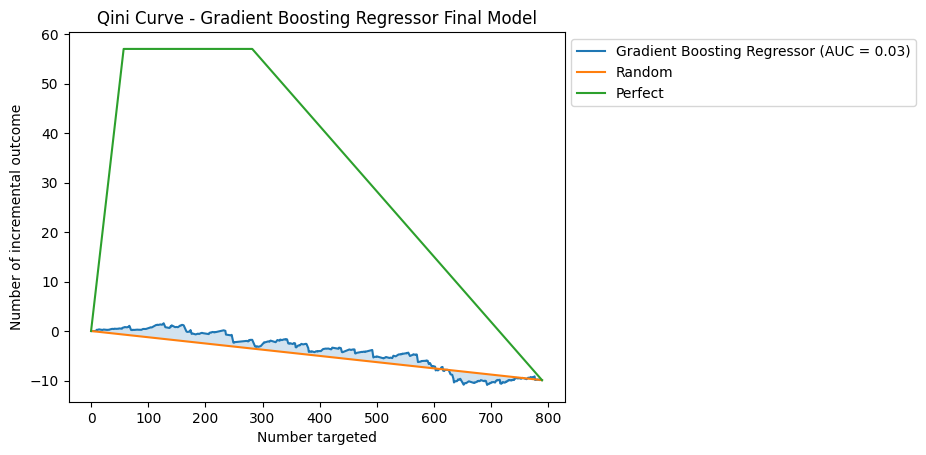

Gradient Boosting Regressor Final Model AUQC: 0.049165102705734404

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


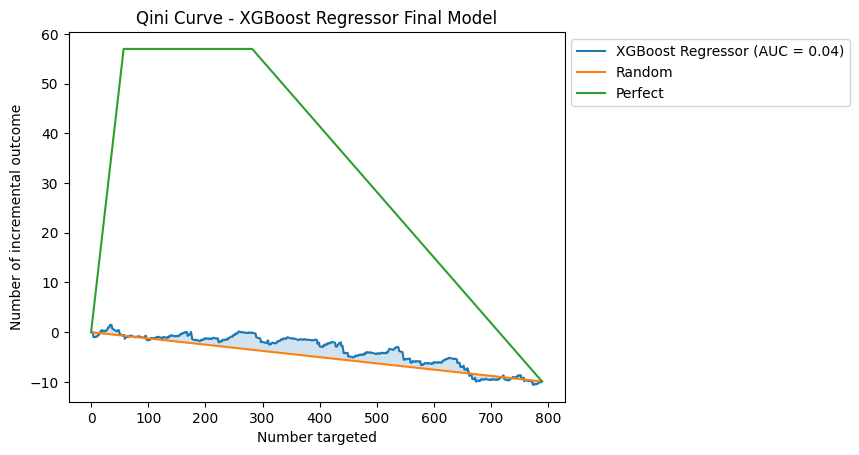

XGBoost Regressor Final Model AUQC: 0.05261232340861557

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


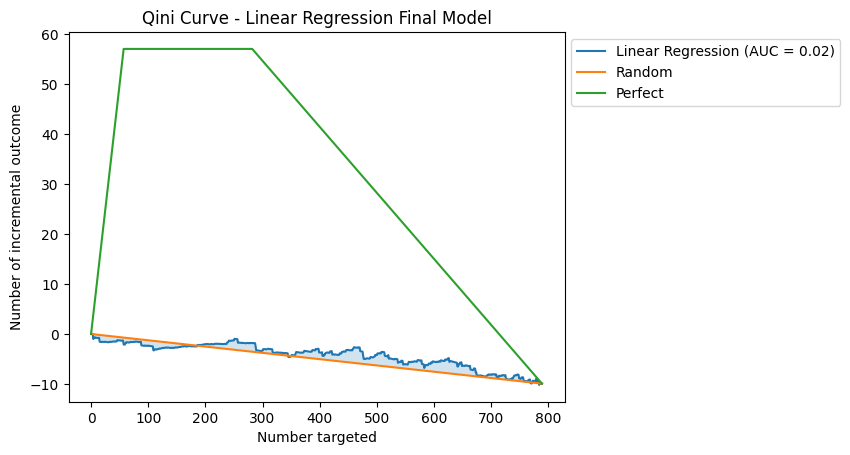

Linear Regression Final Model AUQC: -0.04321623965203769

Evaluating Gradient Boosting for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


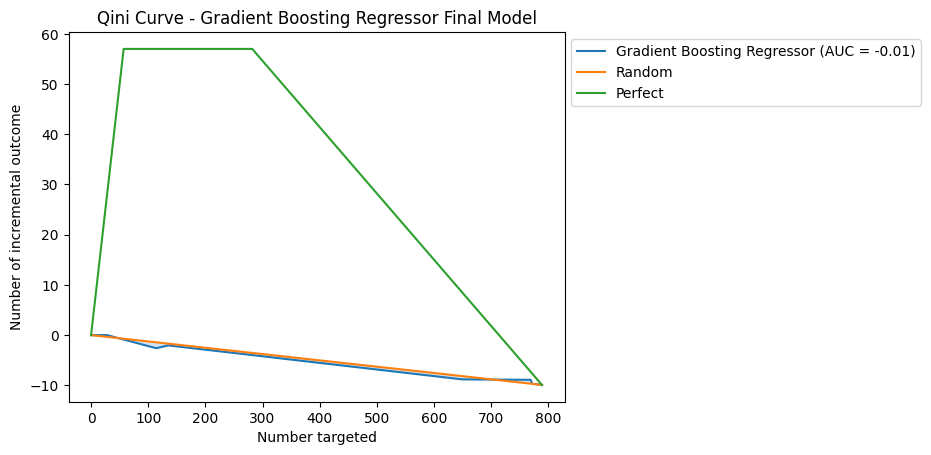

Gradient Boosting Regressor Final Model AUQC: -0.044413926880188276

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


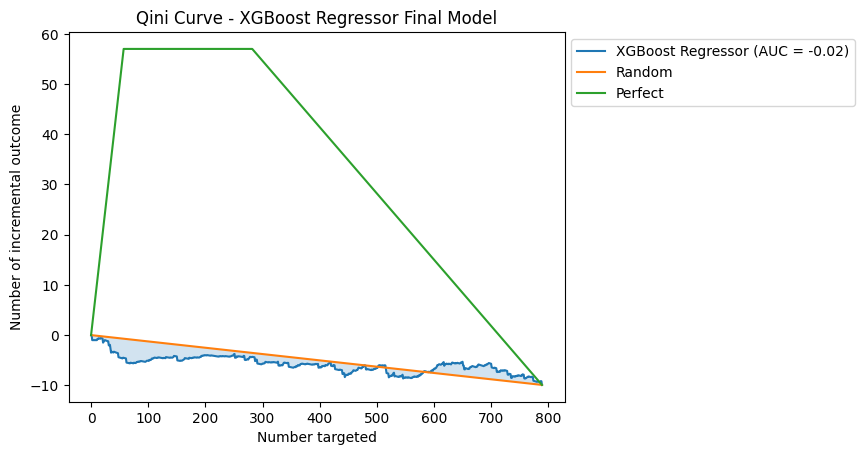

XGBoost Regressor Final Model AUQC: -0.05585901963105547

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


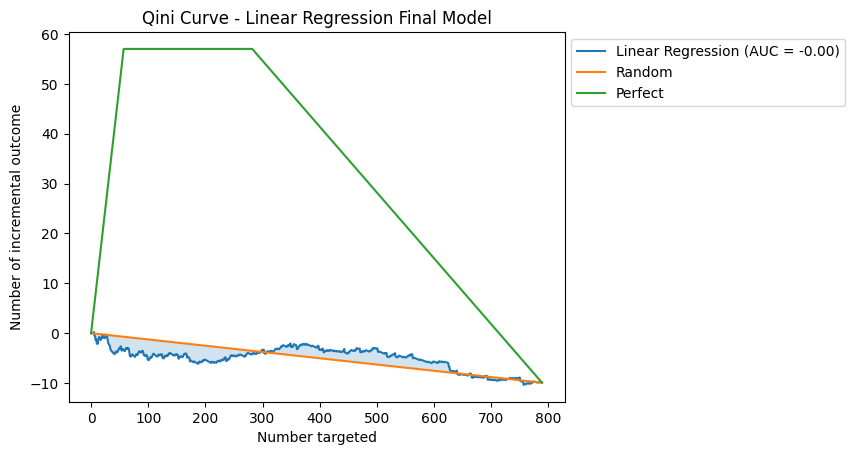

Linear Regression Final Model AUQC: 0.04026546029910765

Evaluating Gradient Boosting for propensity and Random Forest for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


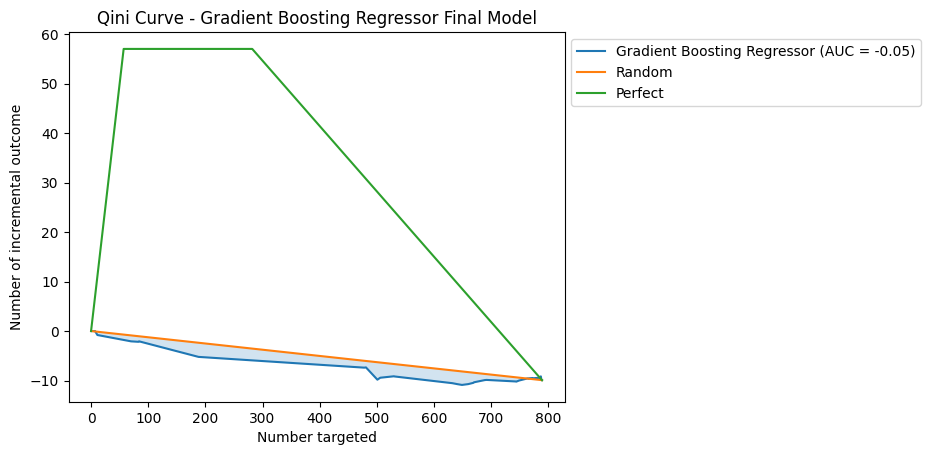

Gradient Boosting Regressor Final Model AUQC: -0.056853423582969

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


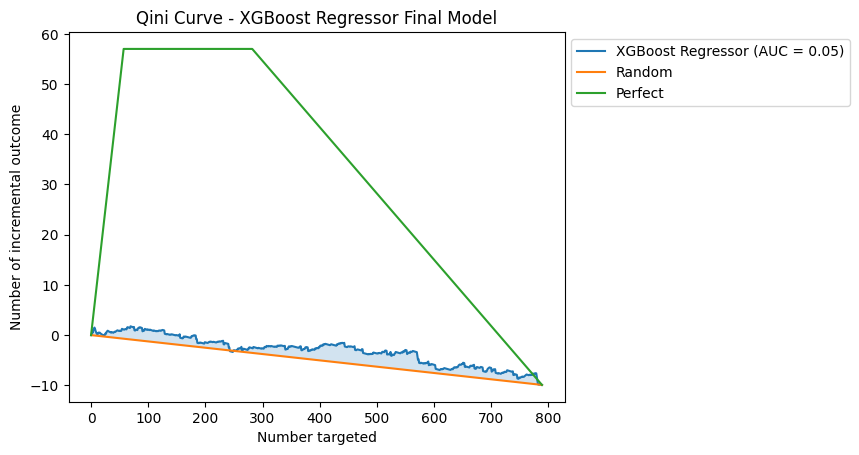

XGBoost Regressor Final Model AUQC: 0.06635106312418133

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


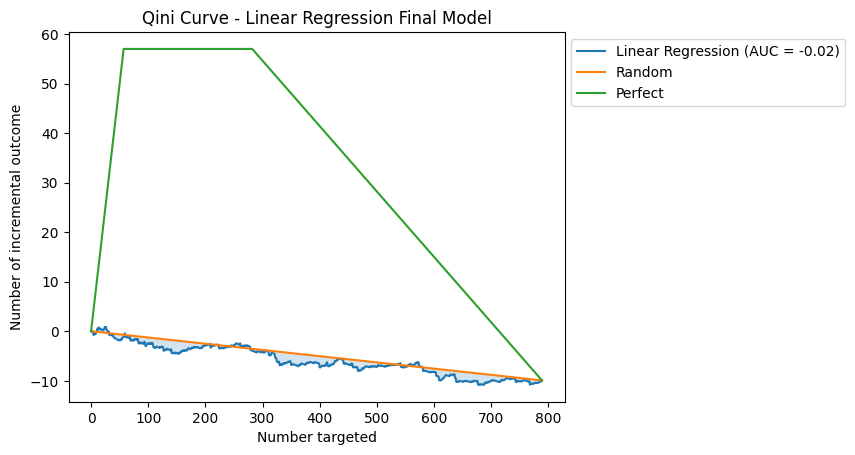

Linear Regression Final Model AUQC: -0.006249968962917594

Evaluating Gradient Boosting for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


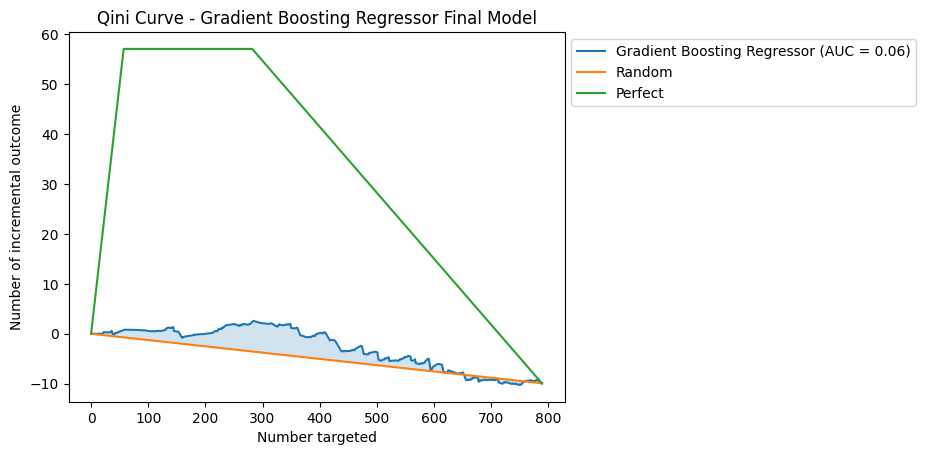

Gradient Boosting Regressor Final Model AUQC: 0.09031697305681402

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


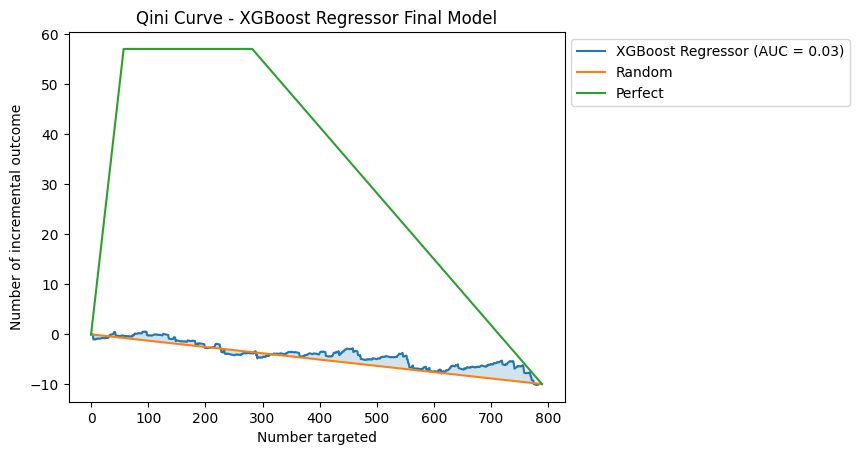

XGBoost Regressor Final Model AUQC: 0.0229338995633754

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


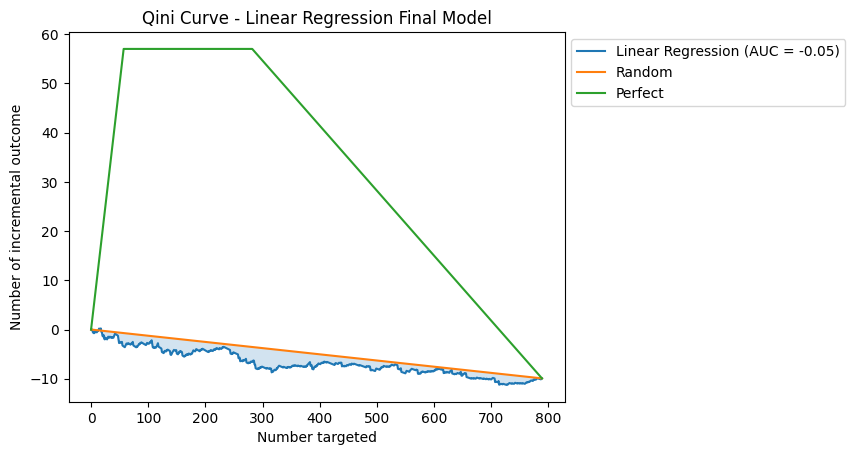

Linear Regression Final Model AUQC: -0.015383768995189393

Evaluating Gradient Boosting for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


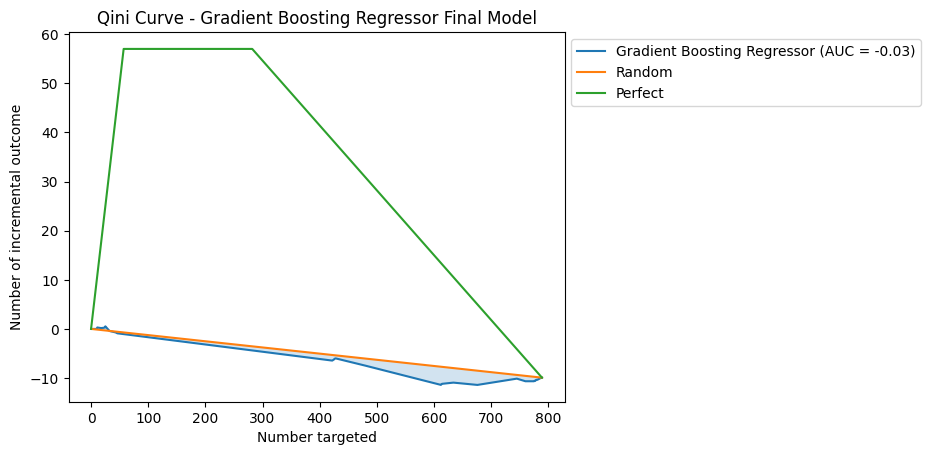

Gradient Boosting Regressor Final Model AUQC: -0.01608536466318771

Evaluating DR-Learner with XGBoost Regressor as the final model...


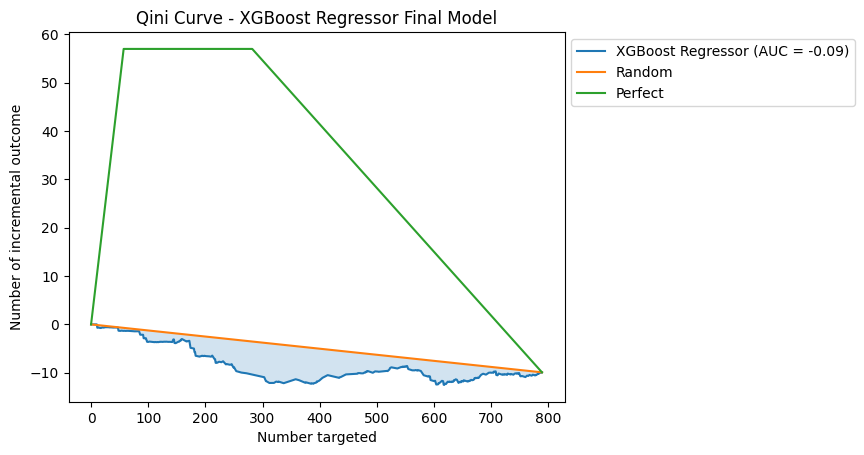

XGBoost Regressor Final Model AUQC: -0.1586240594526322

Evaluating DR-Learner with Linear Regression as the final model...


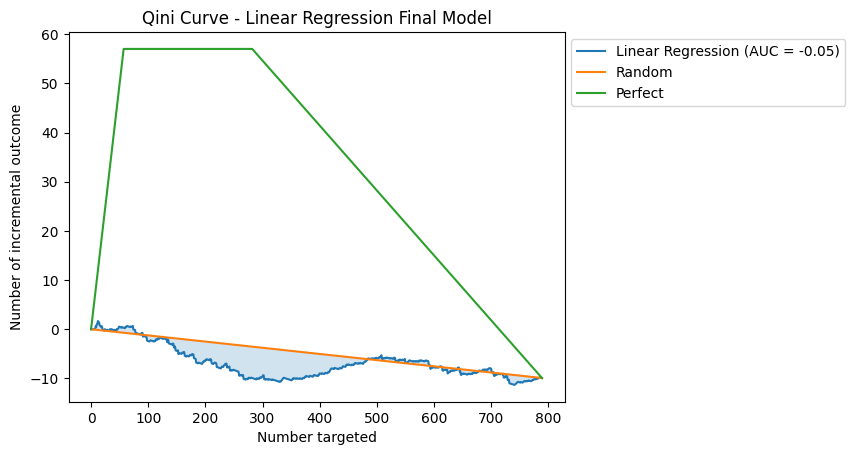

Linear Regression Final Model AUQC: -0.03666169925875178

Evaluating Gradient Boosting for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


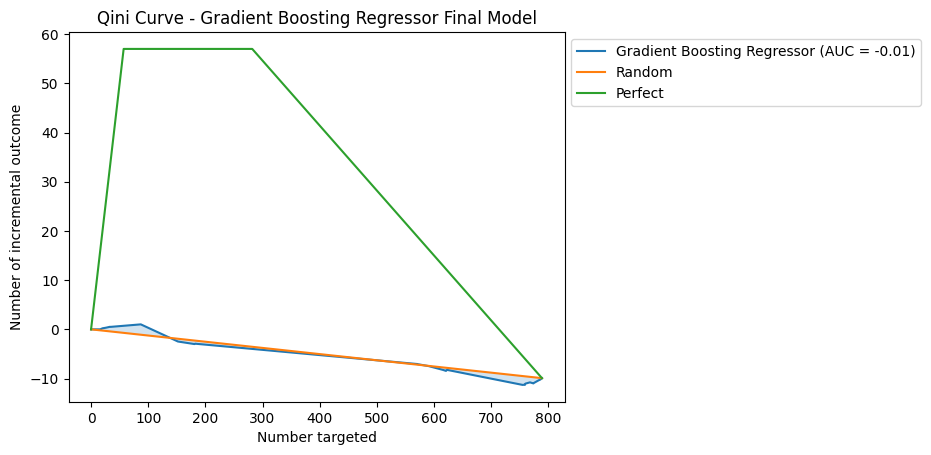

Gradient Boosting Regressor Final Model AUQC: -0.0029431232268668076

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


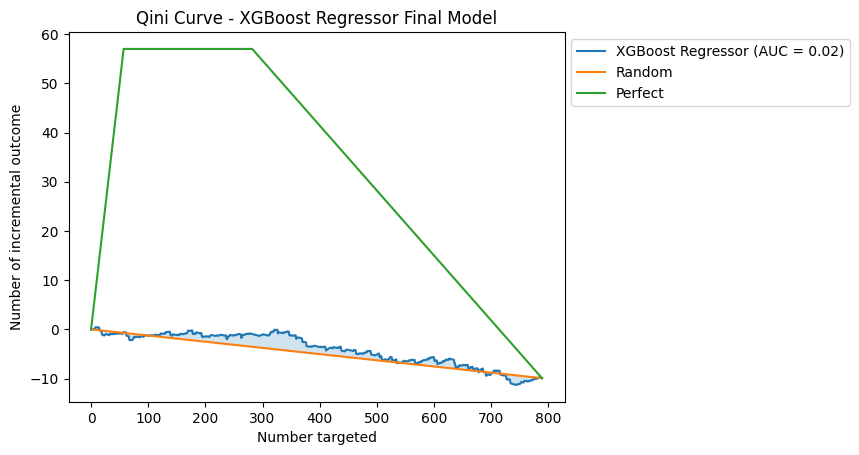

XGBoost Regressor Final Model AUQC: 0.02789783936992202

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


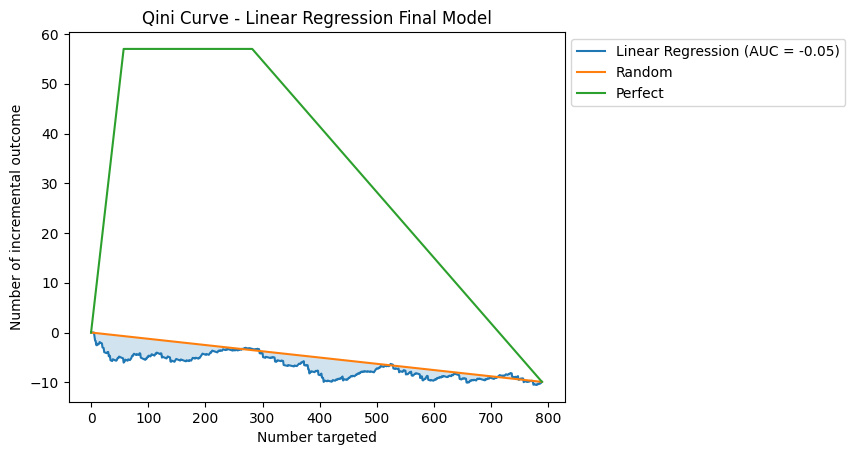

Linear Regression Final Model AUQC: -0.025590247125248846

Evaluating Gradient Boosting for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


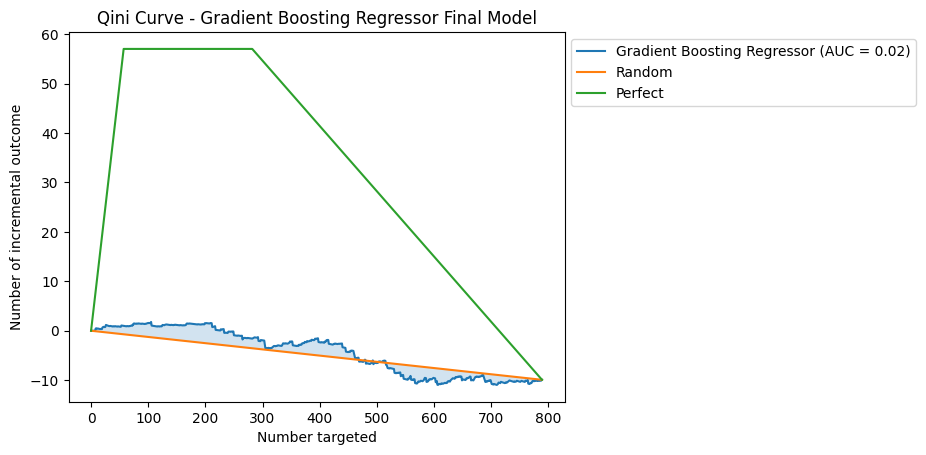

Gradient Boosting Regressor Final Model AUQC: 0.027316422400167604

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


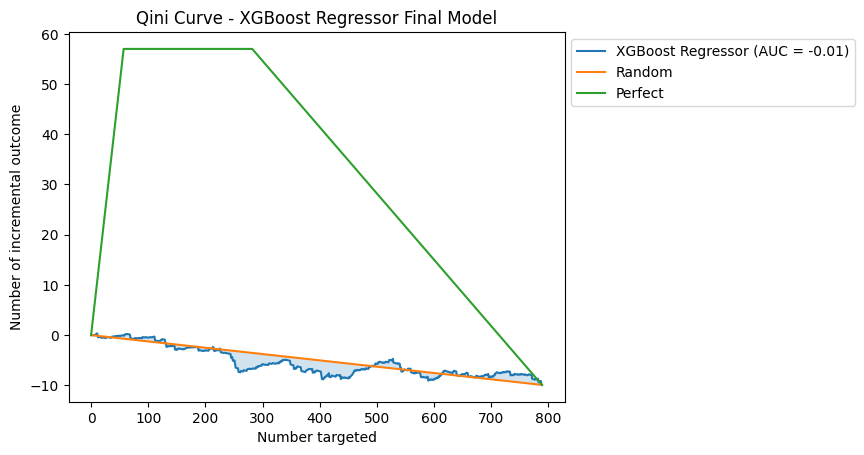

XGBoost Regressor Final Model AUQC: -0.029038077038318216

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


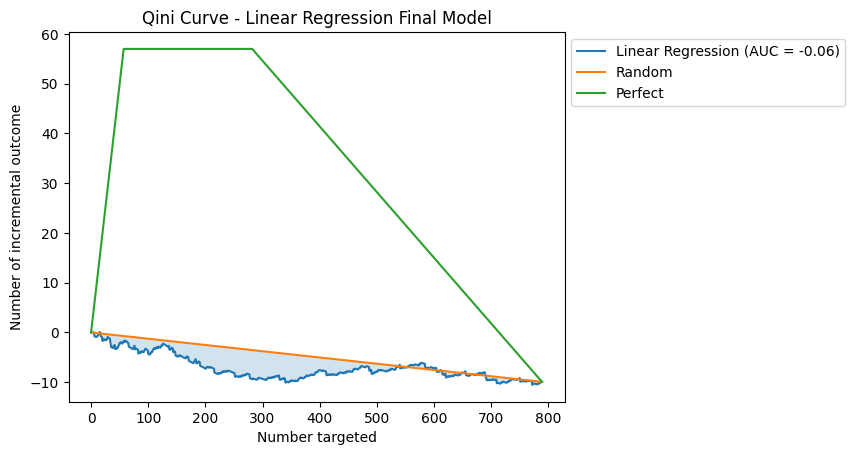

Linear Regression Final Model AUQC: -0.025447360201153943

Evaluating XGBoost for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


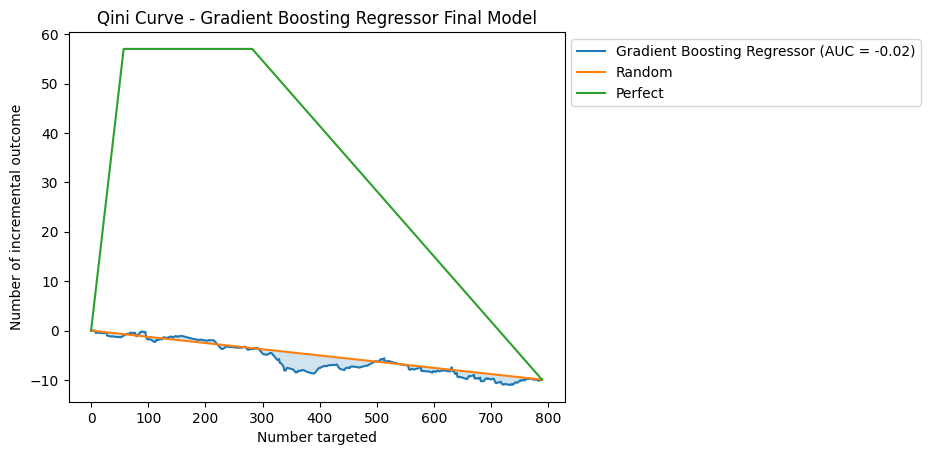

Gradient Boosting Regressor Final Model AUQC: -0.042038392103069595

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


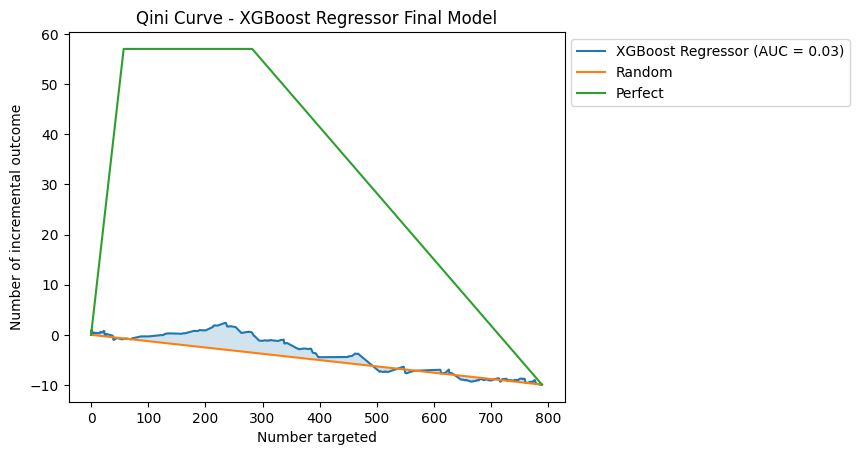

XGBoost Regressor Final Model AUQC: 0.04088290739599374

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


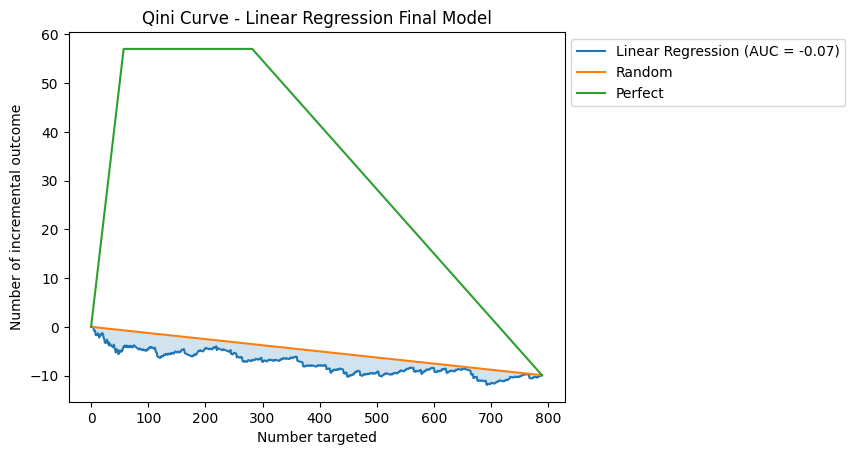

Linear Regression Final Model AUQC: -0.03352915663935411

Evaluating XGBoost for propensity and Random Forest for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


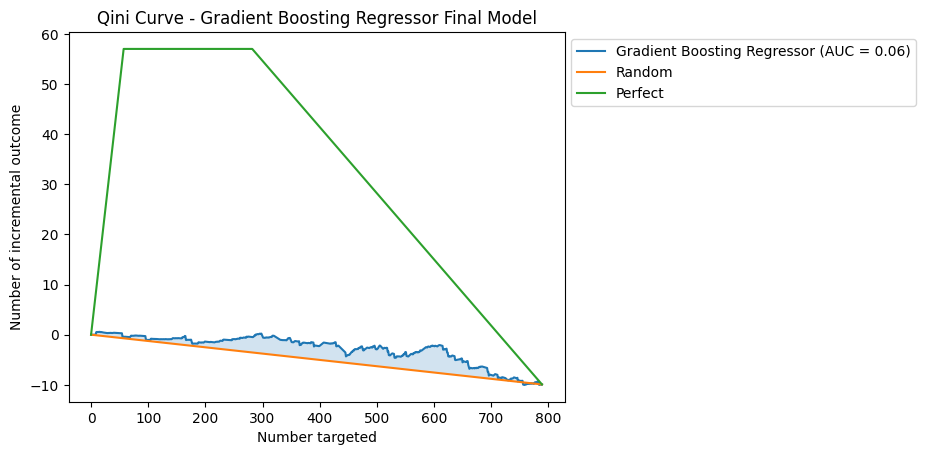

Gradient Boosting Regressor Final Model AUQC: 0.06384545360015141

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


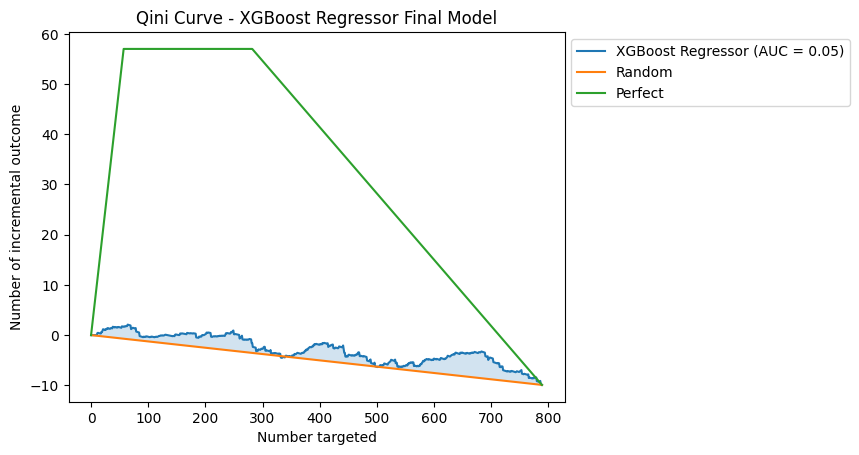

XGBoost Regressor Final Model AUQC: 0.07963247430388234

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


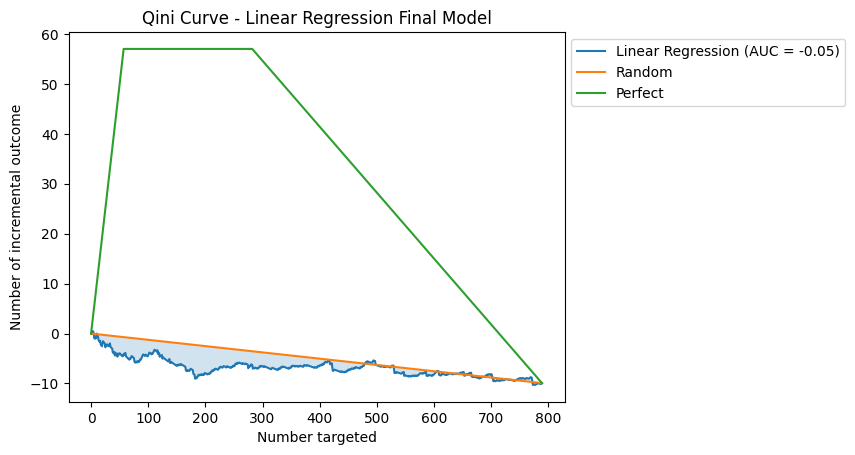

Linear Regression Final Model AUQC: -0.007903760726699904

Evaluating XGBoost for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


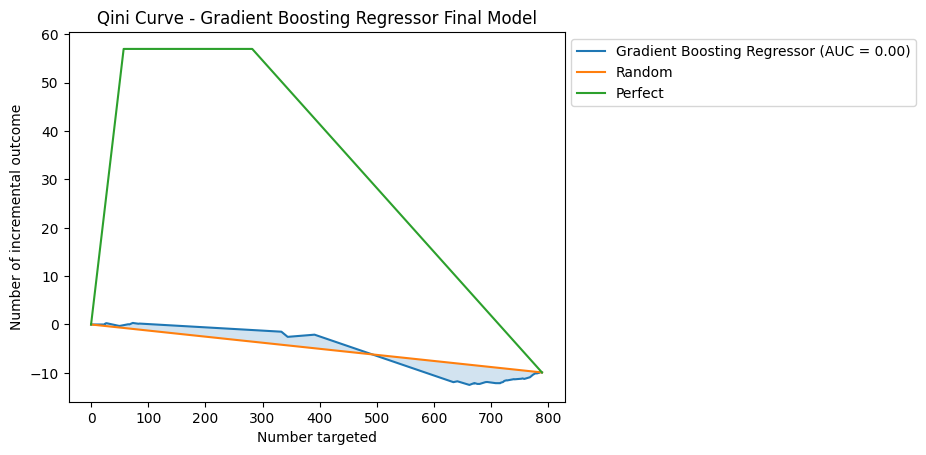

Gradient Boosting Regressor Final Model AUQC: 0.014946796793353319

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


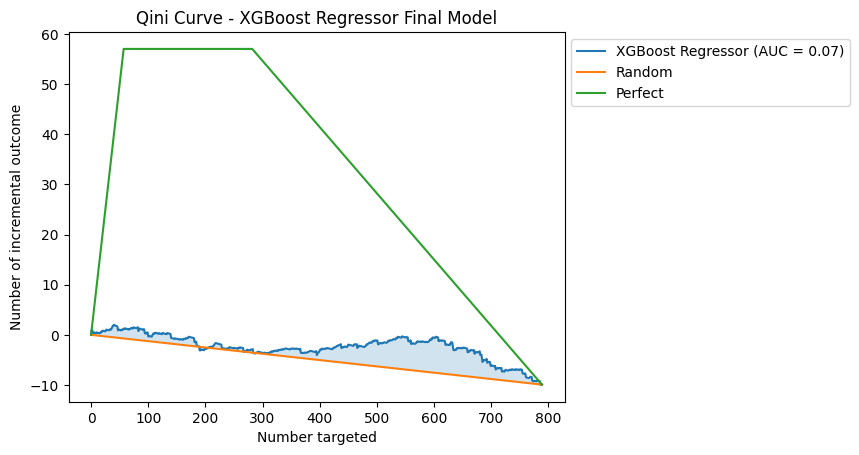

XGBoost Regressor Final Model AUQC: 0.09380900778841994

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


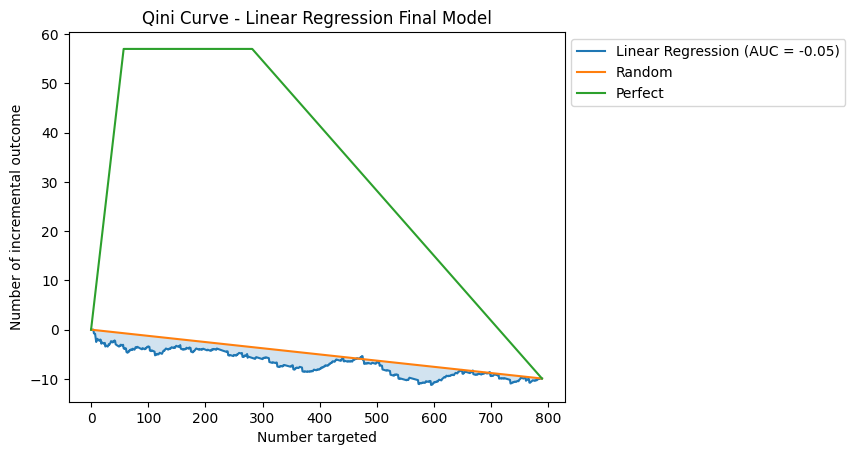

Linear Regression Final Model AUQC: -0.04074507799042614

Evaluating XGBoost for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


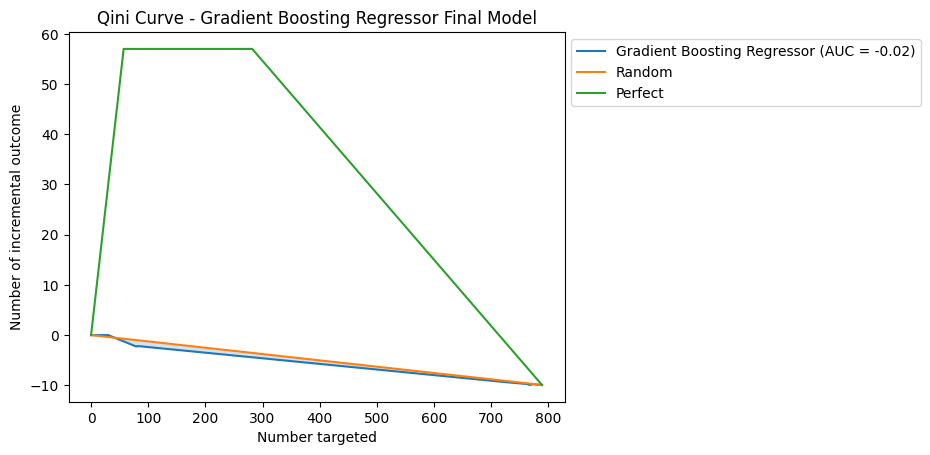

Gradient Boosting Regressor Final Model AUQC: -0.03821753483523811

Evaluating DR-Learner with XGBoost Regressor as the final model...


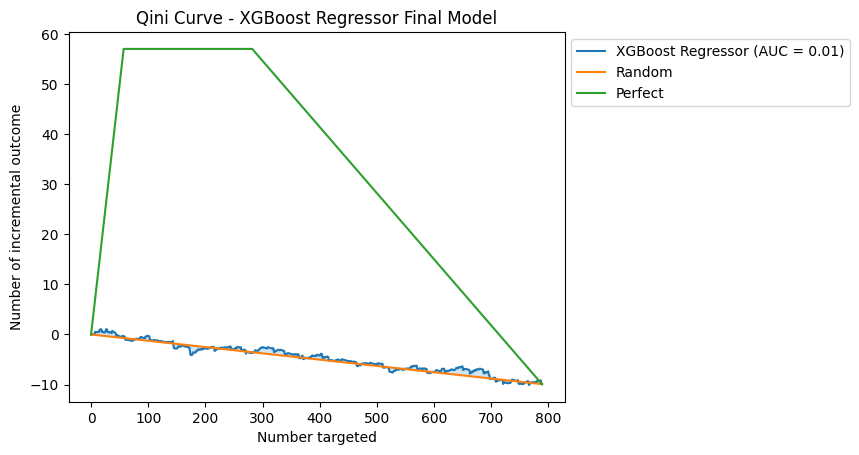

XGBoost Regressor Final Model AUQC: 0.00512723658354792

Evaluating DR-Learner with Linear Regression as the final model...


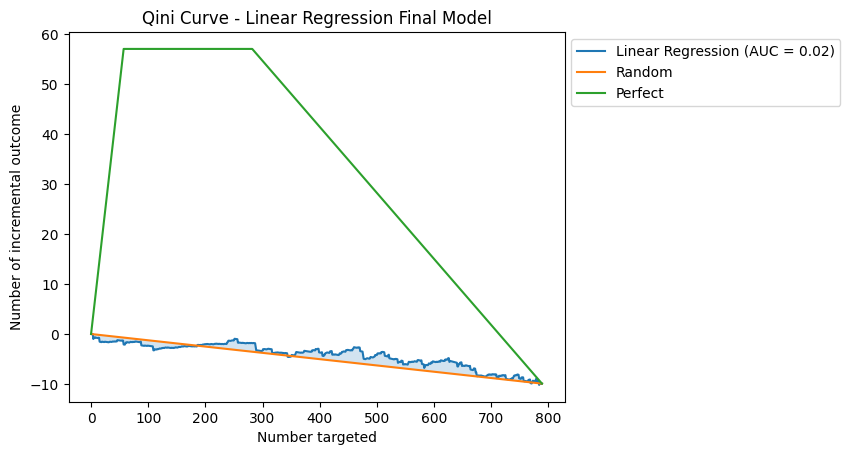

Linear Regression Final Model AUQC: -0.04323684877993852

Evaluating XGBoost for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


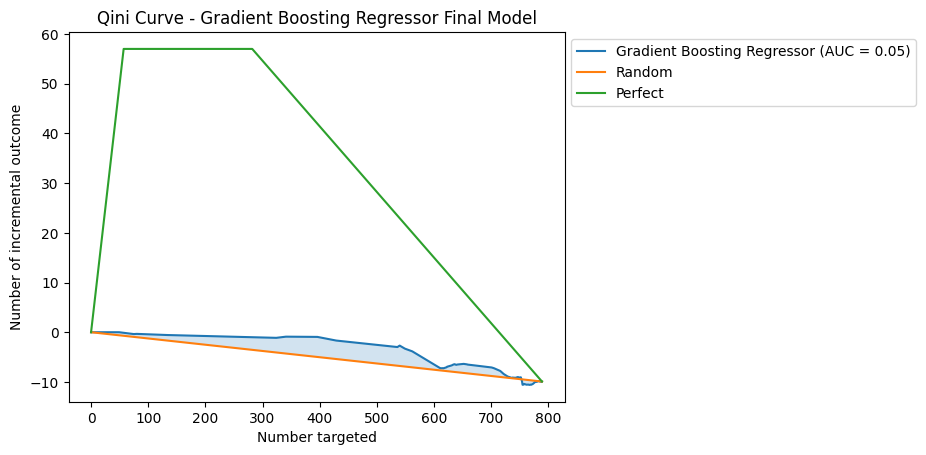

Gradient Boosting Regressor Final Model AUQC: 0.06797950325533982

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


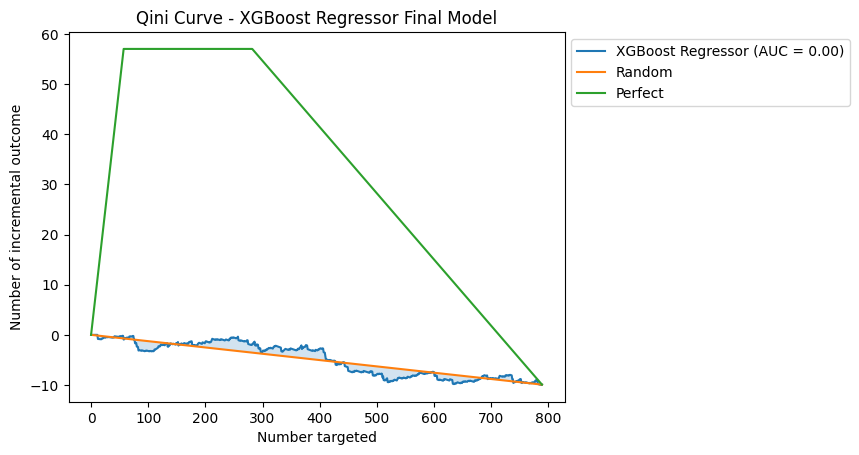

XGBoost Regressor Final Model AUQC: 0.013710256651610861

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


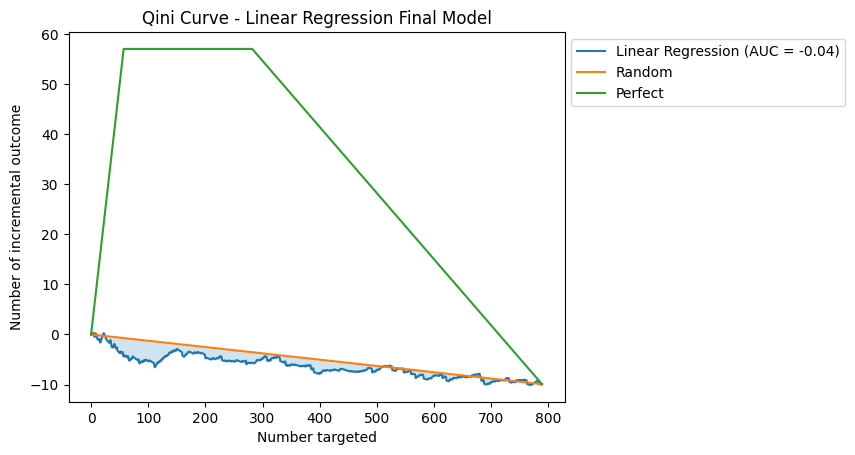

Linear Regression Final Model AUQC: -0.015057711061891087

Evaluating XGBoost for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


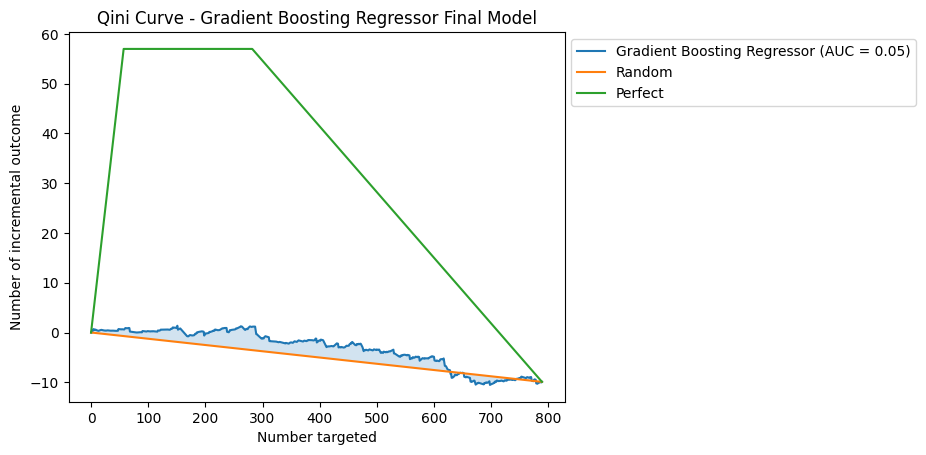

Gradient Boosting Regressor Final Model AUQC: 0.07459258210084588

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


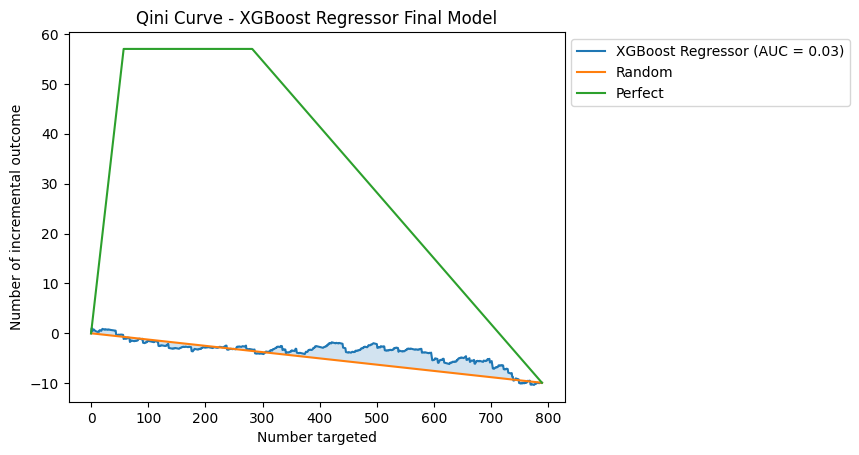

XGBoost Regressor Final Model AUQC: 0.03724000288448747

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


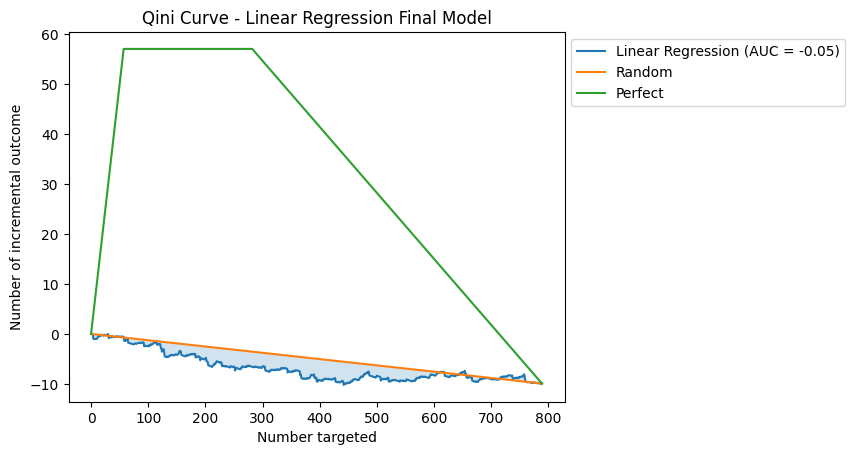

Linear Regression Final Model AUQC: -0.04441829511518605

Evaluating SVM for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


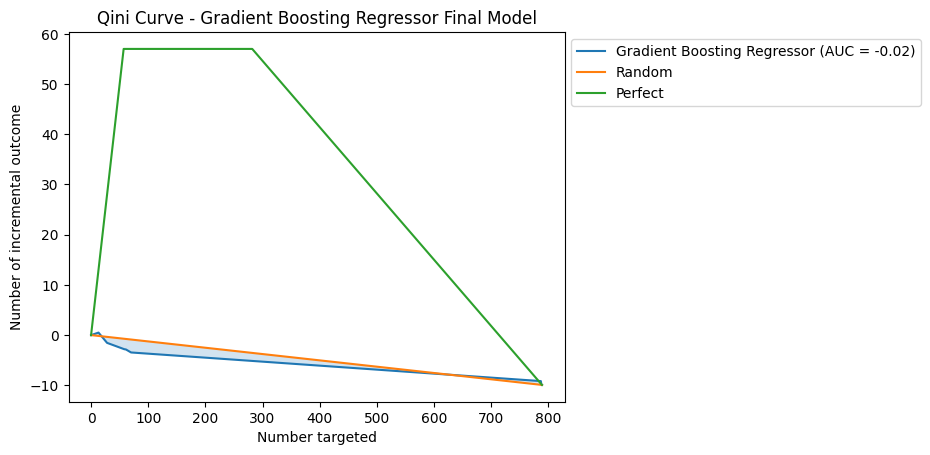

Gradient Boosting Regressor Final Model AUQC: -0.0195777209401809

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


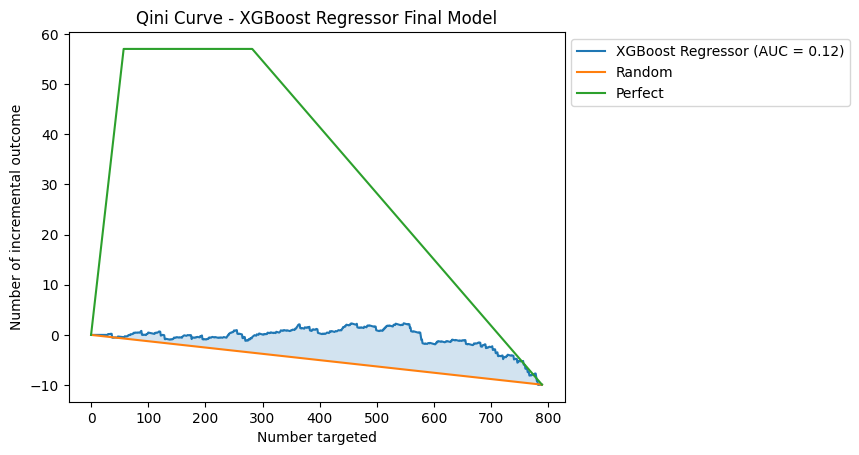

XGBoost Regressor Final Model AUQC: 0.1623310495896851

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


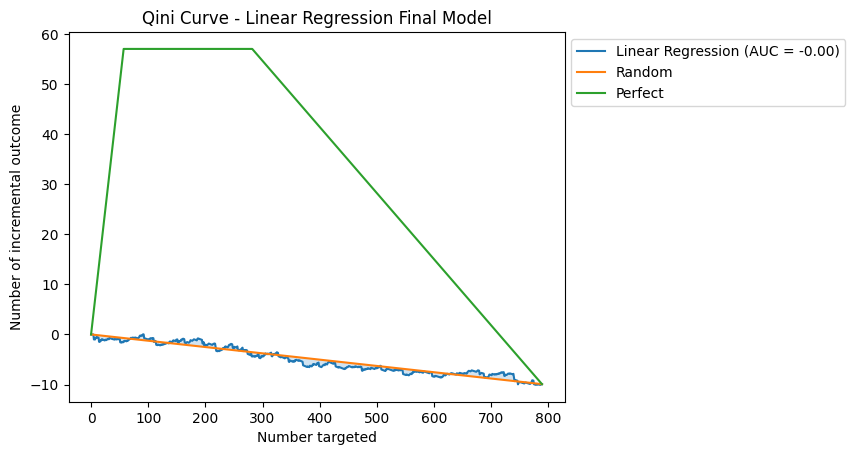

Linear Regression Final Model AUQC: 0.012075957268278587

Evaluating SVM for propensity and Random Forest for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


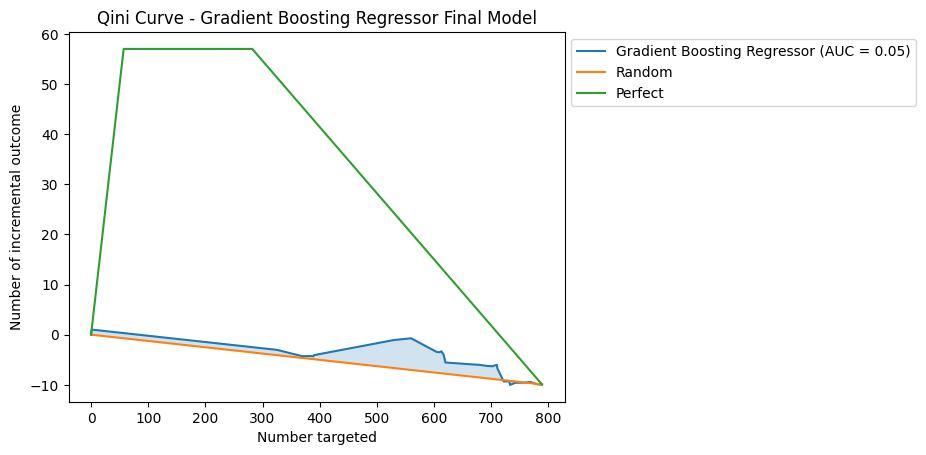

Gradient Boosting Regressor Final Model AUQC: 0.06488621282475816

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


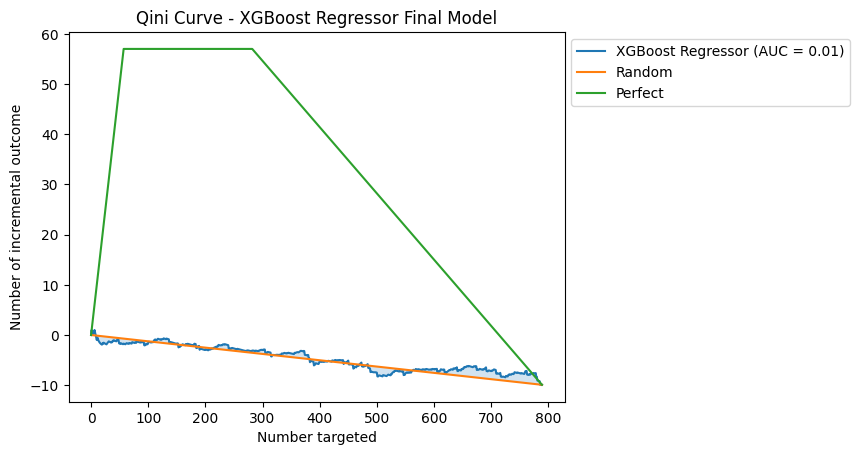

XGBoost Regressor Final Model AUQC: 0.004225265006083178

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


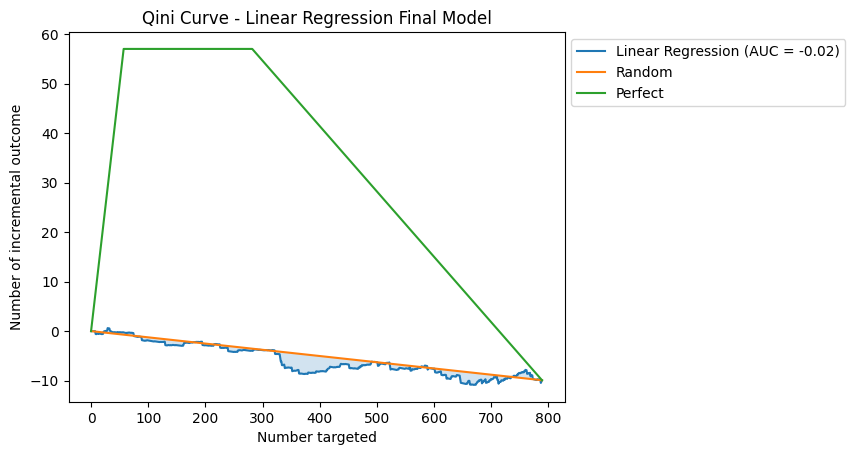

Linear Regression Final Model AUQC: -0.16793094284183208

Evaluating SVM for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


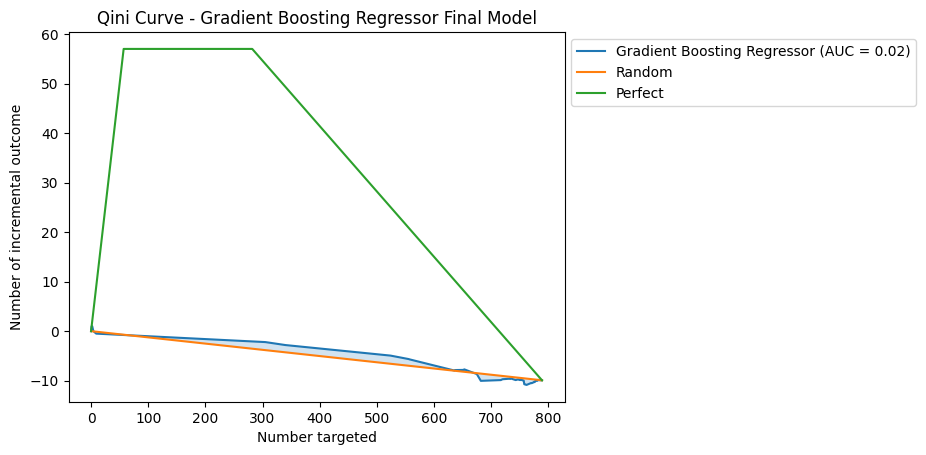

Gradient Boosting Regressor Final Model AUQC: 0.03701397029605768

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


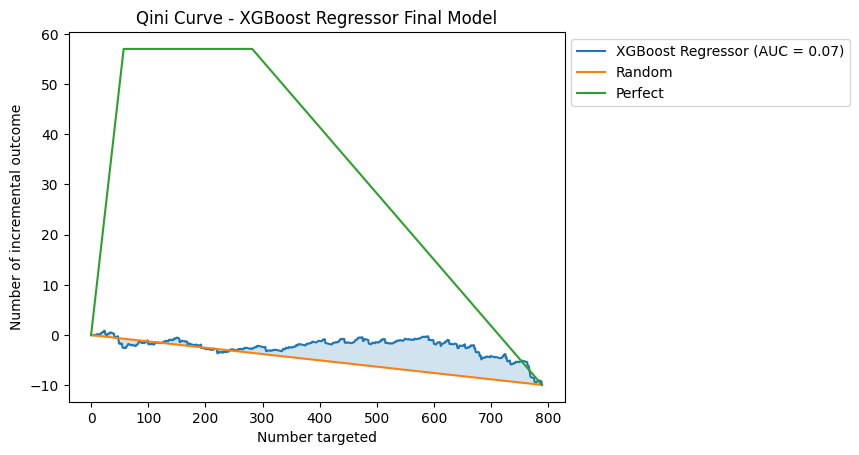

XGBoost Regressor Final Model AUQC: 0.09983538494593493

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


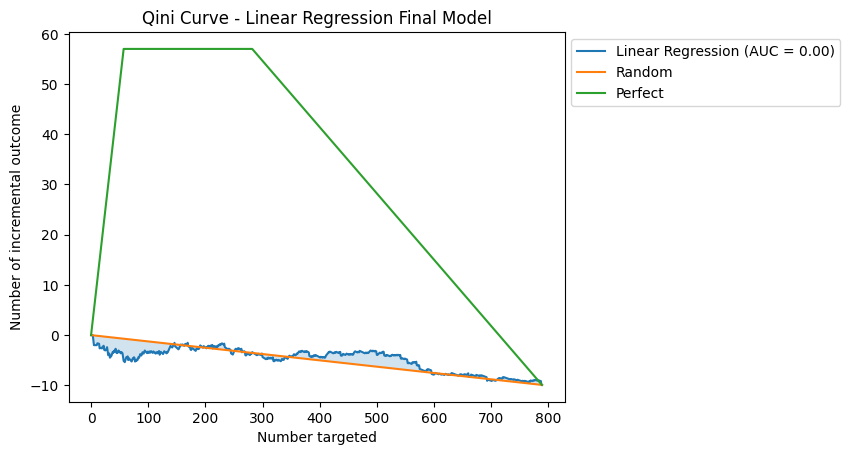

Linear Regression Final Model AUQC: 0.05056813078080955

Evaluating SVM for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


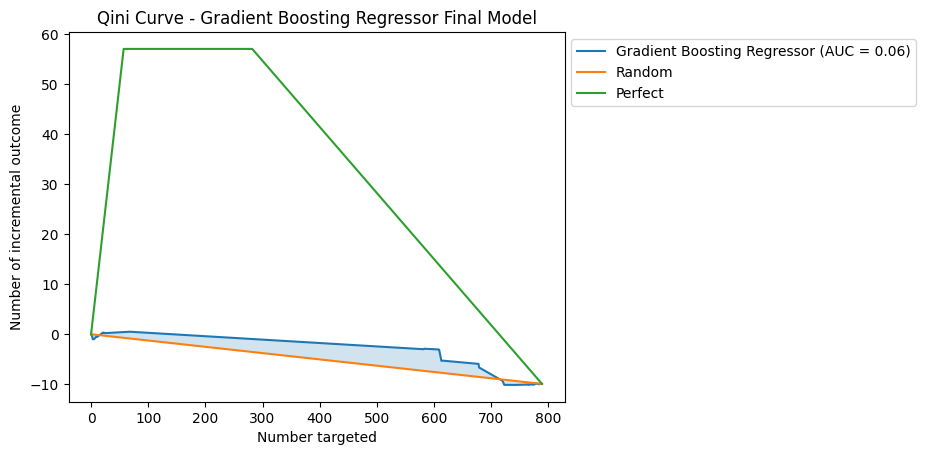

Gradient Boosting Regressor Final Model AUQC: 0.09577006872490562

Evaluating DR-Learner with XGBoost Regressor as the final model...


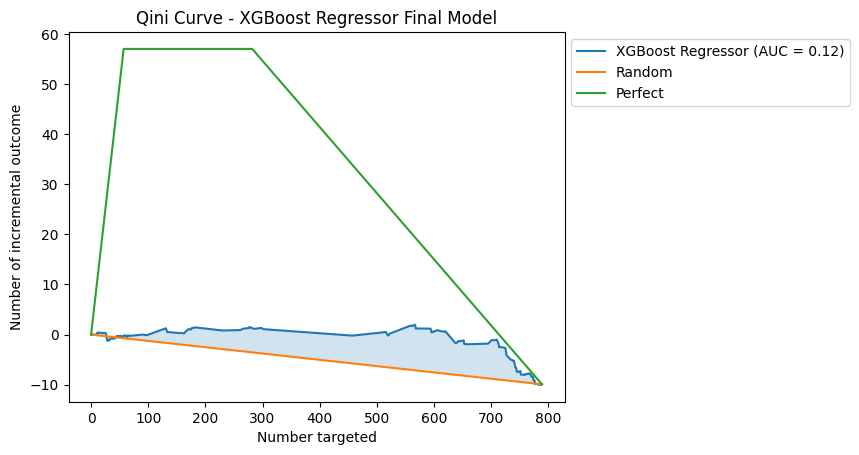

XGBoost Regressor Final Model AUQC: 0.1722950577427866

Evaluating DR-Learner with Linear Regression as the final model...


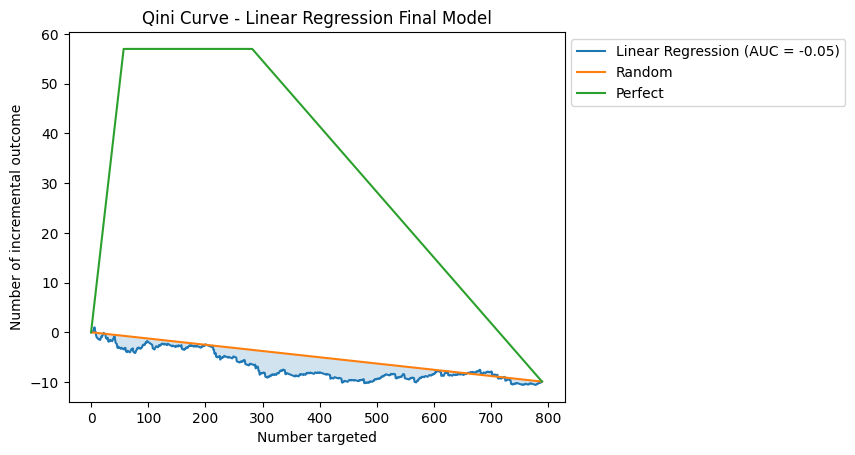

Linear Regression Final Model AUQC: -0.024601696425058803

Evaluating SVM for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


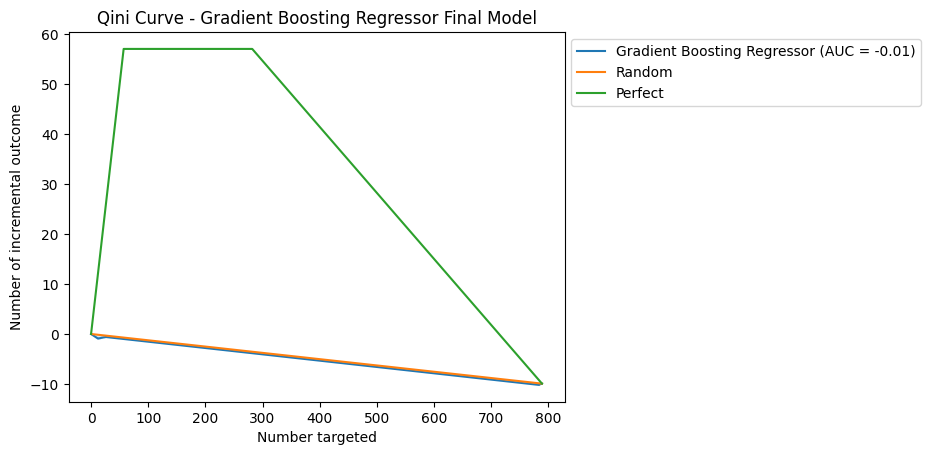

Gradient Boosting Regressor Final Model AUQC: -0.038591212115246395

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


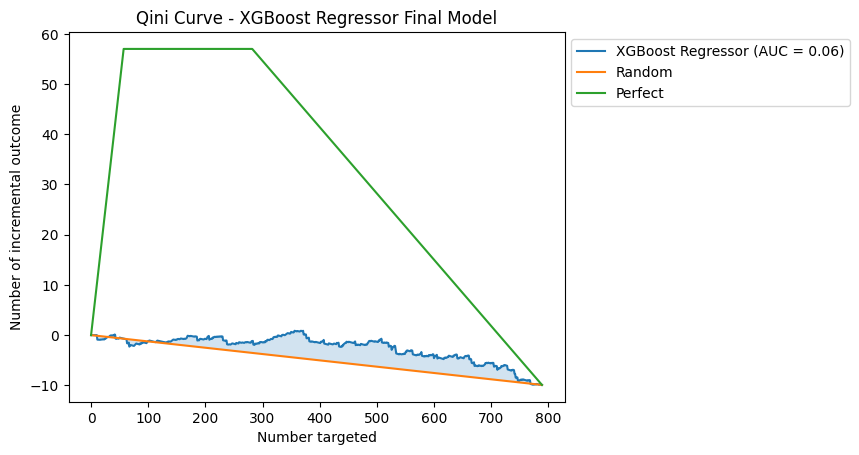

XGBoost Regressor Final Model AUQC: 0.08874428170102303

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


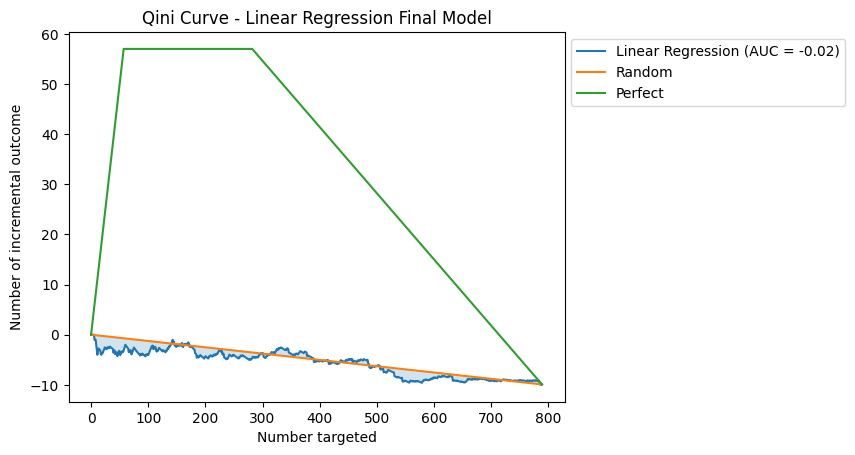

Linear Regression Final Model AUQC: 0.03142284887406694

Evaluating SVM for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


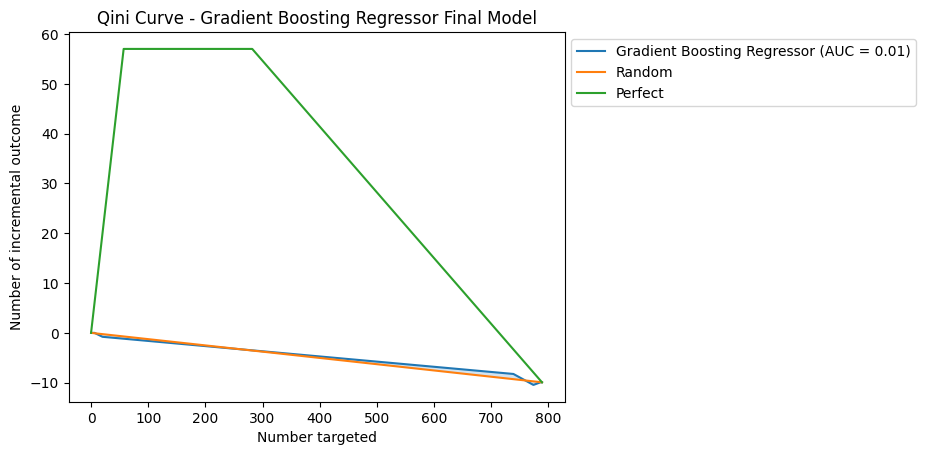

Gradient Boosting Regressor Final Model AUQC: -0.008322849047115652

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


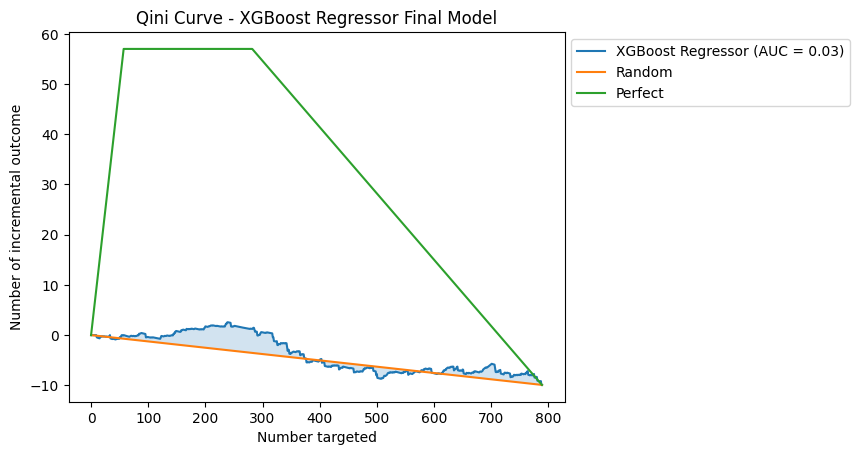

XGBoost Regressor Final Model AUQC: 0.042709659064321004

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


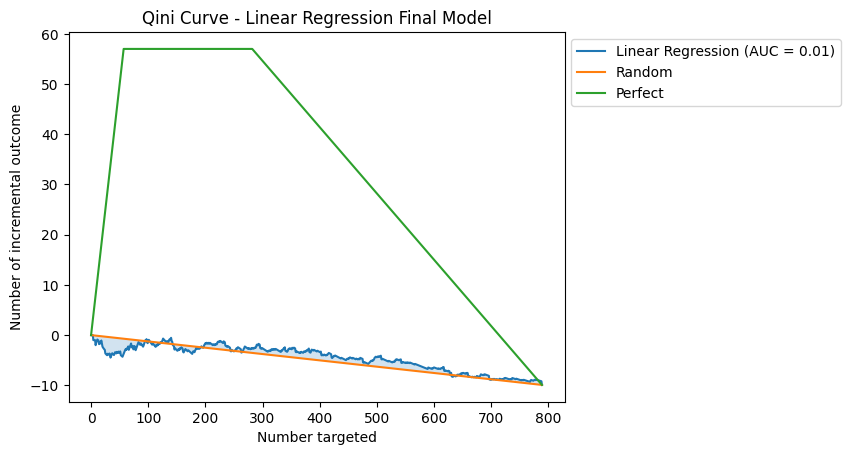

Linear Regression Final Model AUQC: 0.05301408011193592

Evaluating K-Nearest Neighbors for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


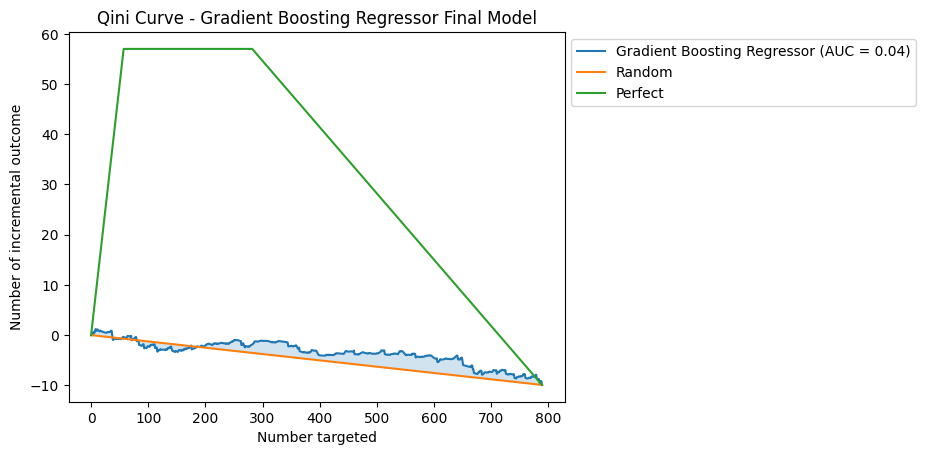

Gradient Boosting Regressor Final Model AUQC: 0.055524758134262046

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


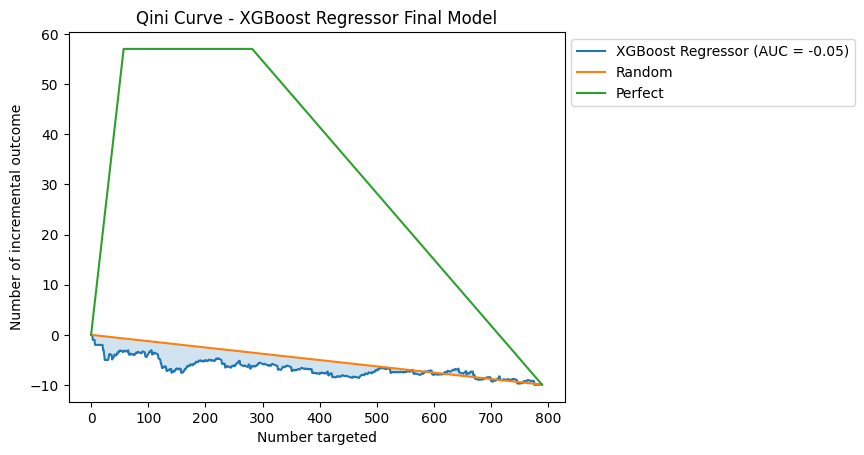

XGBoost Regressor Final Model AUQC: -0.01707191710505272

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


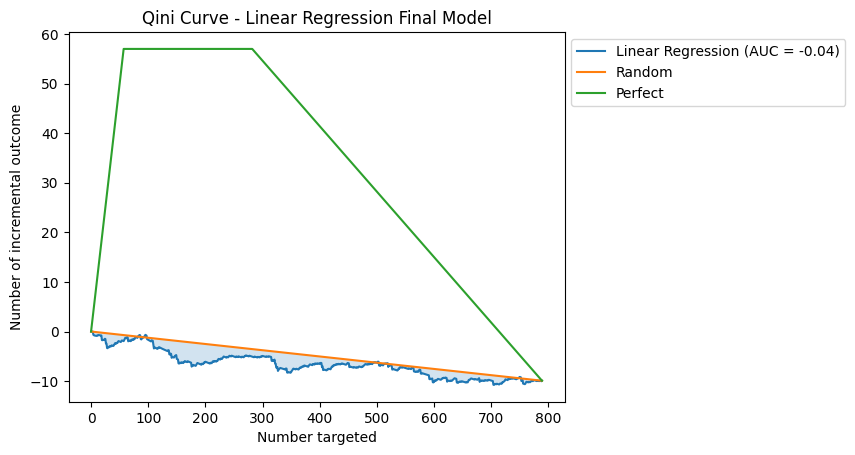

Linear Regression Final Model AUQC: -0.025504001841296635

Evaluating K-Nearest Neighbors for propensity and Random Forest for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


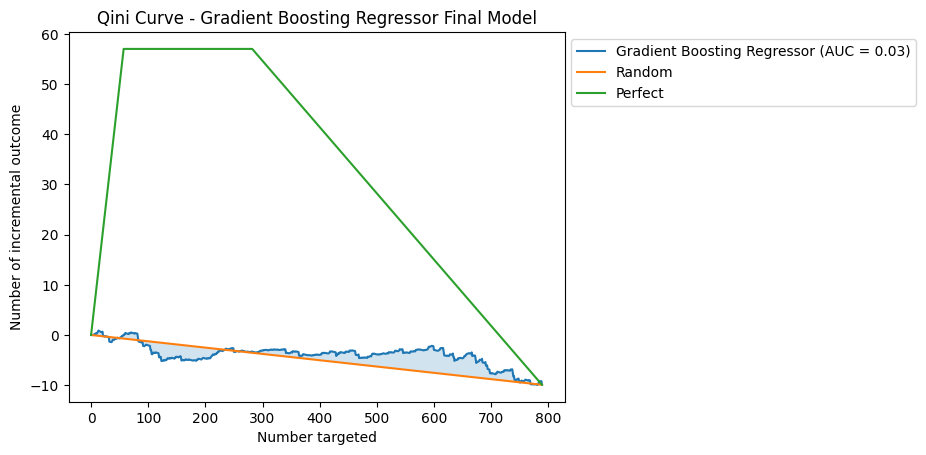

Gradient Boosting Regressor Final Model AUQC: 0.02529499992967455

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


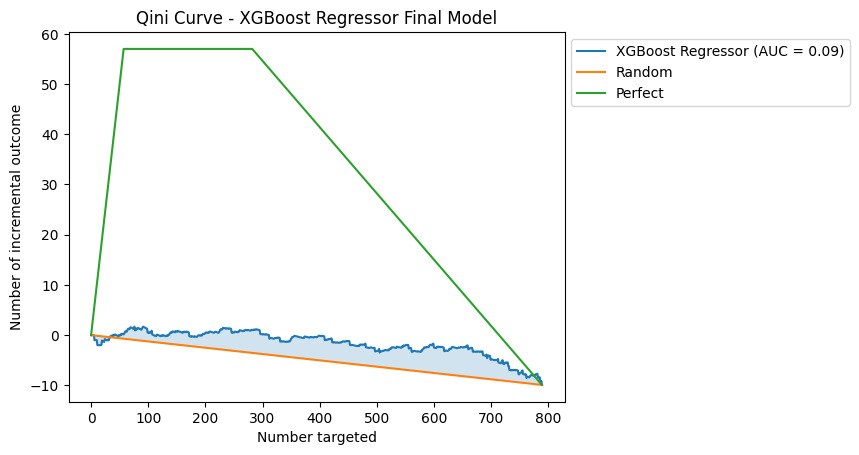

XGBoost Regressor Final Model AUQC: 0.11661022903938432

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


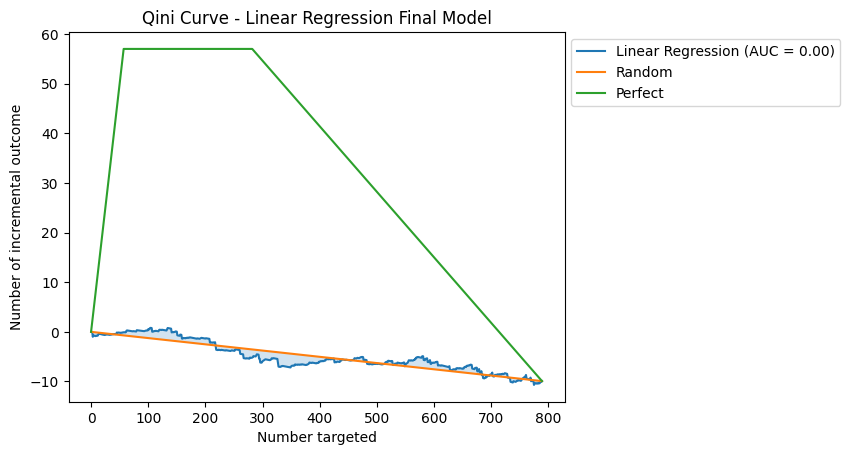

Linear Regression Final Model AUQC: -0.03877525068940938

Evaluating K-Nearest Neighbors for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


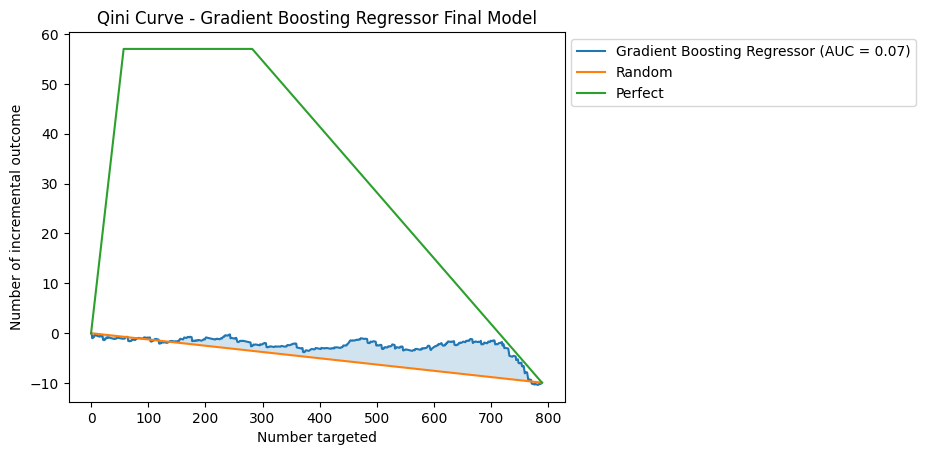

Gradient Boosting Regressor Final Model AUQC: 0.08581243268040335

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


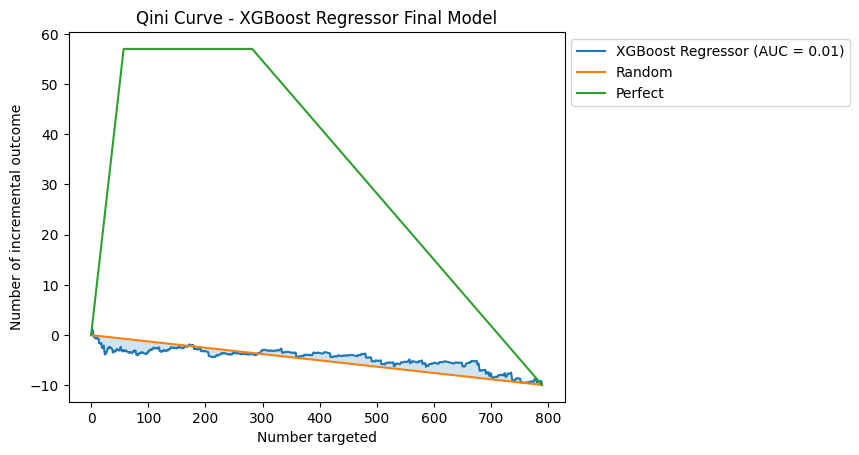

XGBoost Regressor Final Model AUQC: 0.0089911922510236

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


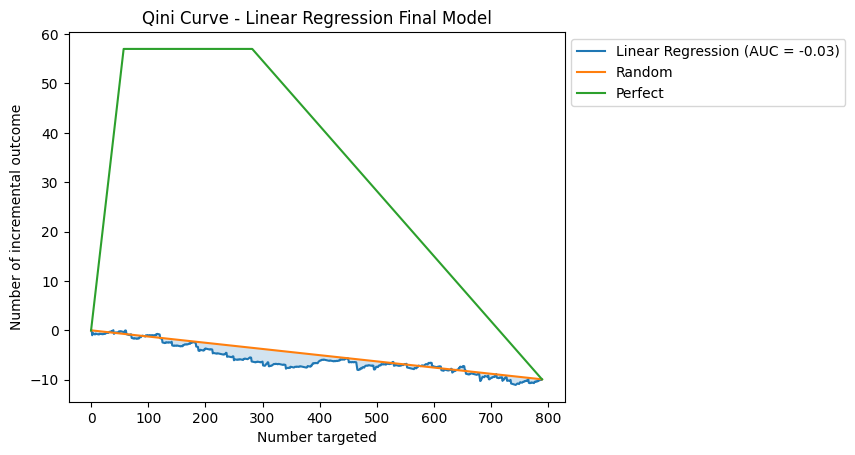

Linear Regression Final Model AUQC: -0.06047808857507075

Evaluating K-Nearest Neighbors for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


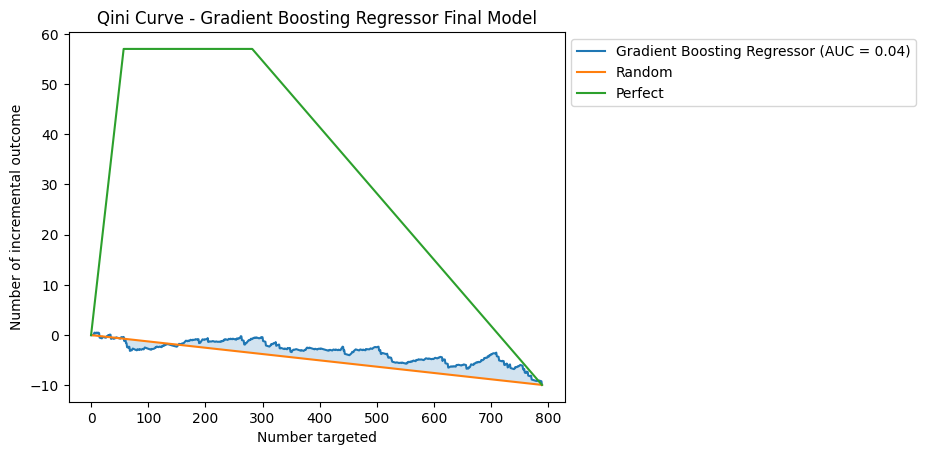

Gradient Boosting Regressor Final Model AUQC: 0.0652478109333516

Evaluating DR-Learner with XGBoost Regressor as the final model...


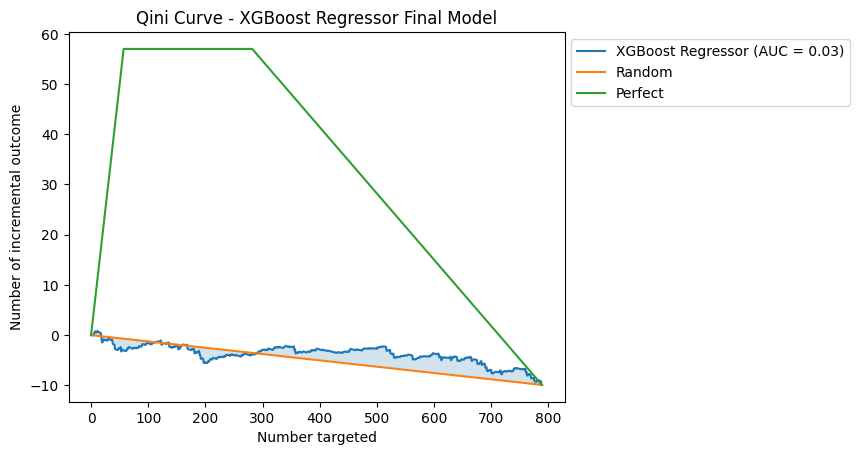

XGBoost Regressor Final Model AUQC: 0.05256144007884471

Evaluating DR-Learner with Linear Regression as the final model...


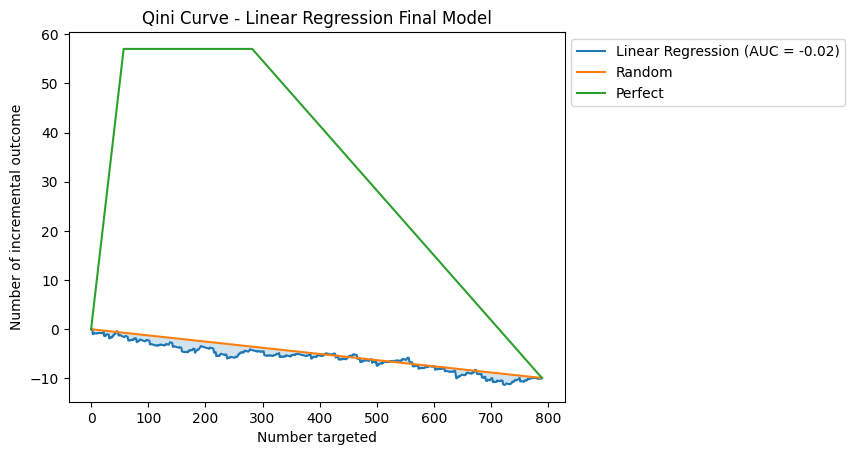

Linear Regression Final Model AUQC: -0.030078272383886107

Evaluating K-Nearest Neighbors for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


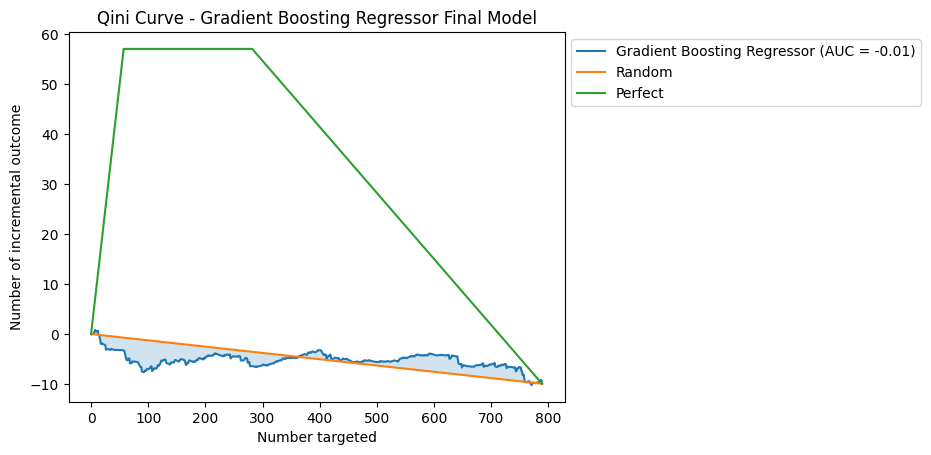

Gradient Boosting Regressor Final Model AUQC: 0.025598153262104992

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


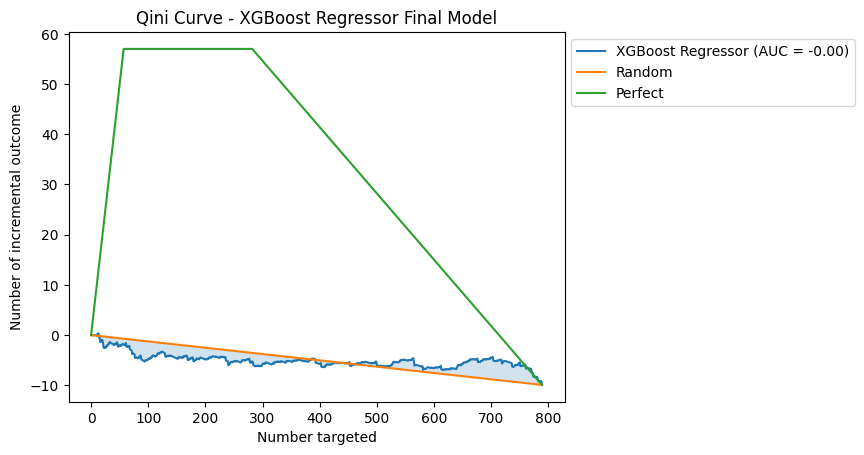

XGBoost Regressor Final Model AUQC: 0.005175686721514523

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


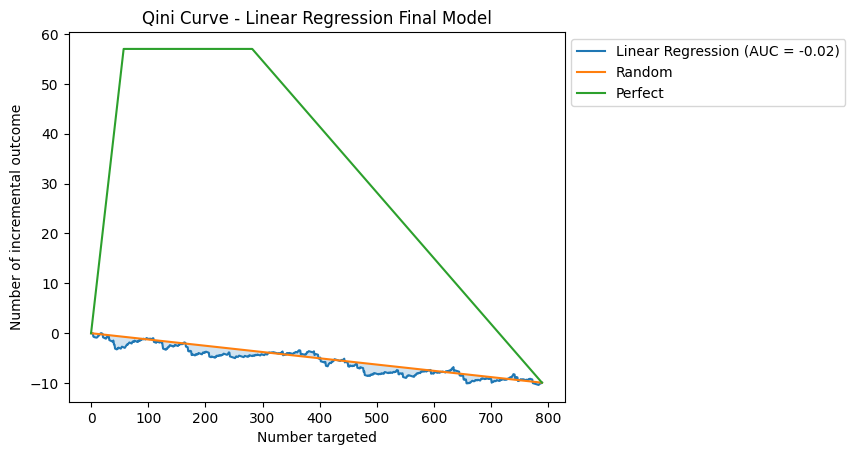

Linear Regression Final Model AUQC: -0.006600828515030044

Evaluating K-Nearest Neighbors for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


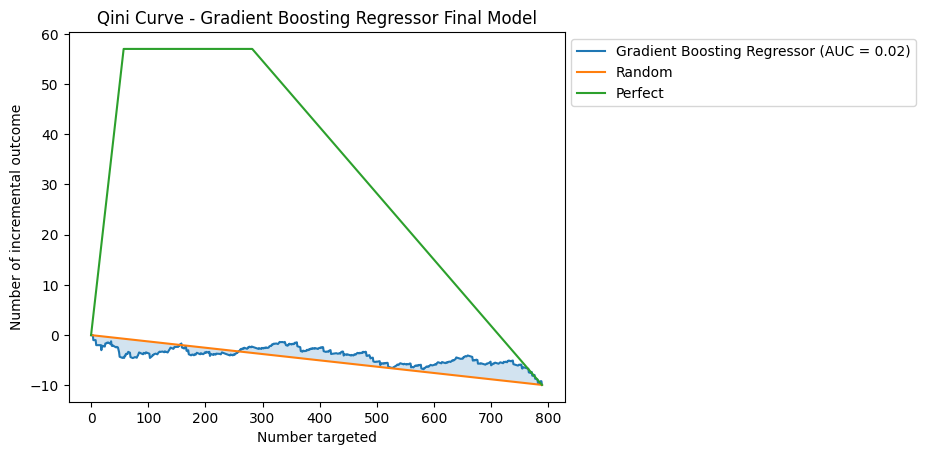

Gradient Boosting Regressor Final Model AUQC: 0.05955273902805879

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


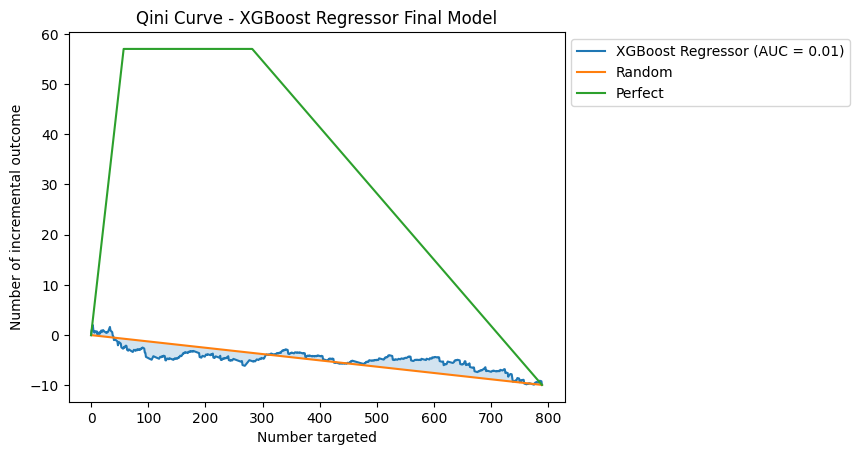

XGBoost Regressor Final Model AUQC: 0.022342541080492242

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


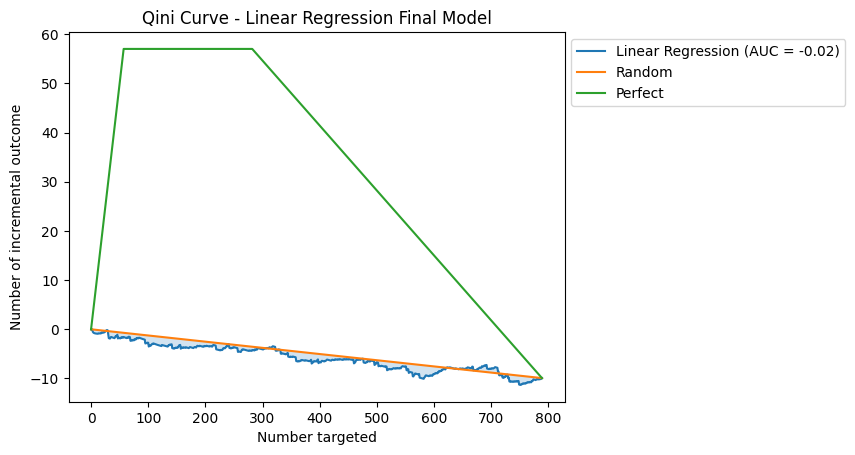

Linear Regression Final Model AUQC: -0.030394154673926813

Model comparison results:
Logistic Regression Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: 0.06024669405143106
Logistic Regression Propensity and Logistic Regression Regression with XGBoost Regressor Final: -0.017983686702960407
Logistic Regression Propensity and Logistic Regression Regression with Linear Regression Final: -0.03553614135971187
Logistic Regression Propensity and Random Forest Regression with Gradient Boosting Regressor Final: -0.03289566152465979
Logistic Regression Propensity and Random Forest Regression with XGBoost Regressor Final: 0.04098033858753519
Logistic Regression Propensity and Random Forest Regression with Linear Regression Final: -0.012166180099890636
Logistic Regression Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.031451051000129654
Logistic Regression Propensity and Gradient Boosting Regression with XGBoost Regressor

In [8]:
# Define models and parameter grids for grid search
propensity_models = {
    'Logistic Regression': (LogisticRegression(random_state=768), {
        'C': [0.1, 1.0, 10.0],
        'solver': ['lbfgs', 'liblinear']
    }),
    'Random Forest': (RandomForestClassifier(random_state=768), {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=768), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    }),
    'XGBoost': (XGBClassifier(random_state=768), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    }),
    'SVM': (SVC(probability=True, random_state=768), {
        'C': [0.1, 1.0, 10.0],
        'kernel': ['linear', 'rbf']
    }),
    'K-Nearest Neighbors': (KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7]
    })
}

# Automated pipeline function for propensity and regression model selection
def evaluate_dr_learner(propensity_model_name, propensity_model, propensity_param_grid,
                        regression_model_name, regression_model, regression_param_grid):
    print(f"Evaluating {propensity_model_name} for propensity and {regression_model_name} for regression...")
    
    # Tune propensity model
    grid_search_propensity = GridSearchCV(propensity_model, propensity_param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
    grid_search_propensity.fit(X_train[selected_features], t_train)
    best_propensity_model = grid_search_propensity.best_estimator_

    # Tune response model
    grid_search_regression = GridSearchCV(regression_model, regression_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search_regression.fit(X_train[selected_features], y_train)
    best_regression_model = grid_search_regression.best_estimator_

    # Calibrate the propensity model
    calibrated_propensity_model = CalibratedClassifierCV(best_propensity_model, method='isotonic', cv=5)
    calibrated_propensity_model.fit(X_train[selected_features], t_train)

    return calibrated_propensity_model, best_regression_model

# Loop through different final models for DR-Learner
final_models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=768, n_estimators=30),
    'XGBoost Regressor': XGBRegressor(random_state=768, n_estimators=30),
    'Linear Regression': LinearRegression()
}

def evaluate_final_model(final_model_name, final_model, calibrated_propensity_model, best_regression_model):
    print(f"Evaluating DR-Learner with {final_model_name} as the final model...")
    
    dr_learner = DRLearner(
        model_propensity=calibrated_propensity_model,
        model_regression=best_regression_model,
        model_final=final_model,
        discrete_outcome=True
    )

    dr_learner.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)
    cate = dr_learner.effect(X=X_test[selected_features])

    # Create data_test DataFrame
    data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
    data_test['outcome'] = y_test
    data_test['treatment'] = t_test
    data_test['CATE_DR'] = cate

    # Visualize Qini Curve
    fig, ax = plt.subplots(1, 1)
    ax.set_title(f'Qini Curve - {final_model_name} Final Model')

    plot_qini_curve(
        data_test['outcome'], data_test['CATE_DR'], data_test['treatment'],
        perfect=True, name=final_model_name, ax=ax
    )

    plt.show()

    # Calculate AUQC - qini_auc_score instead of uplift auc score
    auqc = uplift_auc_score(data_test['outcome'], data_test['CATE_DR'], data_test['treatment'])
    print(f'{final_model_name} Final Model AUQC: {auqc}\n')
    return auqc

# Evaluate all combinations of models
results = {}
for propensity_model_name, (propensity_model, propensity_param_grid) in propensity_models.items():
    for regression_model_name, (regression_model, regression_param_grid) in propensity_models.items():  # Reuse propensity models as regression models since outcome is binary
        key = f'{propensity_model_name} Propensity and {regression_model_name} Regression'
        calibrated_propensity_model, best_regression_model = evaluate_dr_learner(propensity_model_name, propensity_model, propensity_param_grid,
                                                                               regression_model_name, regression_model, regression_param_grid)
        for final_model_name, final_model in final_models.items():
            results[f'{key} with {final_model_name} Final'] = evaluate_final_model(final_model_name, final_model, calibrated_propensity_model, best_regression_model)

# Print results
print("Model comparison results:")
for key, auqc in results.items():
    print(f'{key}: {auqc}')

# Model comparison results:
- Logistic Regression Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: 0.06024669405143106
- Logistic Regression Propensity and Logistic Regression Regression with XGBoost Regressor Final: -0.017983686702960407
- Logistic Regression Propensity and Logistic Regression Regression with Linear Regression Final: -0.03553614135971187
- Logistic Regression Propensity and Random Forest Regression with Gradient Boosting Regressor Final: -0.03289566152465979
- Logistic Regression Propensity and Random Forest Regression with XGBoost Regressor Final: 0.04098033858753519
- Logistic Regression Propensity and Random Forest Regression with Linear Regression Final: -0.012166180099890636
- Logistic Regression Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.031451051000129654
- Logistic Regression Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.0004622609719985386
- Logistic Regression Propensity and Gradient Boosting Regression with Linear Regression Final: 0.02163348925978412
- Logistic Regression Propensity and XGBoost Regression with Gradient Boosting Regressor Final: 0.014066235418621727
- Logistic Regression Propensity and XGBoost Regression with XGBoost Regressor Final: -0.0453299201591458
- Logistic Regression Propensity and XGBoost Regression with Linear Regression Final: -0.06294369010135949
- Logistic Regression Propensity and SVM Regression with Gradient Boosting Regressor Final: -0.00774529631365767
- Logistic Regression Propensity and SVM Regression with XGBoost Regressor Final: 0.05782431706661317
- Logistic Regression Propensity and SVM Regression with Linear Regression Final: -0.05026728682130639
- Logistic Regression Propensity and K-Nearest Neighbors Regression with Gradient Boosting Regressor Final: 0.01437006446598497
- Logistic Regression Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: 0.01646599118654576
- Logistic Regression Propensity and K-Nearest Neighbors Regression with Linear Regression Final: -0.07986921812245981
- Random Forest Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: -0.017777698368344686
- Random Forest Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.06960226881027991
- Random Forest Propensity and Logistic Regression Regression with Linear Regression Final: -0.0430660168633644
- Random Forest Propensity and Random Forest Regression with Gradient Boosting Regressor Final: 0.057942701301112856
- Random Forest Propensity and Random Forest Regression with XGBoost Regressor Final: 0.031760294240504125
- Random Forest Propensity and Random Forest Regression with Linear Regression Final: -0.024070673567511316
- Random Forest Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: -0.04741093424145967
- Random Forest Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.05881994548756935
- Random Forest Propensity and Gradient Boosting Regression with Linear Regression Final: -0.023689011777101667
- Random Forest Propensity and XGBoost Regression with Gradient Boosting Regressor Final: 0.014665832441966583
- Random Forest Propensity and XGBoost Regression with XGBoost Regressor Final: 0.04539225078684918
- Random Forest Propensity and XGBoost Regression with Linear Regression Final: -0.04318283156425146
- Random Forest Propensity and SVM Regression with Gradient Boosting Regressor Final: -0.0038020522303919176
- Random Forest Propensity and SVM Regression with XGBoost Regressor Final: 0.10737966119873799
- Random Forest Propensity and SVM Regression with Linear Regression Final: -0.042988126512185
- Random Forest Propensity and K-Nearest Neighbors Regression with Gradient Boosting Regressor Final: 0.049165102705734404
- Random Forest Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: 0.05261232340861557
- Random Forest Propensity and K-Nearest Neighbors Regression with Linear Regression Final: -0.04321623965203769
- Gradient Boosting Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: -0.044413926880188276
- Gradient Boosting Propensity and Logistic Regression Regression with XGBoost Regressor Final: -0.05585901963105547
- Gradient Boosting Propensity and Logistic Regression Regression with Linear Regression Final: 0.04026546029910765
- Gradient Boosting Propensity and Random Forest Regression with Gradient Boosting Regressor Final: -0.056853423582969
- Gradient Boosting Propensity and Random Forest Regression with XGBoost Regressor Final: 0.06635106312418133
- Gradient Boosting Propensity and Random Forest Regression with Linear Regression Final: -0.006249968962917594
- Gradient Boosting Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.09031697305681402
- Gradient Boosting Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.0229338995633754
- Gradient Boosting Propensity and Gradient Boosting Regression with Linear Regression Final: -0.015383768995189393
- Gradient Boosting Propensity and XGBoost Regression with Gradient Boosting Regressor Final: -0.01608536466318771
- Gradient Boosting Propensity and XGBoost Regression with XGBoost Regressor Final: -0.1586240594526322
- Gradient Boosting Propensity and XGBoost Regression with Linear Regression Final: -0.03666169925875178
- Gradient Boosting Propensity and SVM Regression with Gradient Boosting Regressor Final: -0.0029431232268668076
- Gradient Boosting Propensity and SVM Regression with XGBoost Regressor Final: 0.02789783936992202
- Gradient Boosting Propensity and SVM Regression with Linear Regression Final: -0.025590247125248846
- Gradient Boosting Propensity and K-Nearest Neighbors Regression with Gradient Boosting Regressor Final: 0.027316422400167604
- Gradient Boosting Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: -0.029038077038318216
- Gradient Boosting Propensity and K-Nearest Neighbors Regression with Linear Regression Final: -0.025447360201153943
- XGBoost Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: -0.042038392103069595
- XGBoost Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.04088290739599374
- XGBoost Propensity and Logistic Regression Regression with Linear Regression Final: -0.03352915663935411
- XGBoost Propensity and Random Forest Regression with Gradient Boosting Regressor Final: 0.06384545360015141
- XGBoost Propensity and Random Forest Regression with XGBoost Regressor Final: 0.07963247430388234
- XGBoost Propensity and Random Forest Regression with Linear Regression Final: -0.007903760726699904
- XGBoost Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.014946796793353319
- XGBoost Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.09380900778841994
- XGBoost Propensity and Gradient Boosting Regression with Linear Regression Final: -0.04074507799042614
- XGBoost Propensity and XGBoost Regression with Gradient Boosting Regressor Final: -0.03821753483523811
- XGBoost Propensity and XGBoost Regression with XGBoost Regressor Final: 0.00512723658354792
- XGBoost Propensity and XGBoost Regression with Linear Regression Final: -0.04323684877993852
- XGBoost Propensity and SVM Regression with Gradient Boosting Regressor Final: 0.06797950325533982
- XGBoost Propensity and SVM Regression with XGBoost Regressor Final: 0.013710256651610861
- XGBoost Propensity and SVM Regression with Linear Regression Final: -0.015057711061891087
- XGBoost Propensity and K-Nearest Neighbors Regression with Gradient Boosting Regressor Final: 0.07459258210084588
- XGBoost Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: 0.03724000288448747
- XGBoost Propensity and K-Nearest Neighbors Regression with Linear Regression Final: -0.04441829511518605
- SVM Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: -0.0195777209401809
- SVM Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.1623310495896851
- SVM Propensity and Logistic Regression Regression with Linear Regression Final: 0.012075957268278587
- SVM Propensity and Random Forest Regression with Gradient Boosting Regressor Final: 0.06488621282475816
- SVM Propensity and Random Forest Regression with XGBoost Regressor Final: 0.004225265006083178
- SVM Propensity and Random Forest Regression with Linear Regression Final: -0.16793094284183208
- SVM Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.03701397029605768
- SVM Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.09983538494593493
- SVM Propensity and Gradient Boosting Regression with Linear Regression Final: 0.05056813078080955
- SVM Propensity and XGBoost Regression with Gradient Boosting Regressor Final: 0.09577006872490562
- SVM Propensity and XGBoost Regression with XGBoost Regressor Final: 0.1722950577427866
- SVM Propensity and XGBoost Regression with Linear Regression Final: -0.024601696425058803
- SVM Propensity and SVM Regression with Gradient Boosting Regressor Final: -0.038591212115246395
- SVM Propensity and SVM Regression with XGBoost Regressor Final: 0.08874428170102303
- SVM Propensity and SVM Regression with Linear Regression Final: 0.03142284887406694
- SVM Propensity and K-Nearest Neighbors Regression with Gradient Boosting Regressor Final: -0.008322849047115652
- SVM Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: 0.042709659064321004
- SVM Propensity and K-Nearest Neighbors Regression with Linear Regression Final: 0.05301408011193592
- K-Nearest Neighbors Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: 0.055524758134262046
- K-Nearest Neighbors Propensity and Logistic Regression Regression with XGBoost Regressor Final: -0.01707191710505272
- K-Nearest Neighbors Propensity and Logistic Regression Regression with Linear Regression Final: -0.025504001841296635
- K-Nearest Neighbors Propensity and Random Forest Regression with Gradient Boosting Regressor Final: 0.02529499992967455
- K-Nearest Neighbors Propensity and Random Forest Regression with XGBoost Regressor Final: 0.11661022903938432
- K-Nearest Neighbors Propensity and Random Forest Regression with Linear Regression Final: -0.03877525068940938
- K-Nearest Neighbors Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.08581243268040335
- K-Nearest Neighbors Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.0089911922510236
- K-Nearest Neighbors Propensity and Gradient Boosting Regression with Linear Regression Final: -0.06047808857507075
- K-Nearest Neighbors Propensity and XGBoost Regression with Gradient Boosting Regressor Final: 0.0652478109333516
- K-Nearest Neighbors Propensity and XGBoost Regression with XGBoost Regressor Final: 0.05256144007884471
- K-Nearest Neighbors Propensity and XGBoost Regression with Linear Regression Final: -0.030078272383886107
- K-Nearest Neighbors Propensity and SVM Regression with Gradient Boosting Regressor Final: 0.025598153262104992
- K-Nearest Neighbors Propensity and SVM Regression with XGBoost Regressor Final: 0.005175686721514523
- K-Nearest Neighbors Propensity and SVM Regression with Linear Regression Final: -0.006600828515030044
- K-Nearest Neighbors Propensity and K-Nearest Neighbors Regression with Gradient Boosting Regressor Final: 0.05955273902805879
- K-Nearest Neighbors Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: 0.022342541080492242
- K-Nearest Neighbors Propensity and K-Nearest Neighbors Regression with Linear Regression Final: -0.030394154673926813

In [9]:
# Sort the results in descending order based on AUQC
sorted_results = sorted(results.items(), key=lambda item: item[1], reverse=True)

# Print sorted results
print("Sorted model comparison results:")
for key, auqc in sorted_results:
    print(f'{key}: {auqc}')


Sorted model comparison results:
SVM Propensity and XGBoost Regression with XGBoost Regressor Final: 0.1722950577427866
SVM Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.1623310495896851
K-Nearest Neighbors Propensity and Random Forest Regression with XGBoost Regressor Final: 0.11661022903938432
Random Forest Propensity and SVM Regression with XGBoost Regressor Final: 0.10737966119873799
SVM Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.09983538494593493
SVM Propensity and XGBoost Regression with Gradient Boosting Regressor Final: 0.09577006872490562
XGBoost Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.09380900778841994
Gradient Boosting Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.09031697305681402
SVM Propensity and SVM Regression with XGBoost Regressor Final: 0.08874428170102303
K-Nearest Neighbors Propensity and Gradient Boosting Regression with Grad

# Top 10:
- SVM Propensity and XGBoost Regression with XGBoost Regressor Final: 0.1722950577427866
- SVM Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.1623310495896851
- K-Nearest Neighbors Propensity and Random Forest Regression with XGBoost Regressor Final: 0.11661022903938432
- Random Forest Propensity and SVM Regression with XGBoost Regressor Final: 0.10737966119873799
- SVM Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.09983538494593493
- SVM Propensity and XGBoost Regression with Gradient Boosting Regressor Final: 0.09577006872490562
- XGBoost Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.09380900778841994
- Gradient Boosting Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.09031697305681402
- SVM Propensity and SVM Regression with XGBoost Regressor Final: 0.08874428170102303
- K-Nearest Neighbors Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.08581243268040335

DR-Learner Logistic Regression training


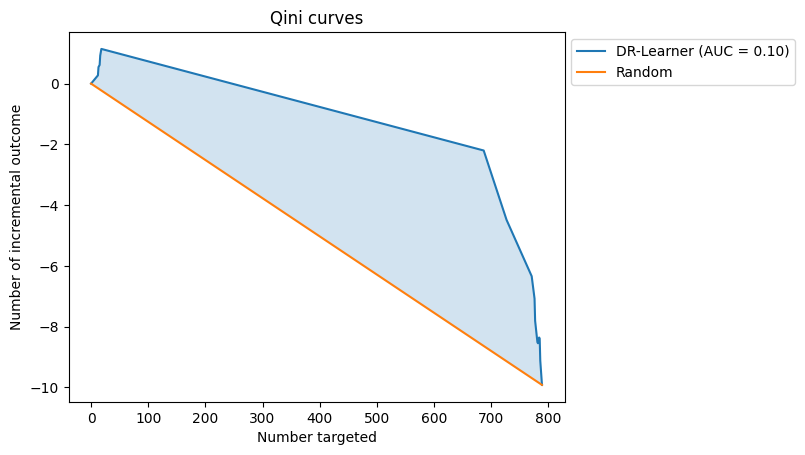

In [44]:
# DR-Learner with Logistic Regression for regression and propensity

# grid_search_propensity = GridSearchCV(propensity_model, propensity_param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
# grid_search_propensity.fit(X_train[selected_features], t_train)
# best_propensity_model = grid_search_propensity.best_estimator_

# calibrated_propensity_model = CalibratedClassifierCV(best_propensity_model, method='isotonic', cv=5)
# calibrated_propensity_model.fit(X_train[selected_features], t_train)


dr_learner_lr_tuned = DRLearner(
    model_propensity=SVC(C=10.0, kernel='rbf',  probability=True, random_state=768), 
    model_regression=XGBClassifier(random_state=768, n_estimators=100, learning_rate=0.01, max_depth=5, gamma=0.1),
    model_final=XGBRegressor(random_state=768, n_estimators=30, learning_rate=0.01, max_depth=5, gamma=0.1),
    discrete_outcome=True, 
    cv=5,
    random_state=768
)

    # 'SVM': (SVC(probability=True, random_state=768), {
    #     'C': [0.1, 1.0, 10.0],
    #     'kernel': ['linear', 'rbf']
    
    # 'XGBoost': (XGBClassifier(random_state=768), {
    #     'n_estimators': [50, 100, 200],
    #     'learning_rate': [0.01, 0.1, 0.2],
    #     'max_depth': [3, 5, 7]

# selected_features = ['age', 'urea', 'weight', 'height', 'pf_ratio', 'po2', 'ph' , 'fio2', 'heart_rate' , 'driving_pressure', 'plateau_pressure', 'hco3', 'respiratory_rate']
# selected_features = ['age', 'weight', 'pf_ratio', 'po2' , 'fio2', 'driving_pressure', 'plateau_pressure', 'hco3', 'respiratory_rate']
selected_features = ['age', 'weight', 'pf_ratio', 'po2' , 'fio2', 'driving_pressure', 'plateau_pressure', 'urea', 'platelets']

print("DR-Learner Logistic Regression training")
dr_learner_lr_tuned.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)

cate_dr_learner_lr_tuned = dr_learner_lr_tuned.effect(X=X_test[selected_features]) 
# Create data_test DataFrame
data_test = pd.DataFrame(X_test[selected_features], columns=ordered_columns)
data_test['outcome'] = y_test
data_test['treatment'] = t_test
data_test['CATE_DR'] = cate_dr_learner_lr_tuned


# print(data_test['CATE_DR'].head)

# Sort data by CATE estimates in descending order
data_test_sorted = data_test.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Visualize Qini Curve
fig, ax = plt.subplots(1, 1)
ax.set_title('Qini curves')

plot_qini_curve(
    data_test['outcome'], data_test['CATE_DR'], data_test['treatment'],
    perfect=False, name='DR-Learner', ax=ax
)

plt.show()

In [27]:
# Define parameter grids for grid search
param_grid_propensity = {
    'C': [0.1, 1.0, 10.0],
    'kernel': ['linear', 'rbf']
}

param_grid_regression = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'gamma': [0, 0.1, 0.2]
}

param_grid_final = {
    'n_estimators': [30, 50, 100],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'gamma': [0, 0.1, 0.2]
}

# Function to perform grid search and evaluate Qini AUC score
def grid_search_best_model(X_train, y_train, t_train, X_test, y_test, t_test, selected_features):
    best_score = -np.inf
    best_params = {}
    
    # Grid search for propensity model
    for params_p in [dict(zip(param_grid_propensity, v)) for v in itertools.product(*param_grid_propensity.values())]:
        propensity_model = SVC(probability=True, random_state=768, **params_p)
        
        # Calibrate the propensity model
        calibrated_propensity_model = CalibratedClassifierCV(propensity_model, method='isotonic', cv=5)
        calibrated_propensity_model.fit(X_train[selected_features], t_train)
        
        for params_r in [dict(zip(param_grid_regression, v)) for v in itertools.product(*param_grid_regression.values())]:
            regression_model = XGBClassifier(random_state=768, **params_r)
            
            for params_f in [dict(zip(param_grid_final, v)) for v in itertools.product(*param_grid_final.values())]:
                final_model = XGBRegressor(random_state=768, **params_f)
                
                dr_learner = DRLearner(
                    model_propensity=calibrated_propensity_model,
                    model_regression=regression_model,
                    model_final=final_model,
                    discrete_outcome=True
                )

                dr_learner.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)
                cate_test = dr_learner.effect(X=X_test[selected_features])
                
                data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
                data_test['outcome'] = y_test
                data_test['treatment'] = t_test
                data_test['CATE_DR'] = cate_test
                
                qini_auc = qini_auc_score(data_test['outcome'], data_test['CATE_DR'], data_test['treatment'])
                
                if qini_auc > best_score:
                    best_score = qini_auc
                    best_params = {
                        'propensity_model': params_p,
                        'regression_model': params_r,
                        'final_model': params_f
                    }
    
    return best_score, best_params

# Perform grid search and get the best parameters
best_score, best_params = grid_search_best_model(X_train, y_train, t_train, X_test, y_test, t_test, selected_features)

# Print the best parameters and the corresponding Qini AUC score
print(f"Best Qini AUC Score: {best_score}")
print(f"Best Parameters: {best_params}")

KeyboardInterrupt: 

Current parameters:
Propensity model: {'C': 12.0, 'kernel': 'rbf'}
Regression model: {'n_estimators': 30, 'learning_rate': 0.01, 'max_depth': 3}
Final model: {'n_estimators': 30, 'learning_rate': 0.1, 'max_depth': 3}
Current Qini AUC Score: 0.03747606293765273

Current parameters:
Propensity model: {'C': 12.0, 'kernel': 'rbf'}
Regression model: {'n_estimators': 30, 'learning_rate': 0.01, 'max_depth': 3}
Final model: {'n_estimators': 30, 'learning_rate': 0.1, 'max_depth': 5}
Current Qini AUC Score: 0.010979824208077504

Current parameters:
Propensity model: {'C': 12.0, 'kernel': 'rbf'}
Regression model: {'n_estimators': 30, 'learning_rate': 0.01, 'max_depth': 3}
Final model: {'n_estimators': 30, 'learning_rate': 0.2, 'max_depth': 3}
Current Qini AUC Score: 0.05550618126912517

Current parameters:
Propensity model: {'C': 12.0, 'kernel': 'rbf'}
Regression model: {'n_estimators': 30, 'learning_rate': 0.01, 'max_depth': 3}
Final model: {'n_estimators': 30, 'learning_rate': 0.2, 'max_depth':

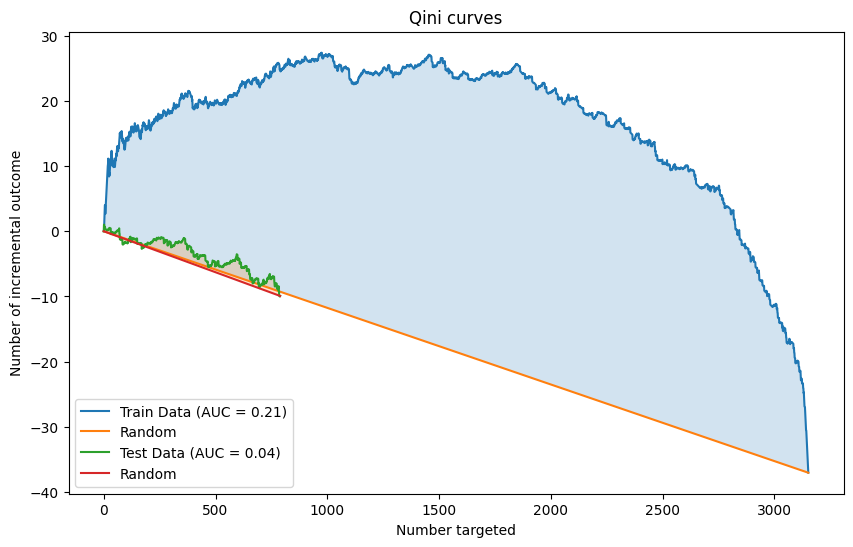

Train Data Qini AUC: 0.21122578292797567
Test Data Qini AUC: 0.03639607394017145


In [31]:
# Define parameter grids for grid search
param_grid_propensity = {
    'C': [12.0],
    'kernel': ['rbf']
}

param_grid_regression = {
    'n_estimators': [30, 100],
    'learning_rate': [0.01, 0.2],
    'max_depth': [3, 5, 7]
}

param_grid_final = {
    'n_estimators': [30, 100],
    'learning_rate': [0.1, 0.2],
    'max_depth': [3, 5]
}

# Function to perform grid search and evaluate Qini AUC score
def grid_search_best_model(X_train, y_train, t_train, X_test, y_test, t_test, selected_features):
    best_score = -np.inf
    best_params = {}
    
    for params_p in [dict(zip(param_grid_propensity, v)) for v in itertools.product(*param_grid_propensity.values())]:
        propensity_model = SVC(probability=True, random_state=768, **params_p)
        
        # Calibrate the propensity model
        calibrated_propensity_model = CalibratedClassifierCV(propensity_model, method='isotonic', cv=5)
        calibrated_propensity_model.fit(X_train[selected_features], t_train)
        
        for params_r in [dict(zip(param_grid_regression, v)) for v in itertools.product(*param_grid_regression.values())]:
            regression_model = XGBClassifier(random_state=768, **params_r)
            
            for params_f in [dict(zip(param_grid_final, v)) for v in itertools.product(*param_grid_final.values())]:
                final_model = XGBRegressor(random_state=768, **params_f)
                
                dr_learner = DRLearner(
                    model_propensity=calibrated_propensity_model,
                    model_regression=regression_model,
                    model_final=final_model,
                    discrete_outcome=True
                )

                dr_learner.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)
                cate_test = dr_learner.effect(X=X_test[selected_features])
                
                data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
                data_test['outcome'] = y_test
                data_test['treatment'] = t_test
                data_test['CATE_DR'] = cate_test
                
                qini_auc = qini_auc_score(data_test['outcome'], data_test['CATE_DR'], data_test['treatment'])
                
                print(f"Current parameters:")
                print(f"Propensity model: {params_p}")
                print(f"Regression model: {params_r}")
                print(f"Final model: {params_f}")
                print(f"Current Qini AUC Score: {qini_auc}\n")
                
                if qini_auc > best_score:
                    best_score = qini_auc
                    best_params = {
                        'propensity_model': params_p,
                        'regression_model': params_r,
                        'final_model': params_f
                    }
    
    return best_score, best_params

# Perform grid search and get the best parameters
best_score, best_params = grid_search_best_model(X_train, y_train, t_train, X_test, y_test, t_test, selected_features)

# Print the best parameters and the corresponding Qini AUC score
print(f"Best Qini AUC Score: {best_score}")
print(f"Best Parameters: {best_params}")

# Fit the DR-Learner with the best parameters
propensity_model = SVC(probability=True, random_state=768, **best_params['propensity_model'])
calibrated_propensity_model = CalibratedClassifierCV(propensity_model, method='isotonic', cv=5)
calibrated_propensity_model.fit(X_train[selected_features], t_train)

regression_model = XGBClassifier(random_state=768, **best_params['regression_model'])
final_model = XGBRegressor(random_state=768, **best_params['final_model'])

dr_learner_best = DRLearner(
    model_propensity=calibrated_propensity_model,
    model_regression=regression_model,
    model_final=final_model,
    discrete_outcome=True
)

dr_learner_best.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)

# Estimate CATE on training data
cate_train = dr_learner_best.effect(X=X_train[selected_features])

# Create data_train DataFrame
data_train = pd.DataFrame(X_train[selected_features], columns=selected_features)
data_train['outcome'] = y_train
data_train['treatment'] = t_train
data_train['CATE_DR'] = cate_train

# Sort data by CATE estimates in descending order for training data
data_train_sorted = data_train.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Estimate CATE on test data
cate_test = dr_learner_best.effect(X=X_test[selected_features])

# Create data_test DataFrame
data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
data_test['outcome'] = y_test
data_test['treatment'] = t_test
data_test['CATE_DR'] = cate_test

# Sort data by CATE estimates in descending order for test data
data_test_sorted = data_test.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Visualize Qini Curves
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.set_title('Qini curves')

plot_qini_curve(
    data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'],
    perfect=False, name='Train Data', ax=ax
)

plot_qini_curve(
    data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'],
    perfect=False, name='Test Data', ax=ax
)

plt.legend()
plt.show()

# Calculate Qini AUC for train and test data
qini_auc_train = qini_auc_score(data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'])
qini_auc_test = qini_auc_score(data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'])

print(f'Train Data Qini AUC: {qini_auc_train}')
print(f'Test Data Qini AUC: {qini_auc_test}')

Best Qini AUC Score: 0.1364037801035544
Best Parameters: {'propensity_model': {'C': 12.0, 'kernel': 'rbf'}, 'regression_model': {'n_estimators': 30, 'learning_rate': 0.2, 'max_depth': 7}, 'final_model': {'n_estimators': 100, 'learning_rate': 0.2, 'max_depth': 3}}

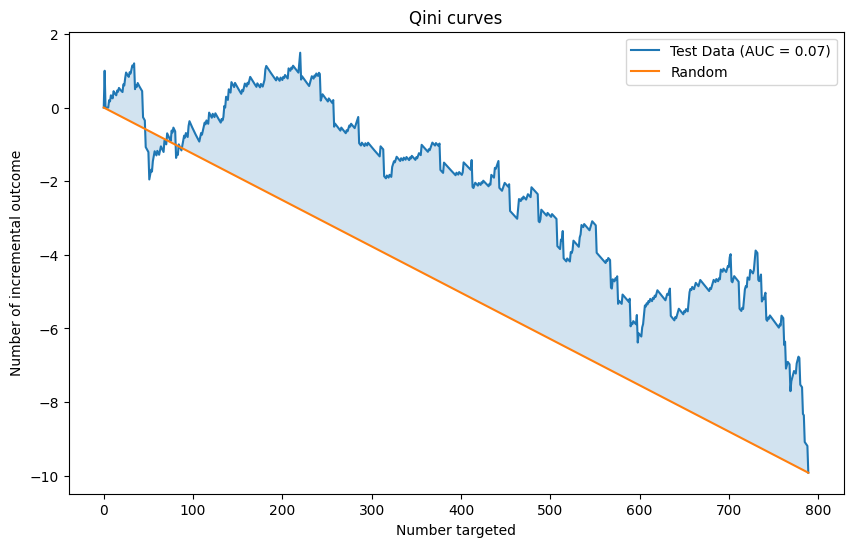

Train Data Qini AUC: 0.29196593909792623
Test Data Qini AUC: 0.06952425356197532


In [40]:
# Fit the DR-Learner with the best parameters
propensity_model = SVC(probability=True, random_state=768, C=12.0, kernel='rbf')
calibrated_propensity_model = CalibratedClassifierCV(propensity_model, method='isotonic', cv=5)
calibrated_propensity_model.fit(X_train[selected_features], t_train)

regression_model = XGBClassifier(random_state=768, n_estimators=30, learning_rate=0.2, max_depth=7,)
final_model = XGBRegressor(random_state=768, n_estimators=100, learning_rate=0.2, max_depth=3)

dr_learner_best = DRLearner(
    model_propensity=calibrated_propensity_model,
    model_regression=regression_model,
    model_final=final_model,
    discrete_outcome=True
)

dr_learner_best.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)

# Estimate CATE on training data
cate_train = dr_learner_best.effect(X=X_train[selected_features])

# Create data_train DataFrame
data_train = pd.DataFrame(X_train[selected_features], columns=selected_features)
data_train['outcome'] = y_train
data_train['treatment'] = t_train
data_train['CATE_DR'] = cate_train

# Sort data by CATE estimates in descending order for training data
data_train_sorted = data_train.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Estimate CATE on test data
cate_test = dr_learner_best.effect(X=X_test[selected_features])

# Create data_test DataFrame
data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
data_test['outcome'] = y_test
data_test['treatment'] = t_test
data_test['CATE_DR'] = cate_test

# Sort data by CATE estimates in descending order for test data
data_test_sorted = data_test.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Visualize Qini Curves
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.set_title('Qini curves')

plot_qini_curve(
    data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'],
    perfect=False, name='Train Data', ax=ax
)

plot_qini_curve(
    data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'],
    perfect=False, name='Test Data', ax=ax
)

plt.legend()
plt.show()

# Calculate Qini AUC for train and test data
qini_auc_train = qini_auc_score(data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'])
qini_auc_test = qini_auc_score(data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'])

print(f'Train Data Qini AUC: {qini_auc_train}')
print(f'Test Data Qini AUC: {qini_auc_test}')

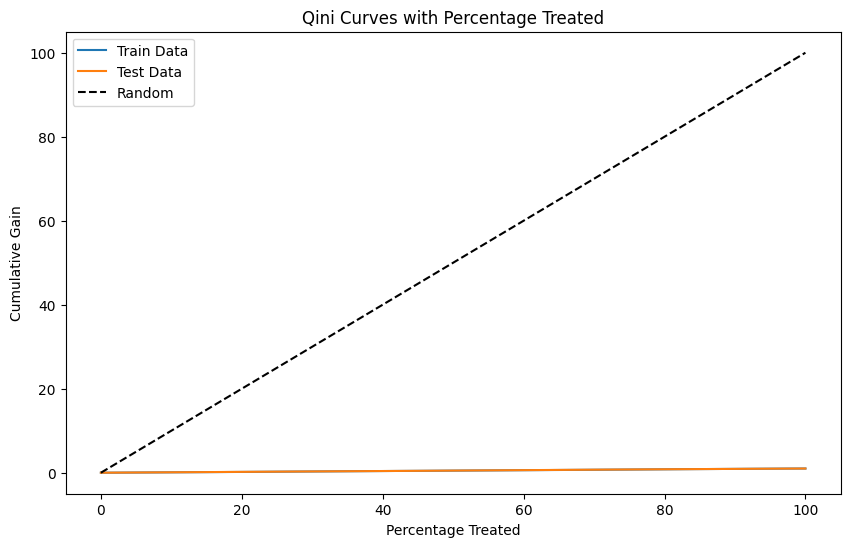

Train Data Qini AUC: 0.29196593909792623
Test Data Qini AUC: 0.06952425356197532


In [42]:
# Calculate cumulative gains for Qini curve plotting
def calculate_cumulative_gain(data_sorted):
    total_positives = data_sorted['outcome'].sum()
    gain = data_sorted['outcome'].cumsum() / total_positives
    return gain

# Calculate cumulative gains
gain_train = calculate_cumulative_gain(data_train_sorted)
gain_test = calculate_cumulative_gain(data_test_sorted)

# Create percentage treated arrays
x_values_train = np.linspace(0, 100, len(gain_train))
x_values_test = np.linspace(0, 100, len(gain_test))

# Plot Qini curves with percentage treated on x-axis
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.set_title('Qini Curves with Percentage Treated')

ax.plot(x_values_train, gain_train, label='Train Data')
ax.plot(x_values_test, gain_test, label='Test Data')
ax.plot([0, 100], [0, 100], 'k--', label='Random')
ax.set_xlabel('Percentage Treated')
ax.set_ylabel('Cumulative Gain')
ax.legend()
plt.show()

# Calculate Qini AUC for train and test data
qini_auc_train = qini_auc_score(data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'])
qini_auc_test = qini_auc_score(data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'])

print(f'Train Data Qini AUC: {qini_auc_train}')
print(f'Test Data Qini AUC: {qini_auc_test}')

# Hyper parameter experiment DR-learner

Evaluating Logistic Regression for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


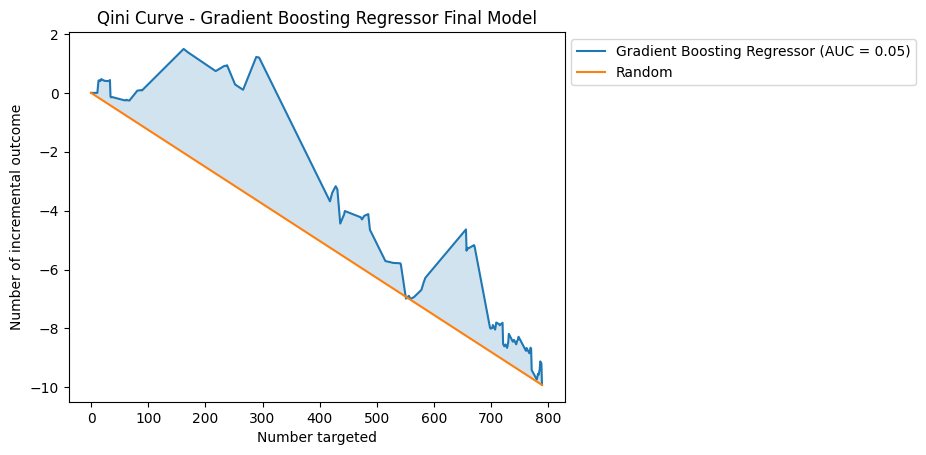

Gradient Boosting Regressor Final Model AUQC: 0.054195347770952224

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


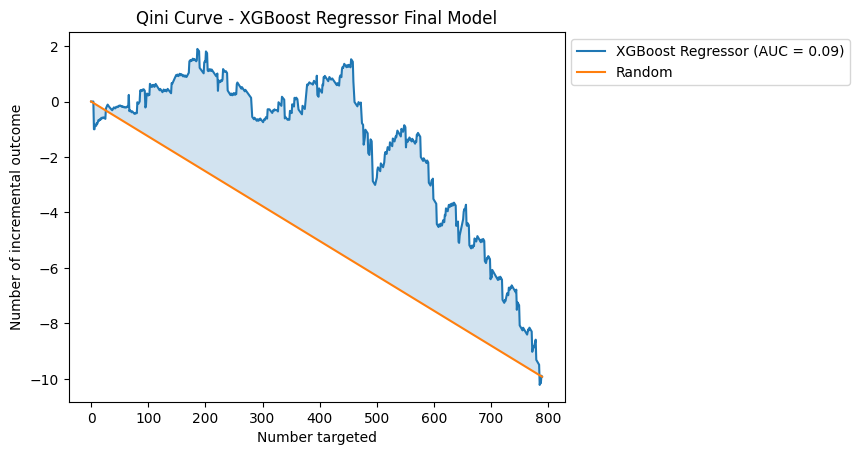

XGBoost Regressor Final Model AUQC: 0.08933677135957661

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


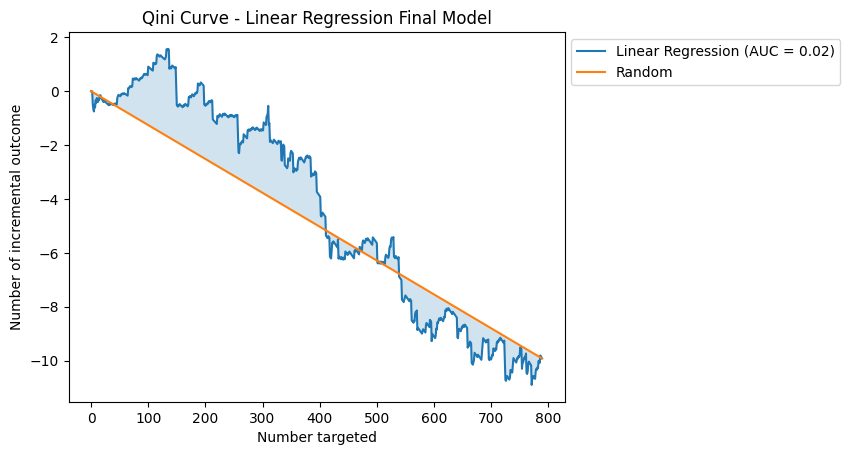

Linear Regression Final Model AUQC: 0.01634101901665613

Evaluating Logistic Regression for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


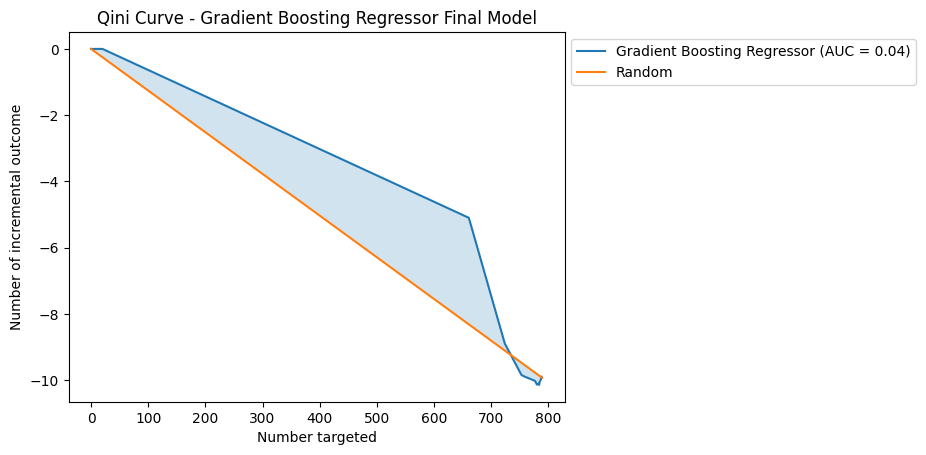

Gradient Boosting Regressor Final Model AUQC: 0.03991303095871167

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


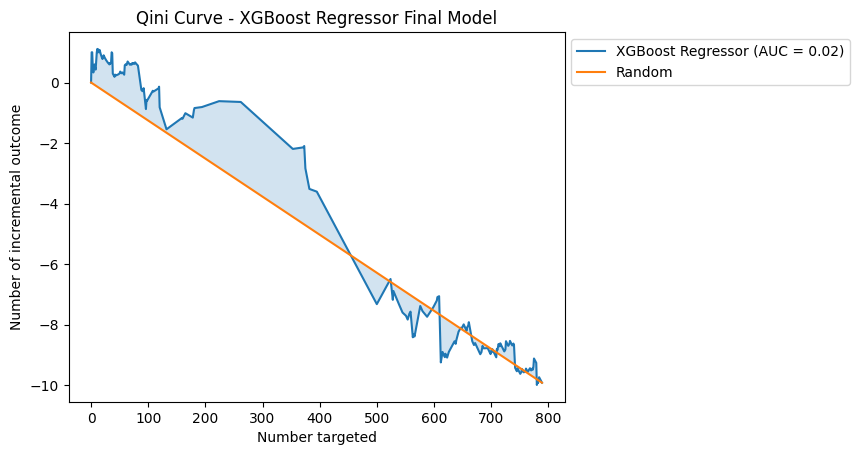

XGBoost Regressor Final Model AUQC: 0.019661750507832244

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


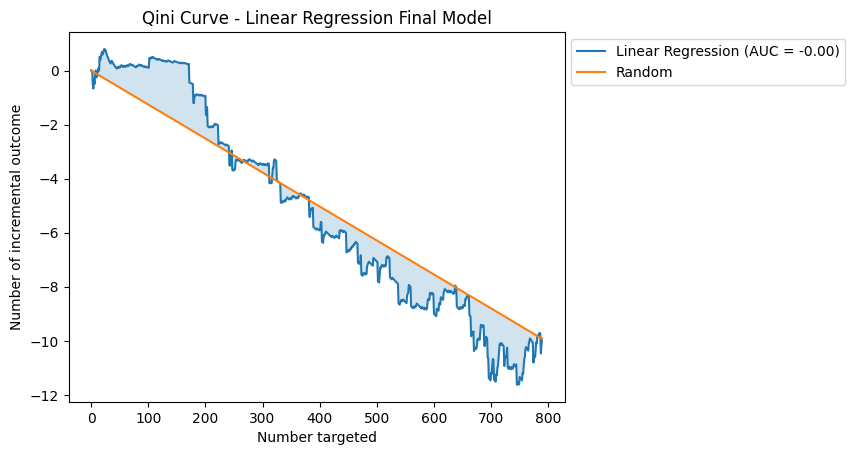

Linear Regression Final Model AUQC: -0.004671283204918107

Evaluating Logistic Regression for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


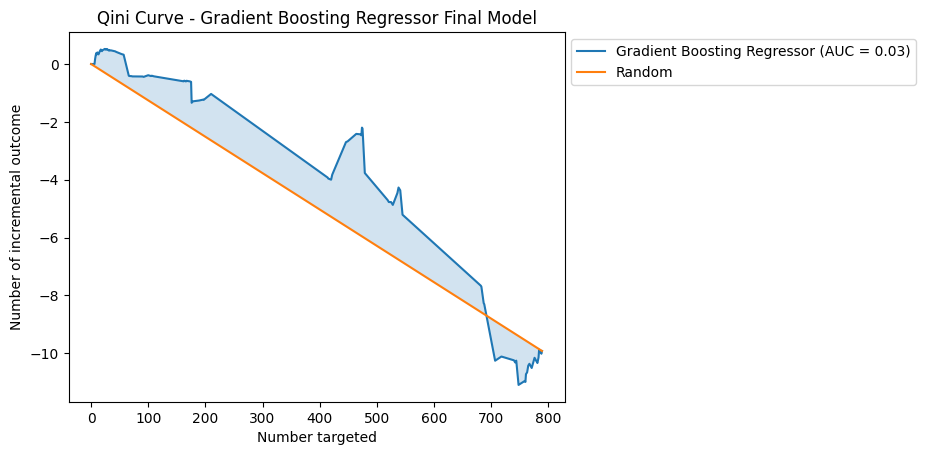

Gradient Boosting Regressor Final Model AUQC: 0.029399580283284314

Evaluating DR-Learner with XGBoost Regressor as the final model...


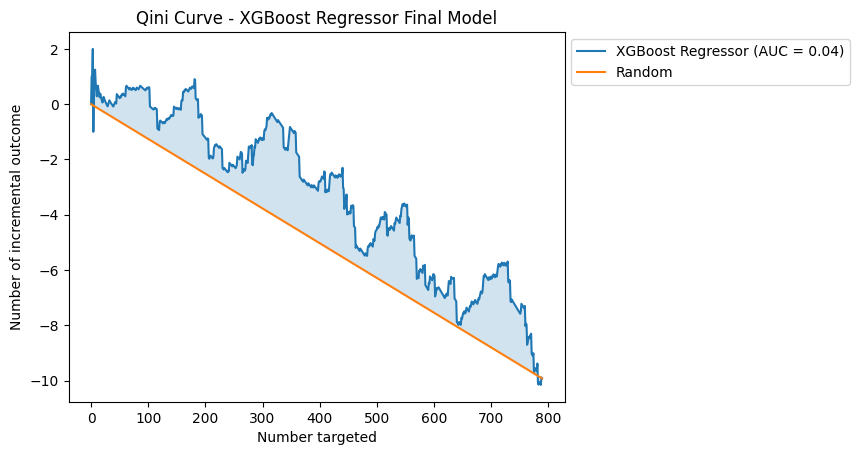

XGBoost Regressor Final Model AUQC: 0.0446612675954107

Evaluating DR-Learner with Linear Regression as the final model...


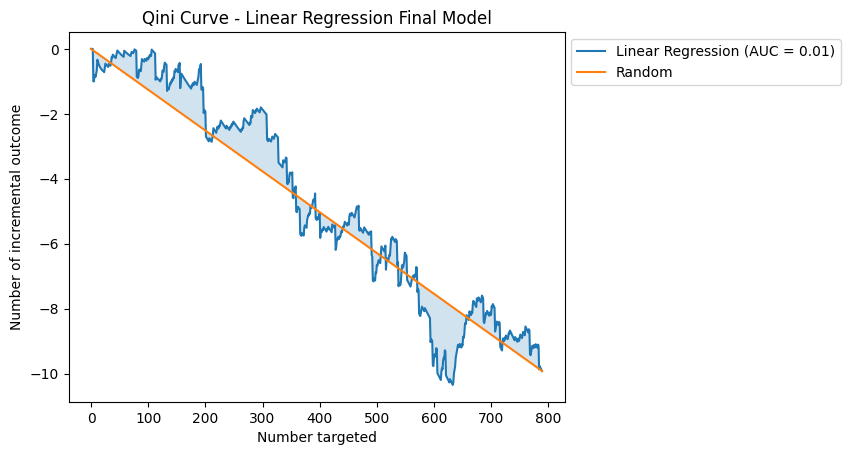

Linear Regression Final Model AUQC: 0.0067095566938966565

Evaluating Logistic Regression for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


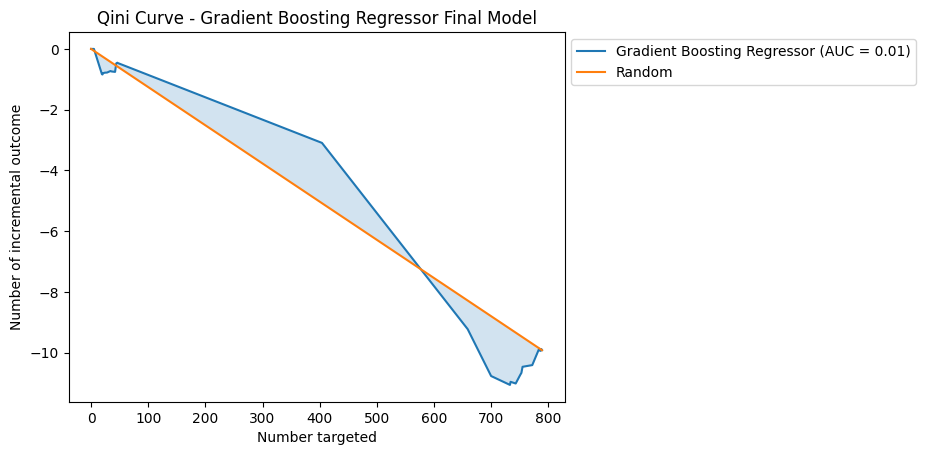

Gradient Boosting Regressor Final Model AUQC: 0.0106369911363945

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


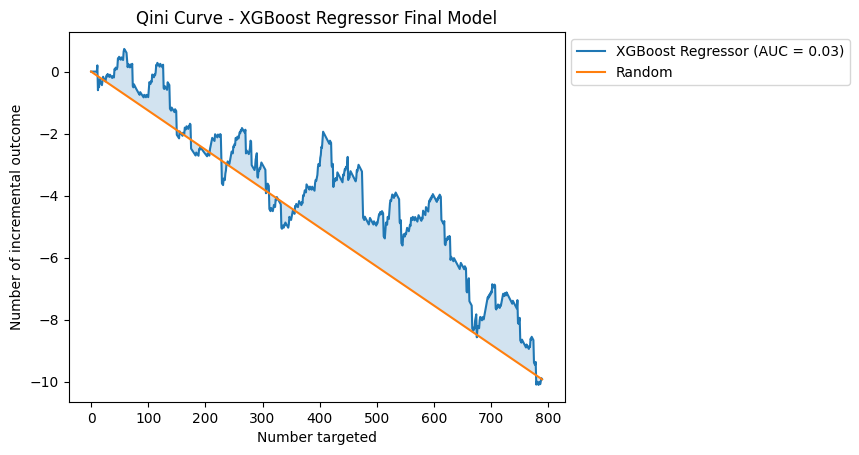

XGBoost Regressor Final Model AUQC: 0.03016203920326815

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


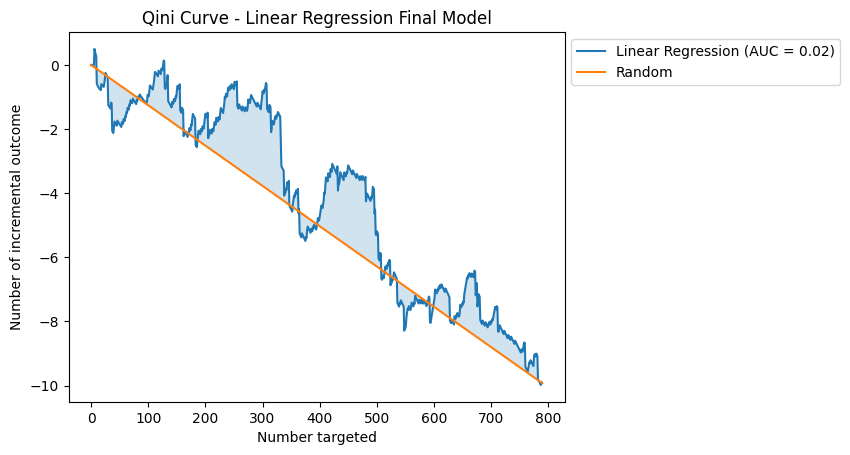

Linear Regression Final Model AUQC: 0.019924901021874865

Evaluating Logistic Regression for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


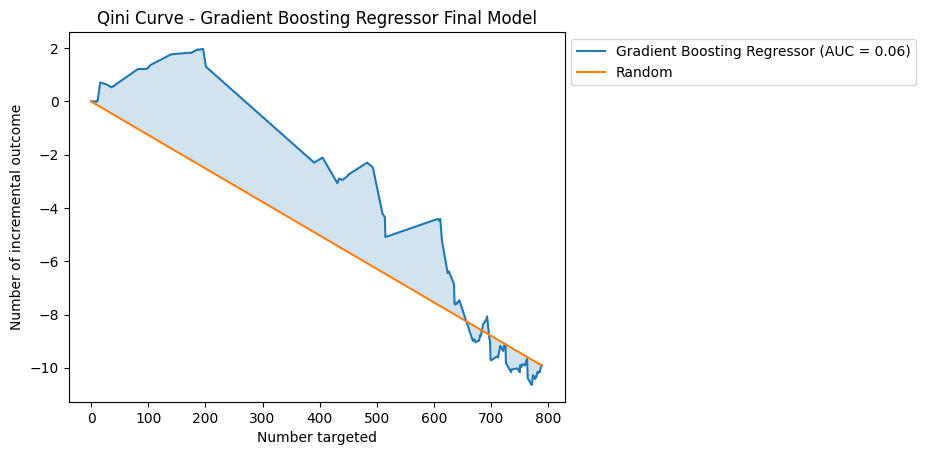

Gradient Boosting Regressor Final Model AUQC: 0.05617620807157921

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


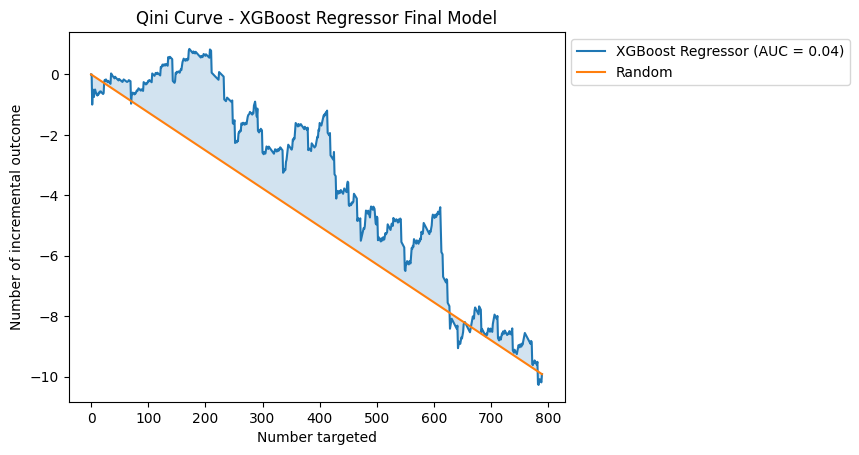

XGBoost Regressor Final Model AUQC: 0.03712293372765811

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


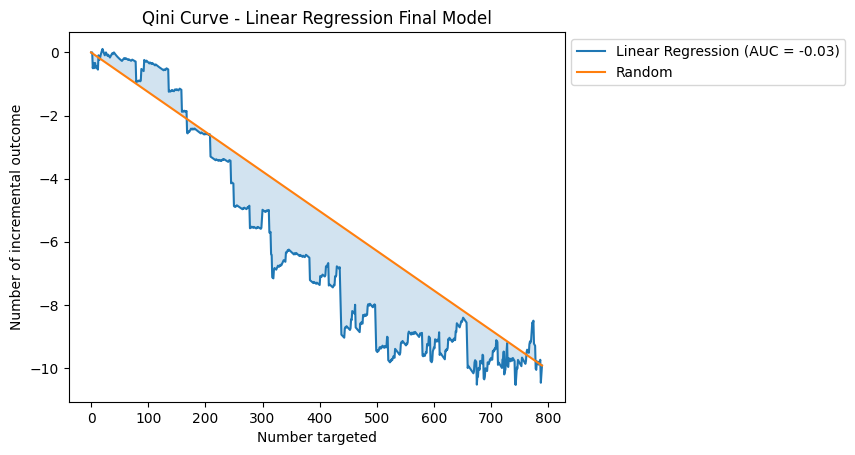

Linear Regression Final Model AUQC: -0.028463014406823136

Evaluating Gradient Boosting for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


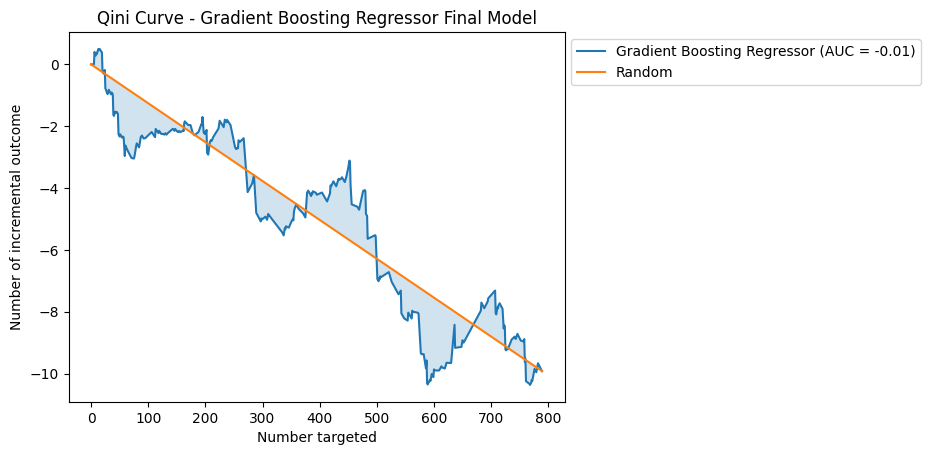

Gradient Boosting Regressor Final Model AUQC: -0.0052981789001828134

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


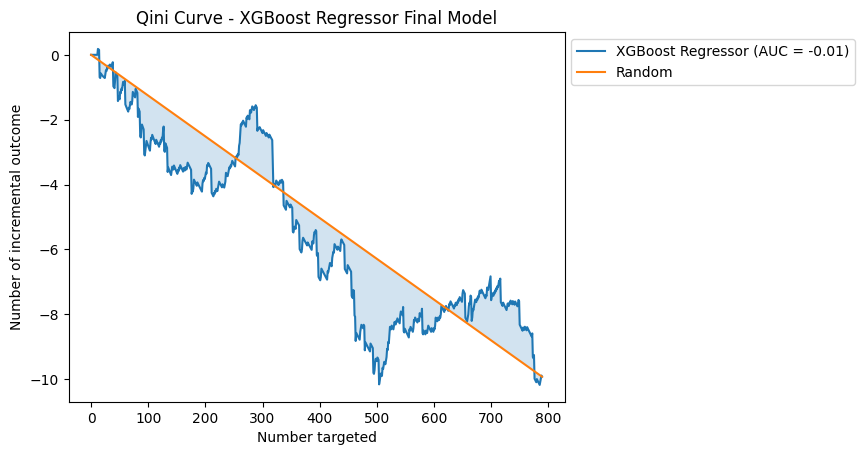

XGBoost Regressor Final Model AUQC: -0.013080582365586284

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


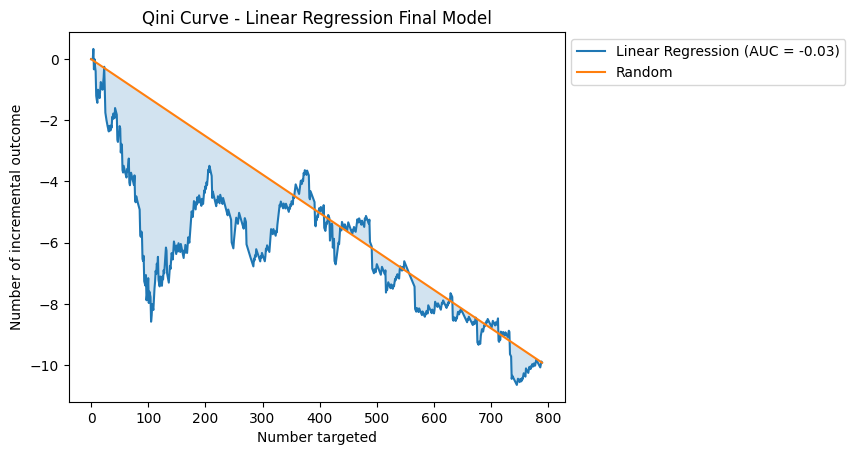

Linear Regression Final Model AUQC: -0.034730432911989316

Evaluating Gradient Boosting for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


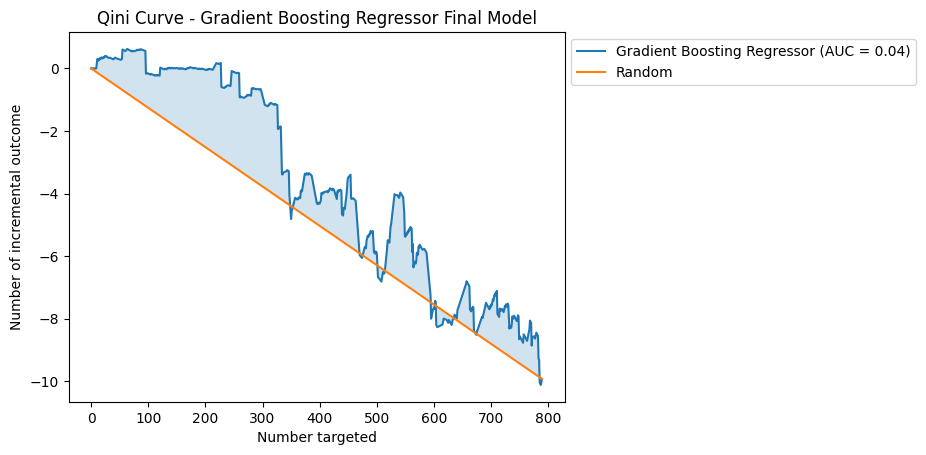

Gradient Boosting Regressor Final Model AUQC: 0.03545378660263821

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


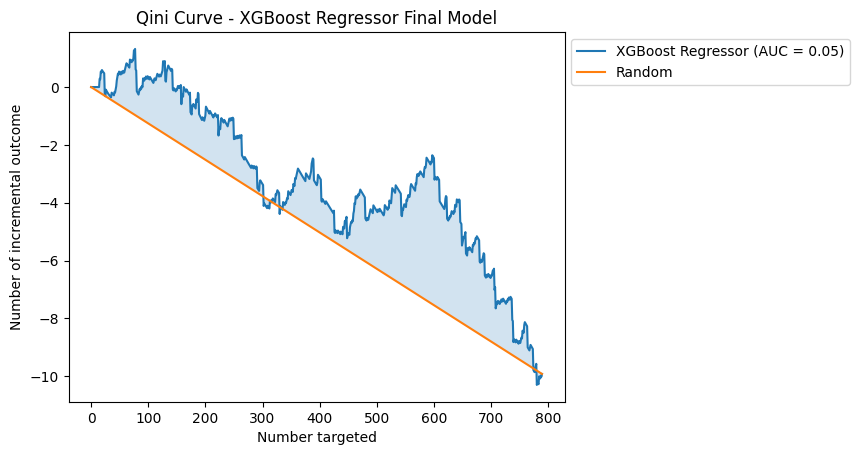

XGBoost Regressor Final Model AUQC: 0.04557929266131744

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


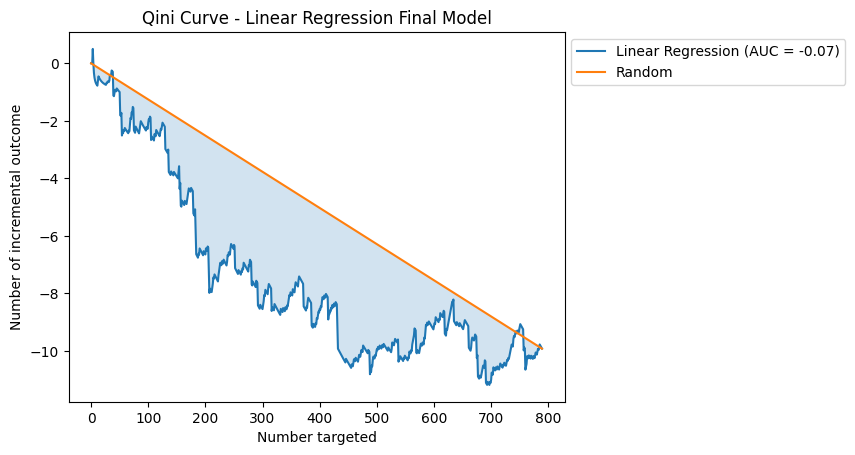

Linear Regression Final Model AUQC: -0.0654201073096906

Evaluating Gradient Boosting for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


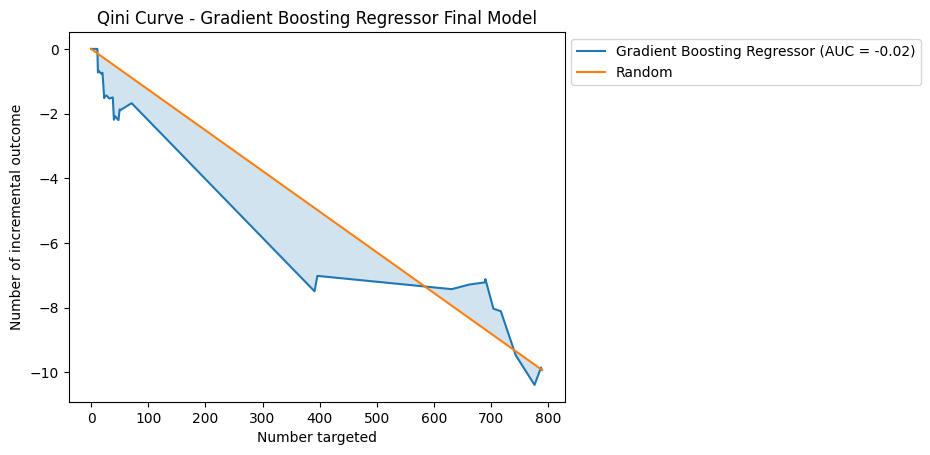

Gradient Boosting Regressor Final Model AUQC: -0.023426624751157758

Evaluating DR-Learner with XGBoost Regressor as the final model...


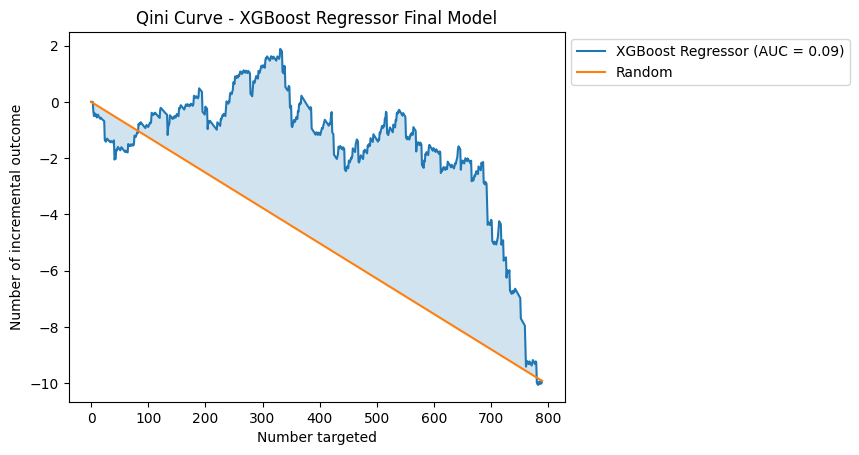

XGBoost Regressor Final Model AUQC: 0.0885431001861384

Evaluating DR-Learner with Linear Regression as the final model...


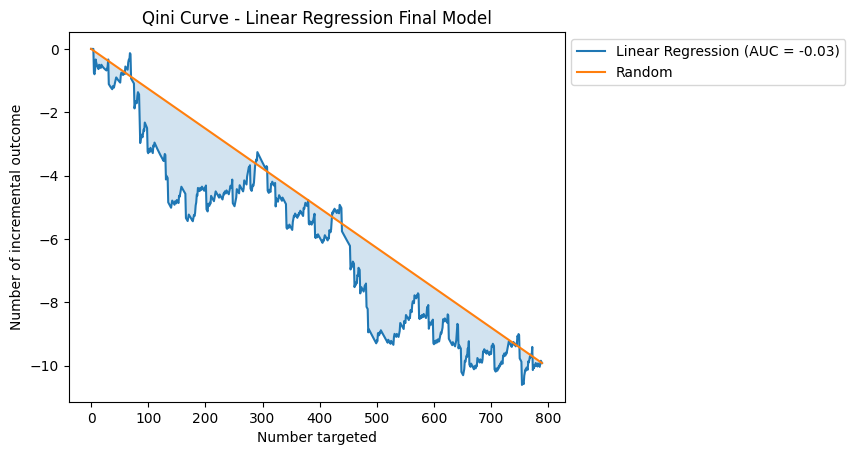

Linear Regression Final Model AUQC: -0.030459132687143148

Evaluating Gradient Boosting for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


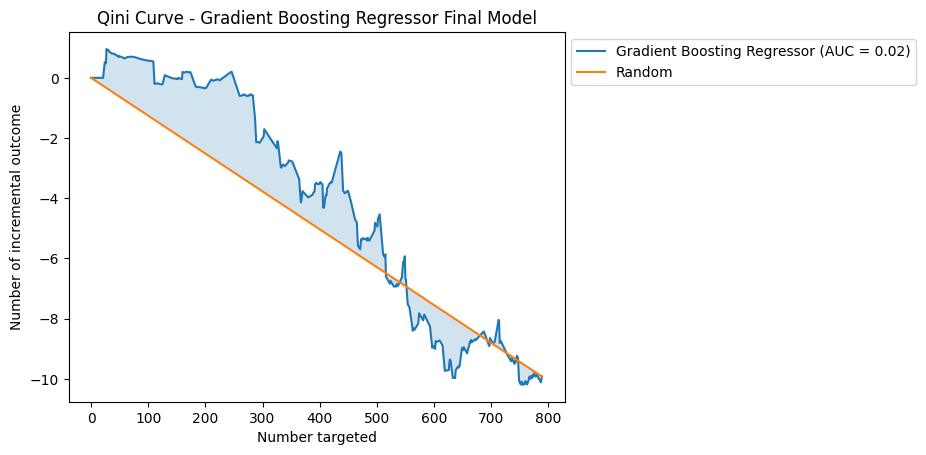

Gradient Boosting Regressor Final Model AUQC: 0.02432391014898299

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


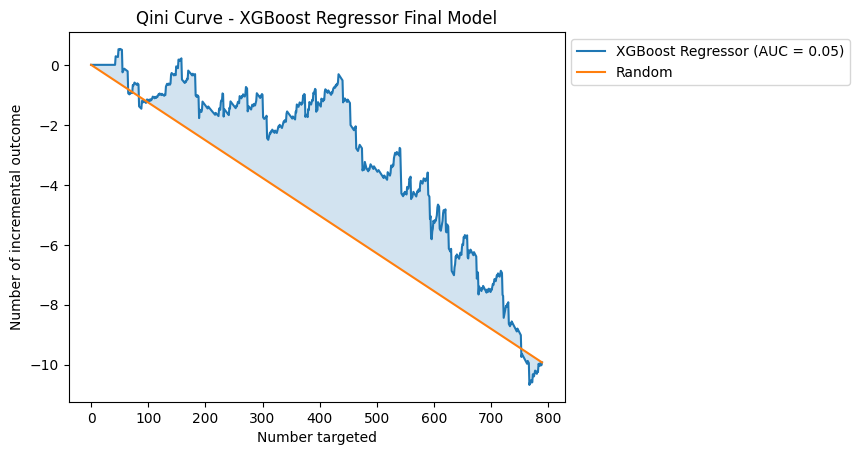

XGBoost Regressor Final Model AUQC: 0.04977689709348286

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


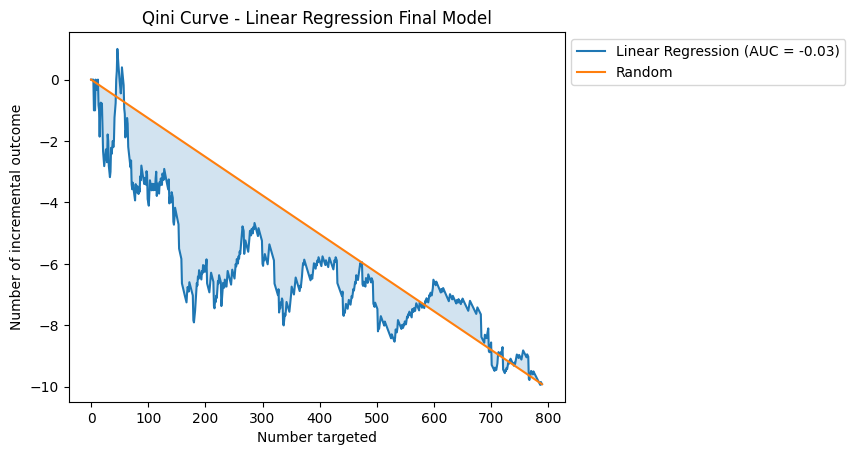

Linear Regression Final Model AUQC: -0.03380950873028691

Evaluating Gradient Boosting for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


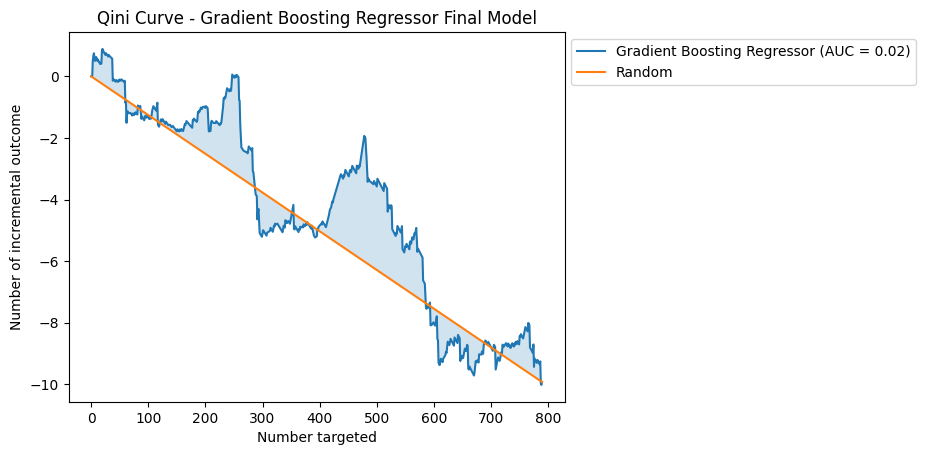

Gradient Boosting Regressor Final Model AUQC: 0.01690142559051776

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


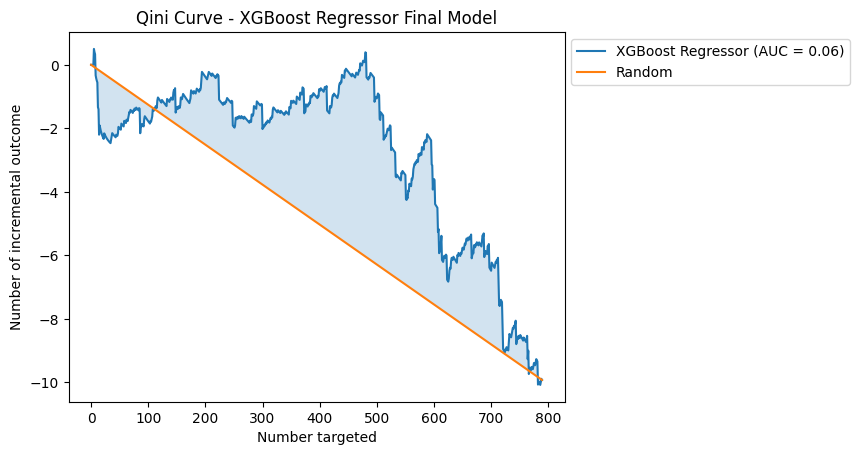

XGBoost Regressor Final Model AUQC: 0.05674646330097015

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


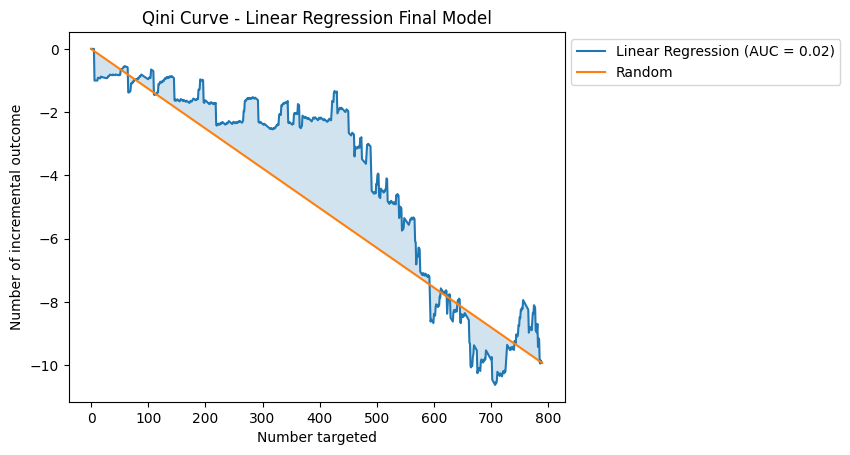

Linear Regression Final Model AUQC: 0.024188280024052412

Evaluating XGBoost for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


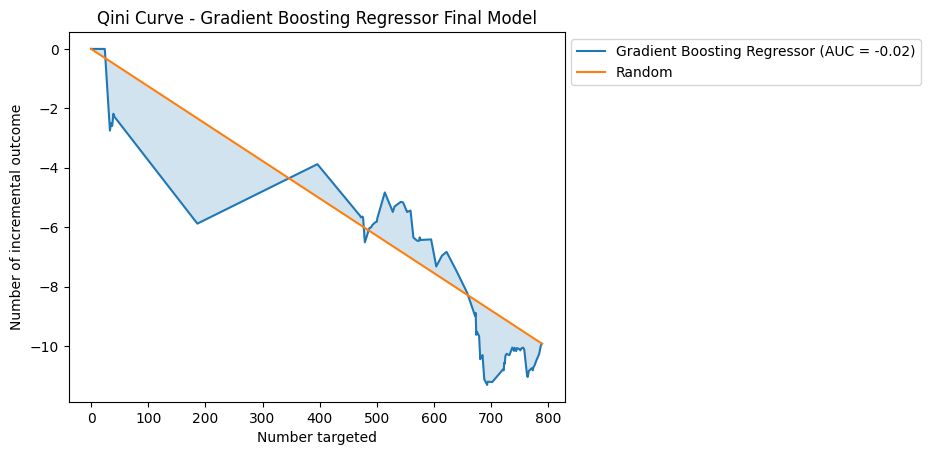

Gradient Boosting Regressor Final Model AUQC: -0.02024801926432497

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


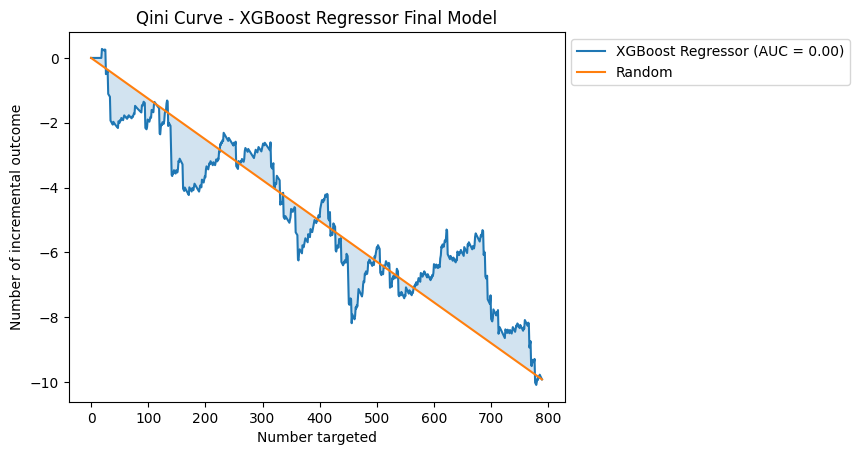

XGBoost Regressor Final Model AUQC: 0.002067010089353598

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


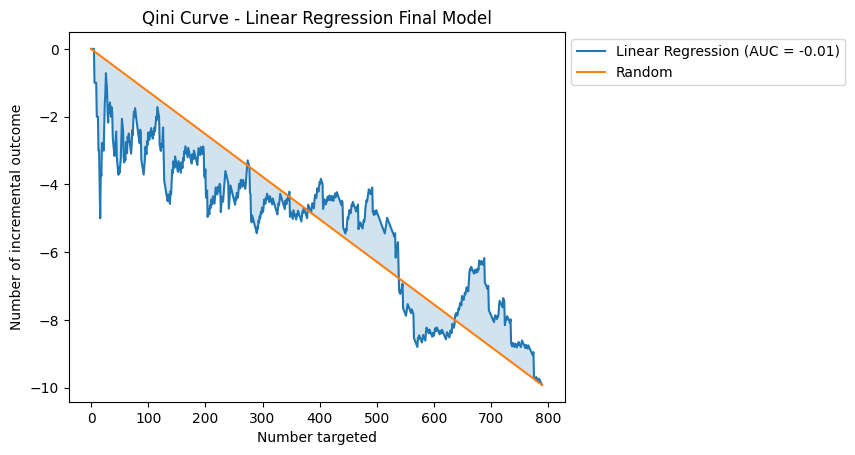

Linear Regression Final Model AUQC: -0.007601644636758336

Evaluating XGBoost for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


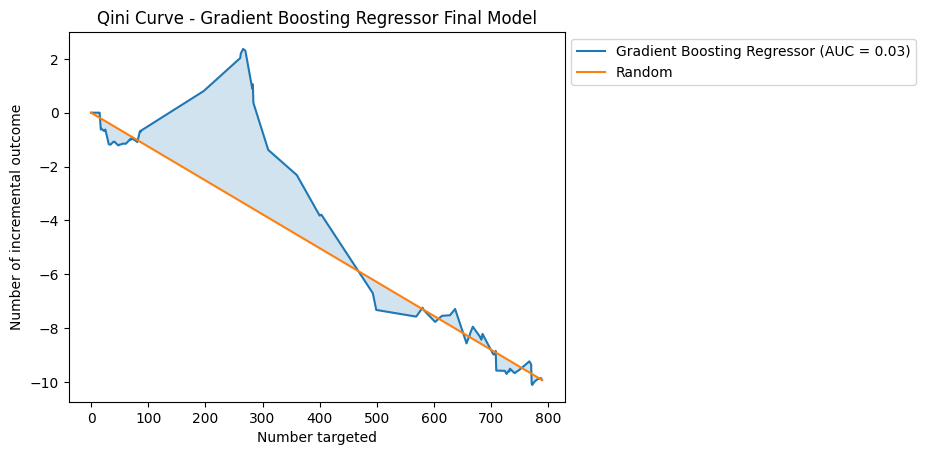

Gradient Boosting Regressor Final Model AUQC: 0.027382405896786144

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


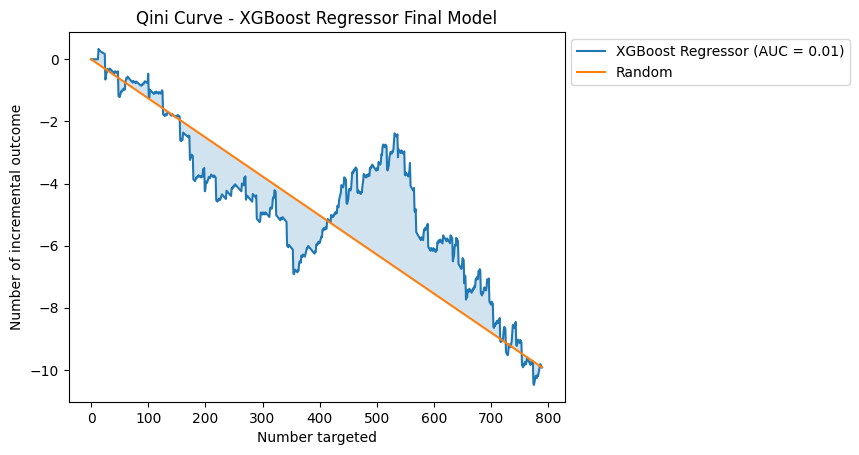

XGBoost Regressor Final Model AUQC: 0.01012056903837956

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


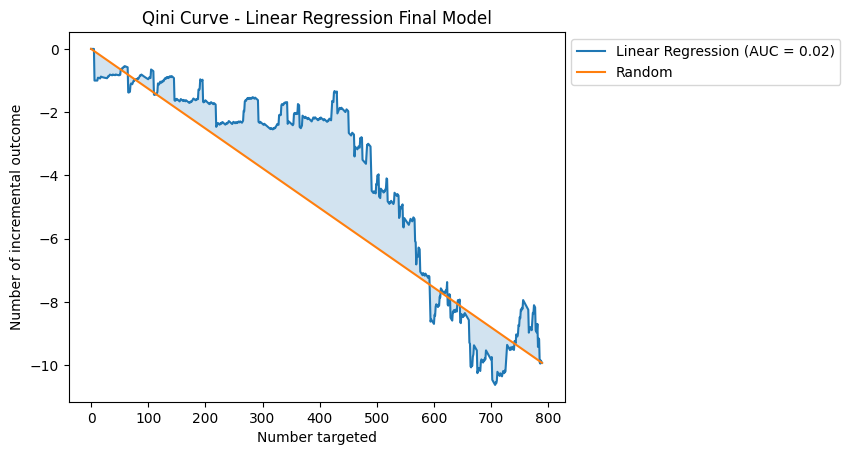

Linear Regression Final Model AUQC: 0.024271955591846122

Evaluating XGBoost for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


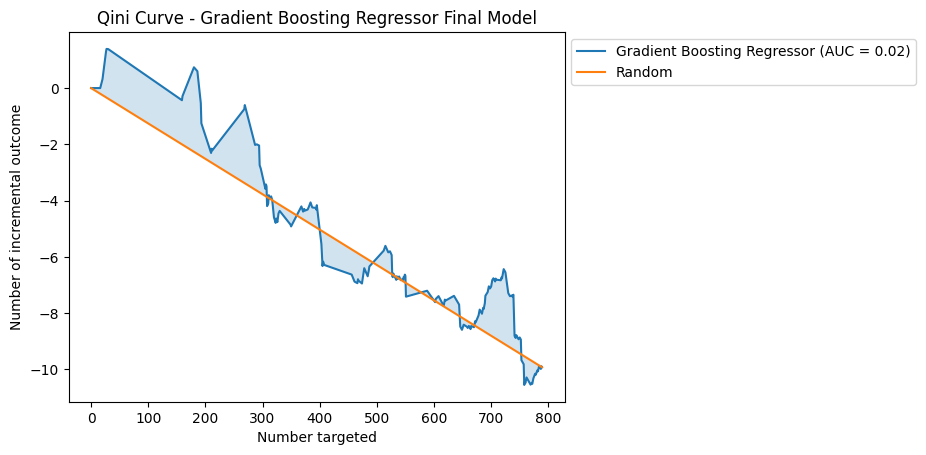

Gradient Boosting Regressor Final Model AUQC: 0.01710719244221922

Evaluating DR-Learner with XGBoost Regressor as the final model...


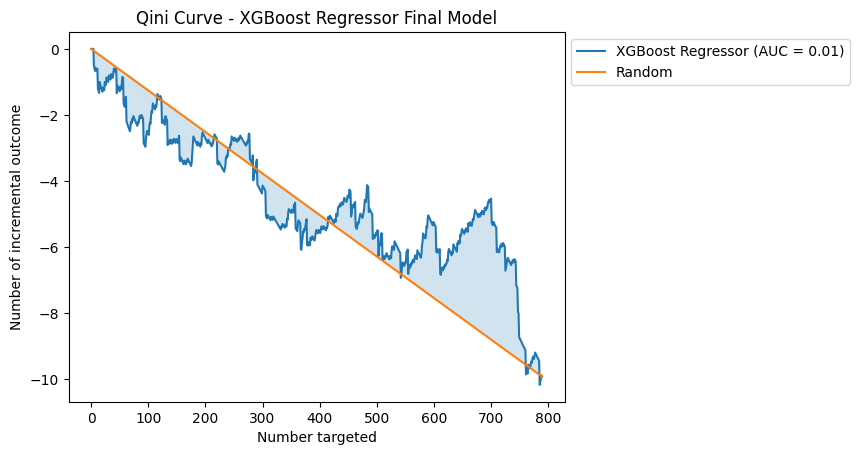

XGBoost Regressor Final Model AUQC: 0.01031568501605106

Evaluating DR-Learner with Linear Regression as the final model...


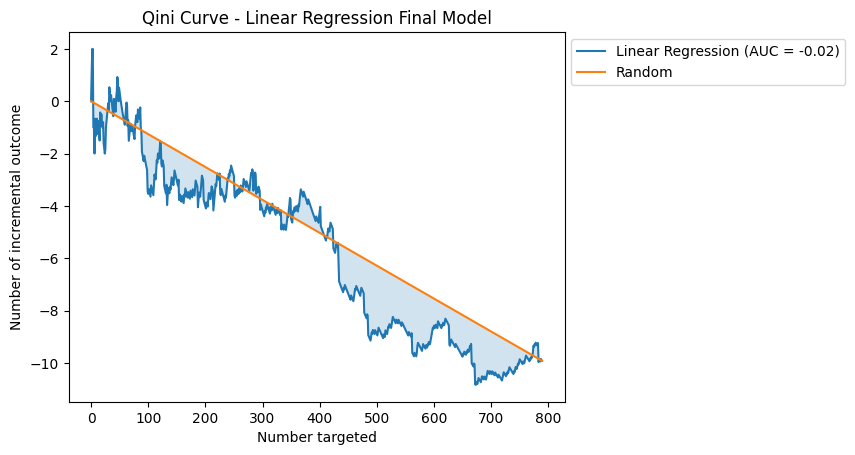

Linear Regression Final Model AUQC: -0.02213709262004772

Evaluating XGBoost for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


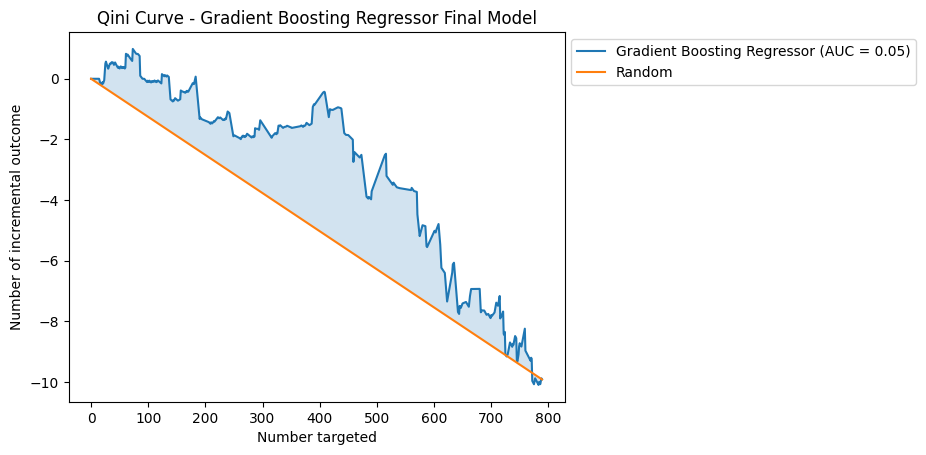

Gradient Boosting Regressor Final Model AUQC: 0.05063385925250771

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


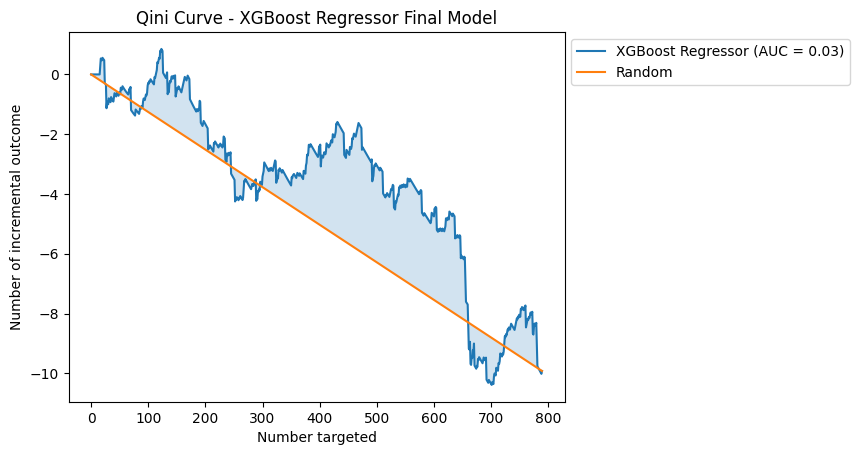

XGBoost Regressor Final Model AUQC: 0.03462979926384764

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


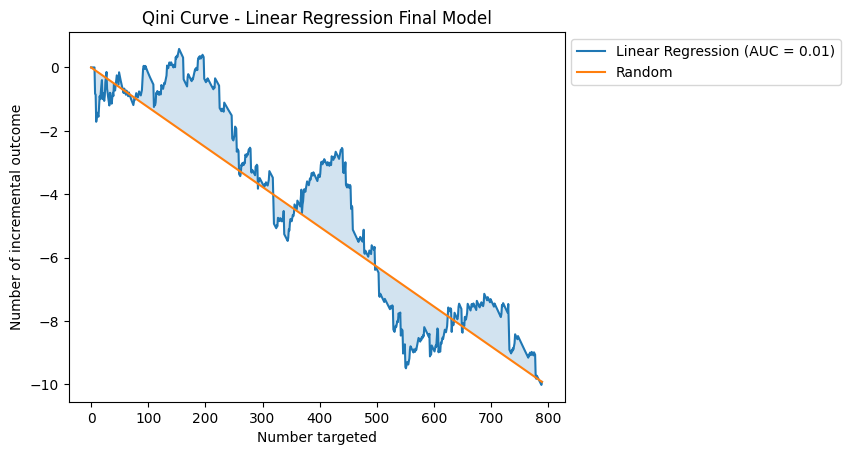

Linear Regression Final Model AUQC: 0.013692599379256123

Evaluating XGBoost for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


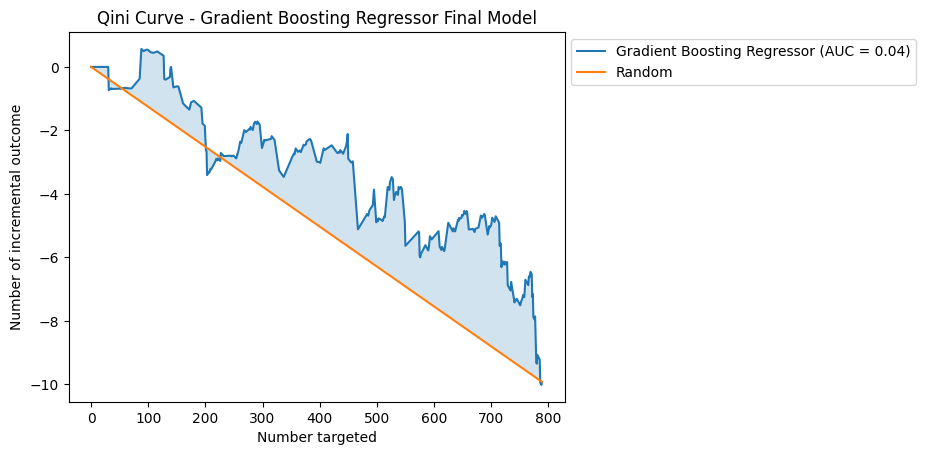

Gradient Boosting Regressor Final Model AUQC: 0.04470371479960066

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


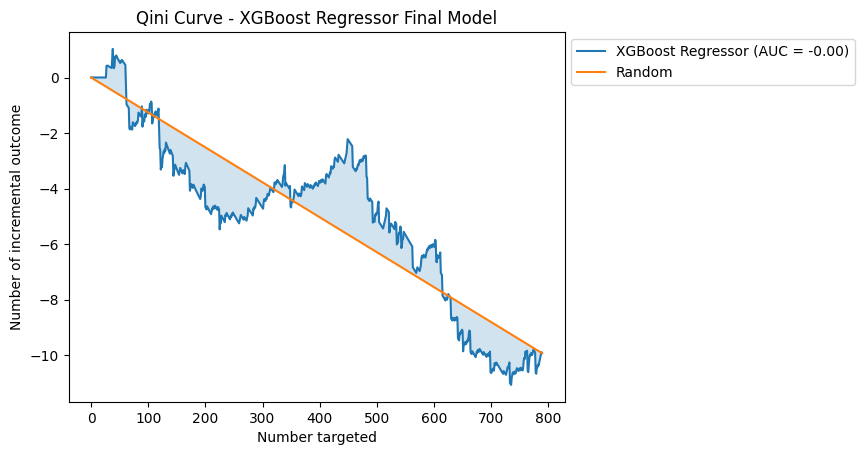

XGBoost Regressor Final Model AUQC: -0.0014280072095695577

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


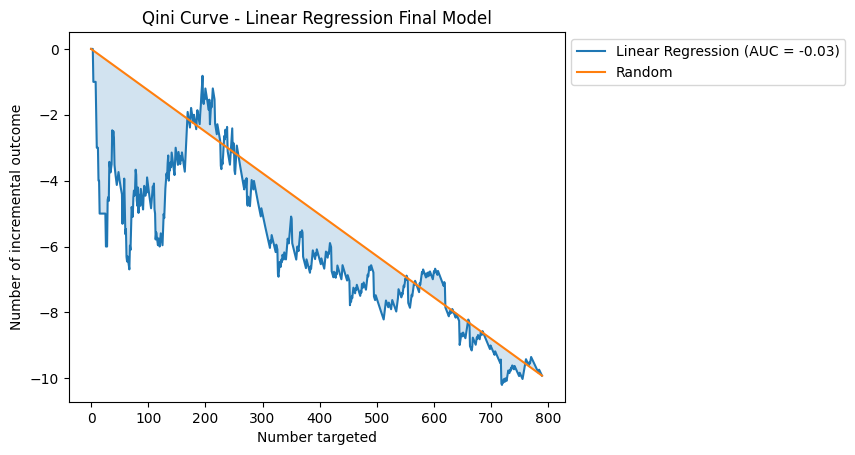

Linear Regression Final Model AUQC: -0.0297067576103849

Evaluating SVM for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


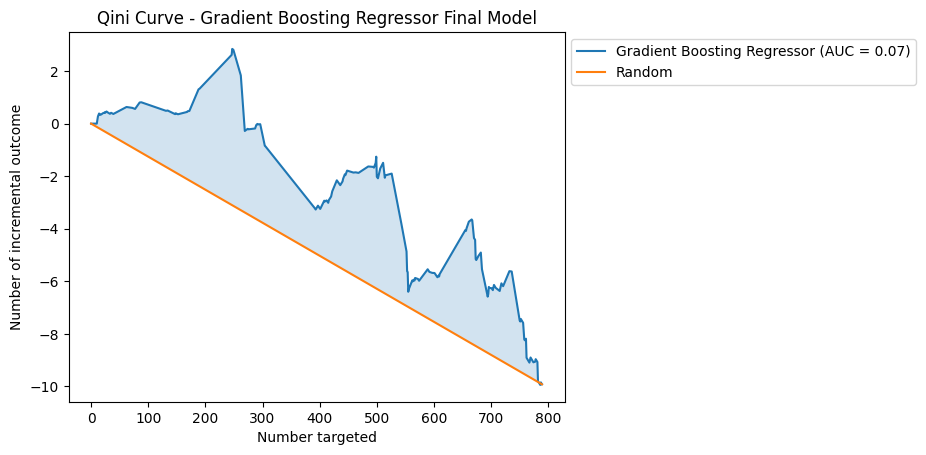

Gradient Boosting Regressor Final Model AUQC: 0.07165202418026832

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


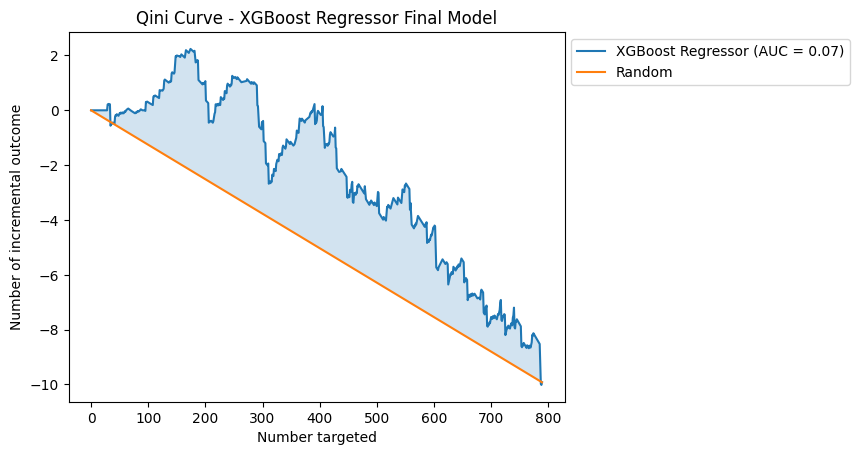

XGBoost Regressor Final Model AUQC: 0.06761934361776363

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


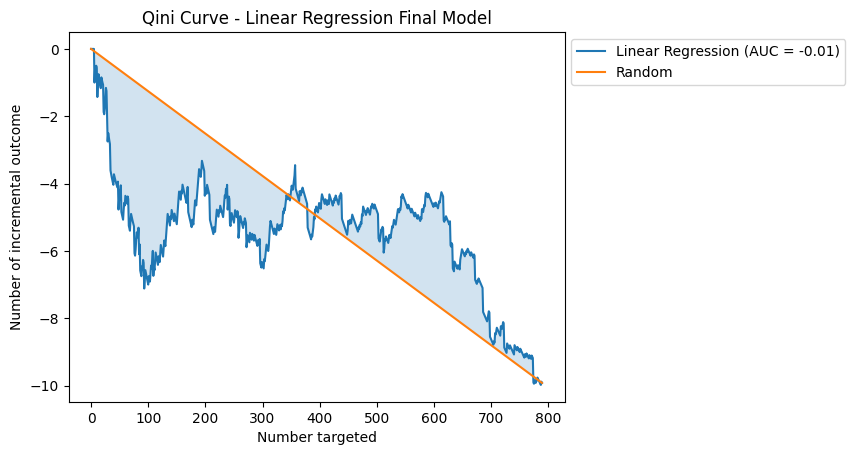

Linear Regression Final Model AUQC: -0.012569943705604072

Evaluating SVM for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


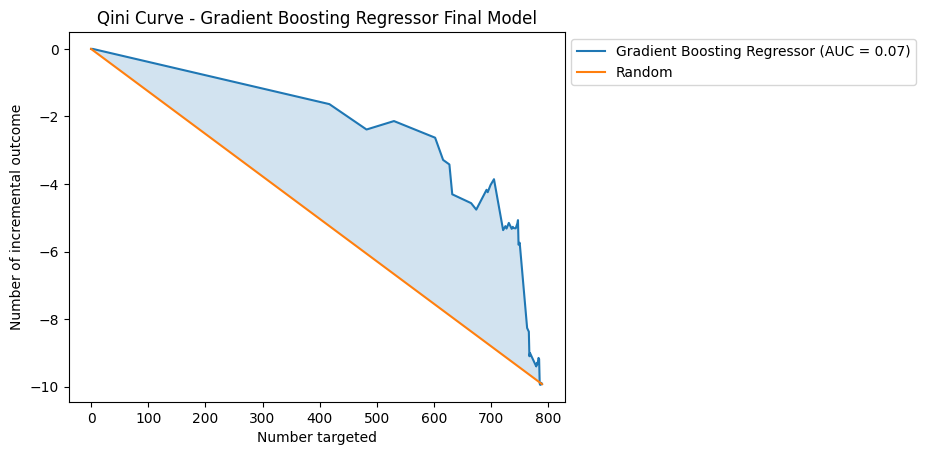

Gradient Boosting Regressor Final Model AUQC: 0.0722207863098325

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


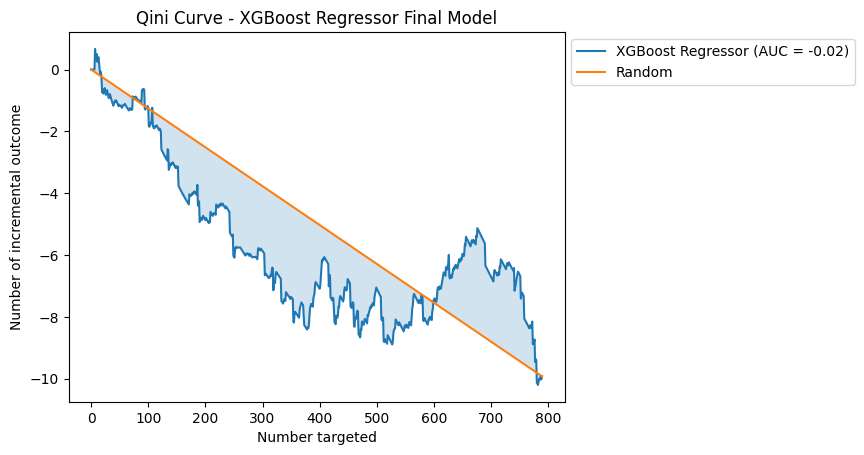

XGBoost Regressor Final Model AUQC: -0.019530109770427493

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


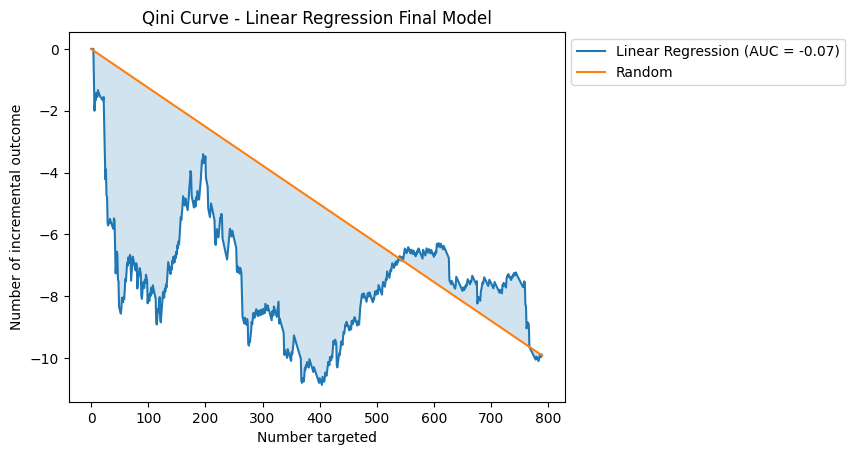

Linear Regression Final Model AUQC: -0.06592523593098885

Evaluating SVM for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


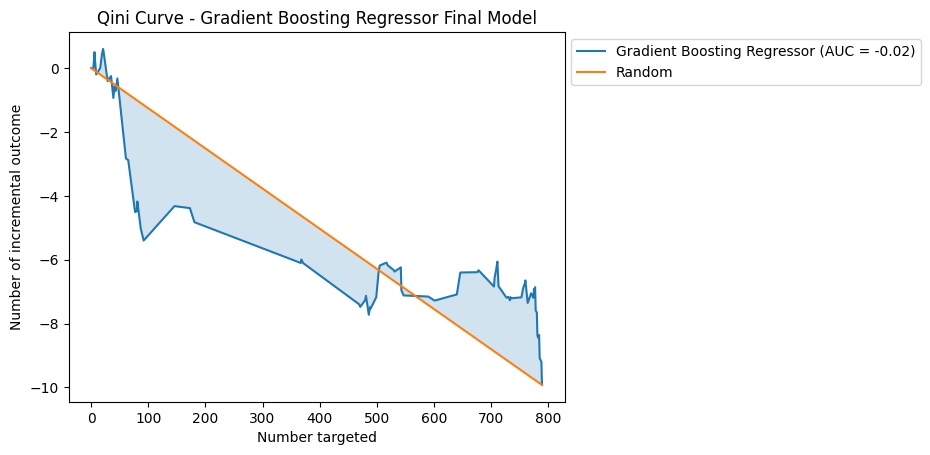

Gradient Boosting Regressor Final Model AUQC: -0.019309761918573067

Evaluating DR-Learner with XGBoost Regressor as the final model...


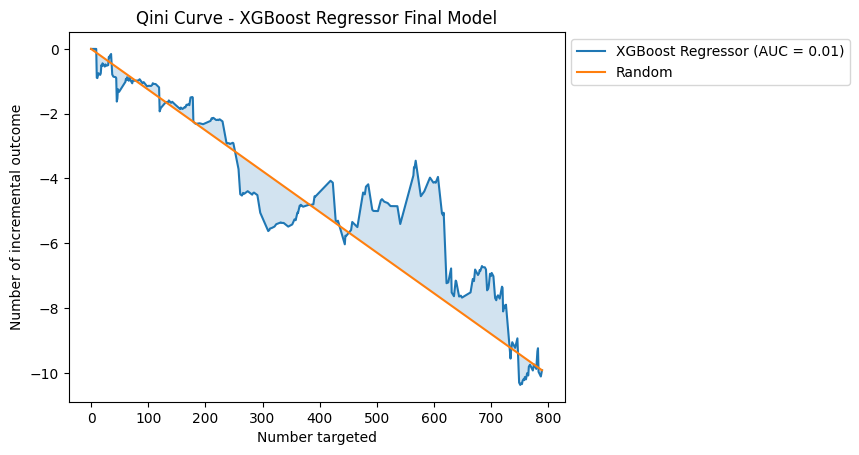

XGBoost Regressor Final Model AUQC: 0.012647562972356434

Evaluating DR-Learner with Linear Regression as the final model...


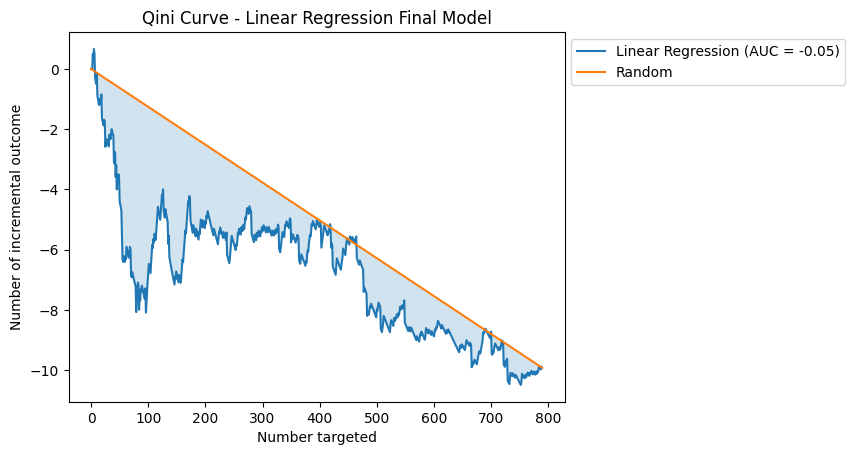

Linear Regression Final Model AUQC: -0.04802622857229644

Evaluating SVM for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


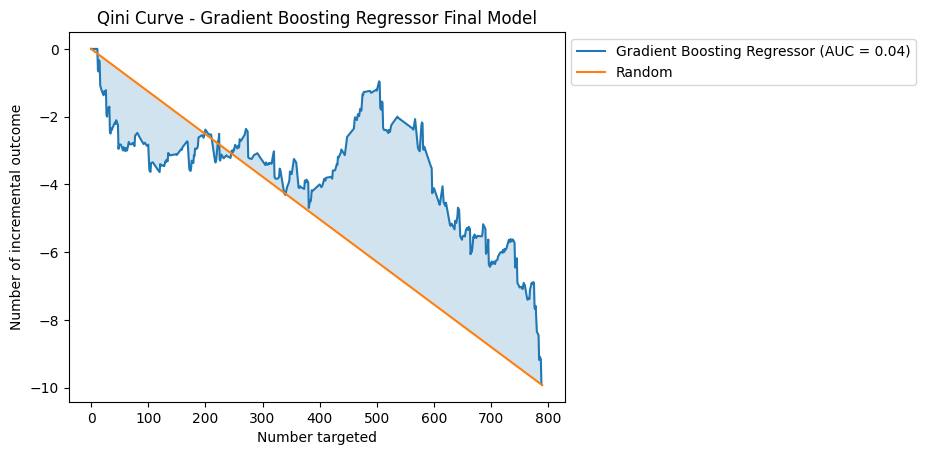

Gradient Boosting Regressor Final Model AUQC: 0.036086293371743516

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


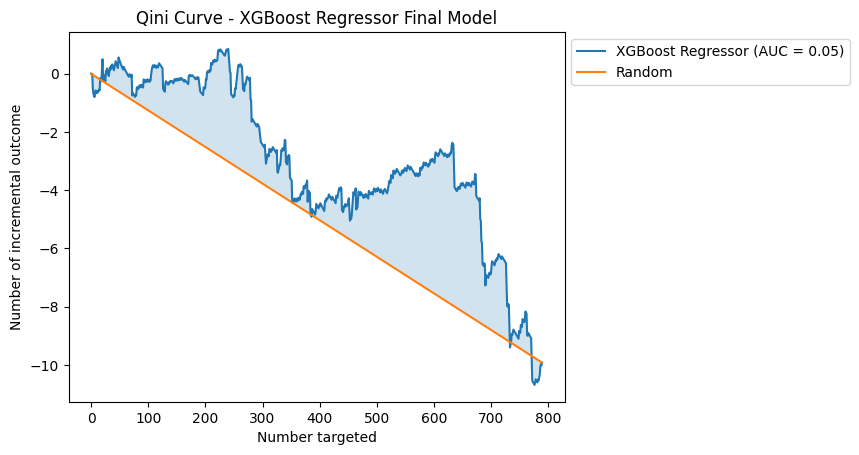

XGBoost Regressor Final Model AUQC: 0.052096421180956615

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


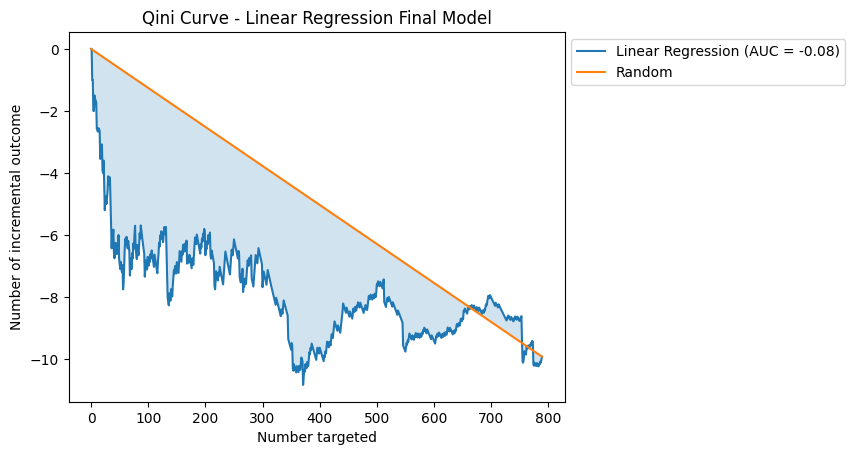

Linear Regression Final Model AUQC: -0.07661550775730931

Evaluating SVM for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


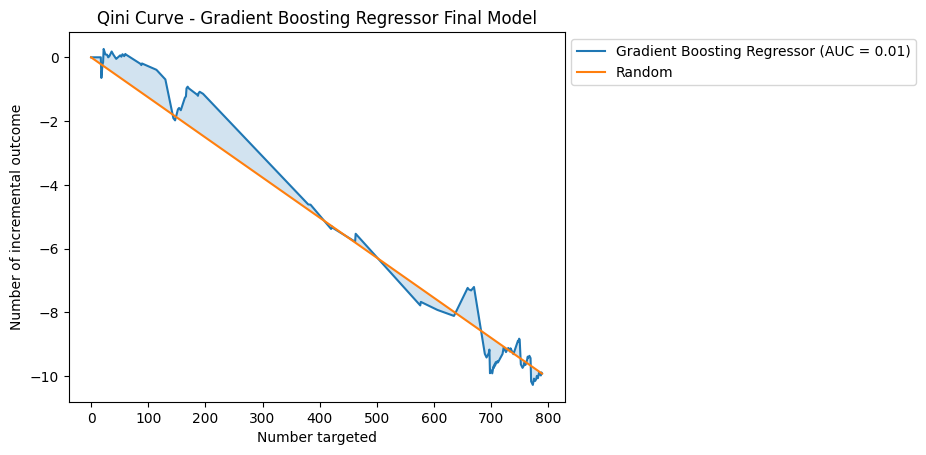

Gradient Boosting Regressor Final Model AUQC: 0.008299659392152981

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


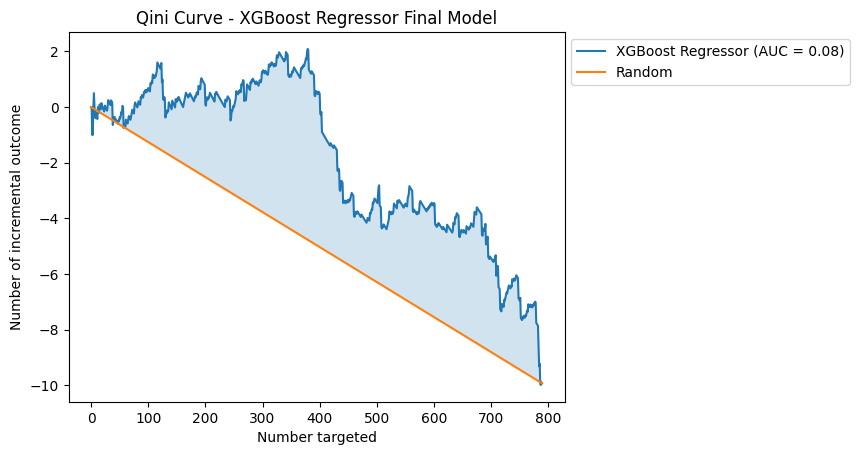

XGBoost Regressor Final Model AUQC: 0.08094045111848067

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


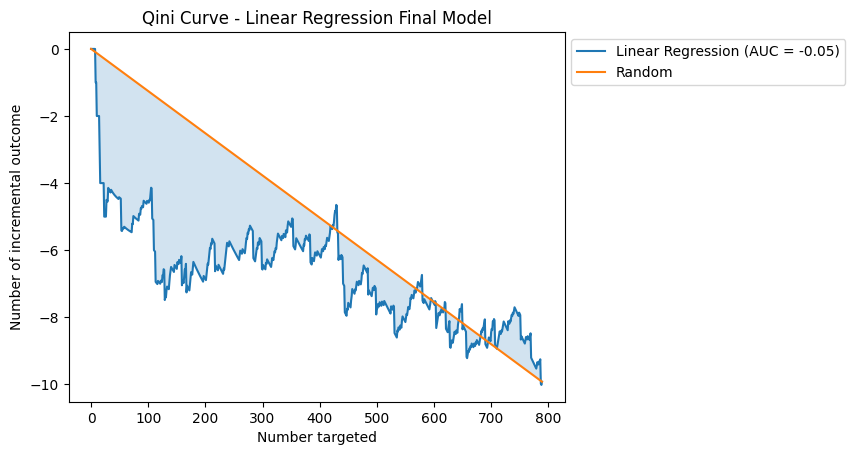

Linear Regression Final Model AUQC: -0.04554993192118554

Evaluating K-Nearest Neighbors for propensity and Logistic Regression for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


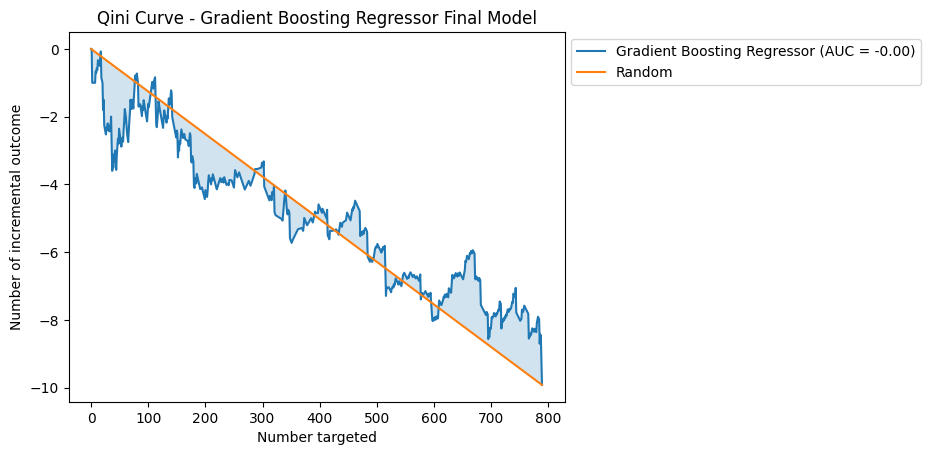

Gradient Boosting Regressor Final Model AUQC: -0.0007074664852728292

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


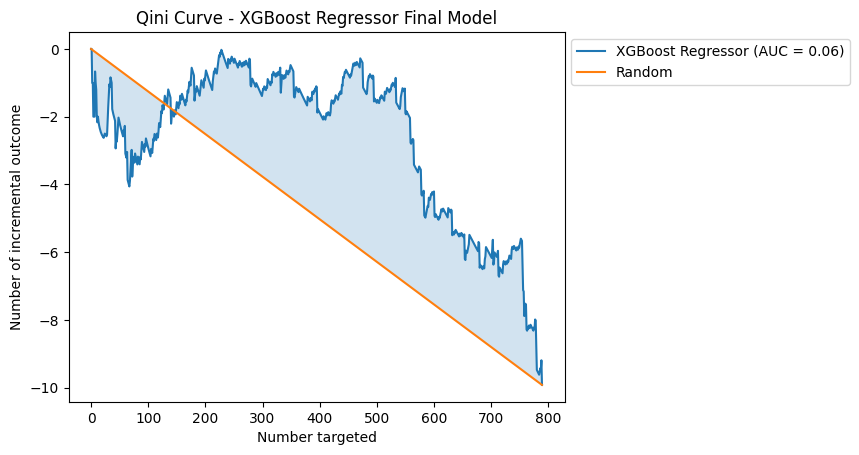

XGBoost Regressor Final Model AUQC: 0.05893326437993894

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


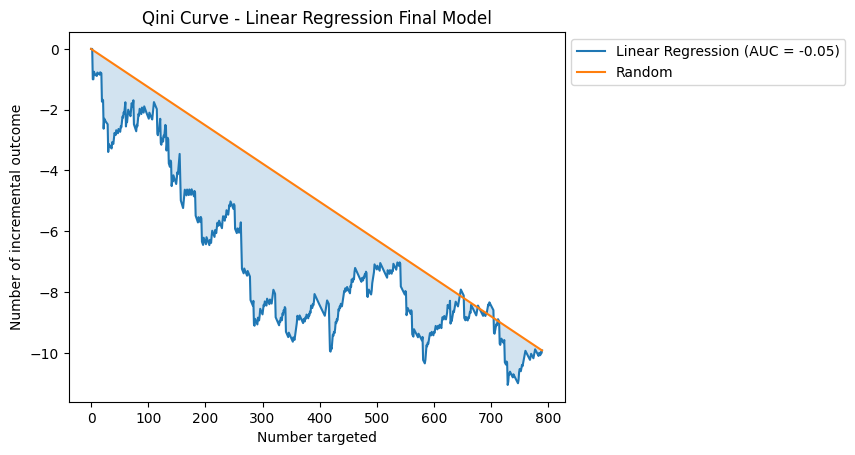

Linear Regression Final Model AUQC: -0.0544172774789471

Evaluating K-Nearest Neighbors for propensity and Gradient Boosting for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


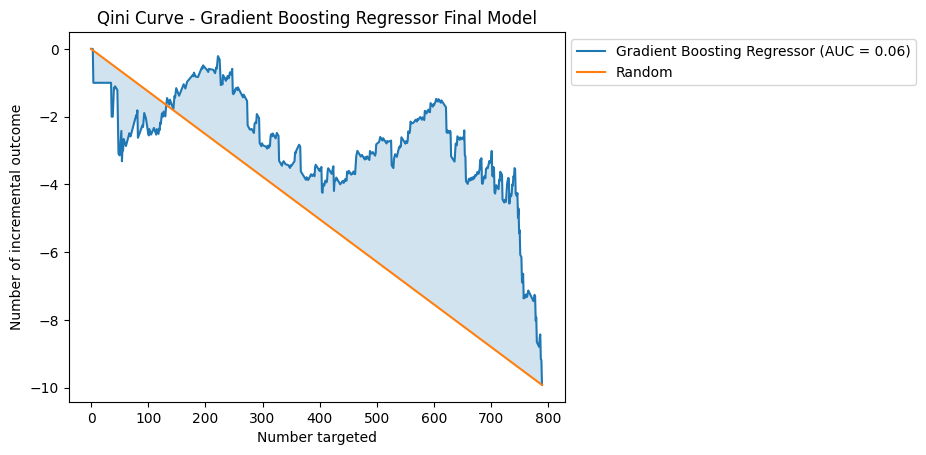

Gradient Boosting Regressor Final Model AUQC: 0.057439084184044635

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


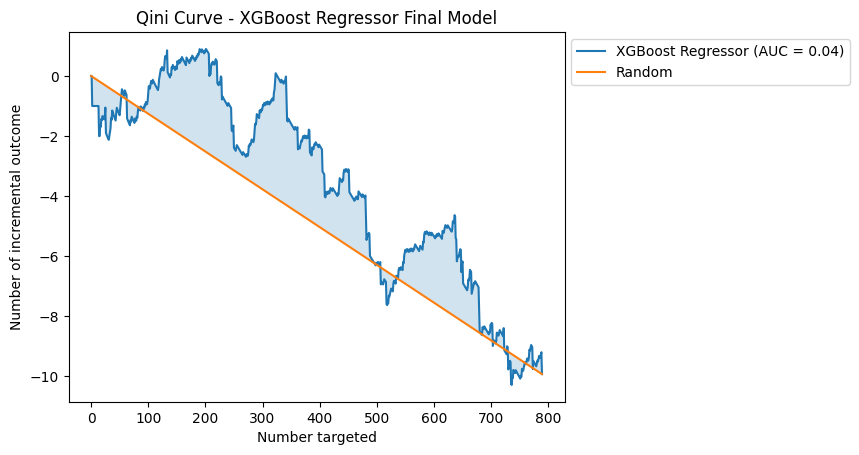

XGBoost Regressor Final Model AUQC: 0.03509988866272619

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


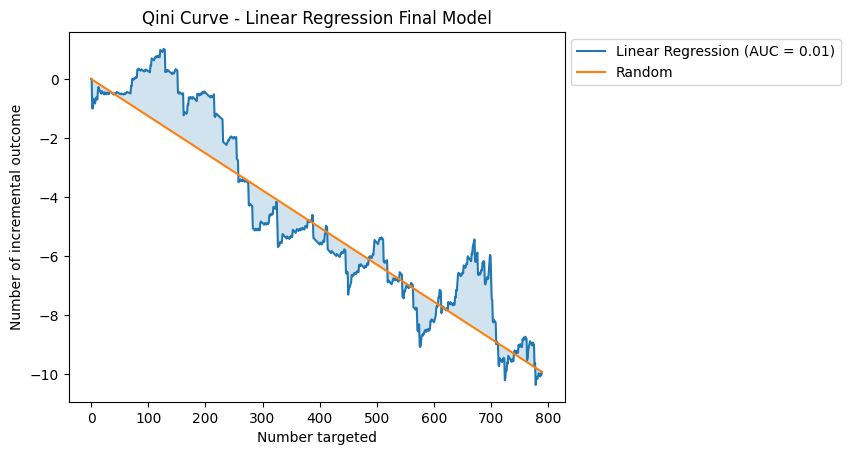

Linear Regression Final Model AUQC: 0.008730183201215214

Evaluating K-Nearest Neighbors for propensity and XGBoost for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


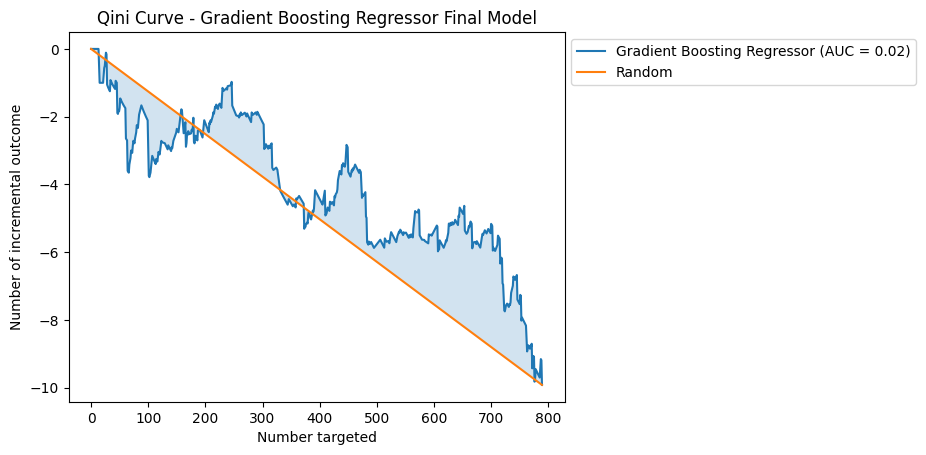

Gradient Boosting Regressor Final Model AUQC: 0.02290916308732931

Evaluating DR-Learner with XGBoost Regressor as the final model...


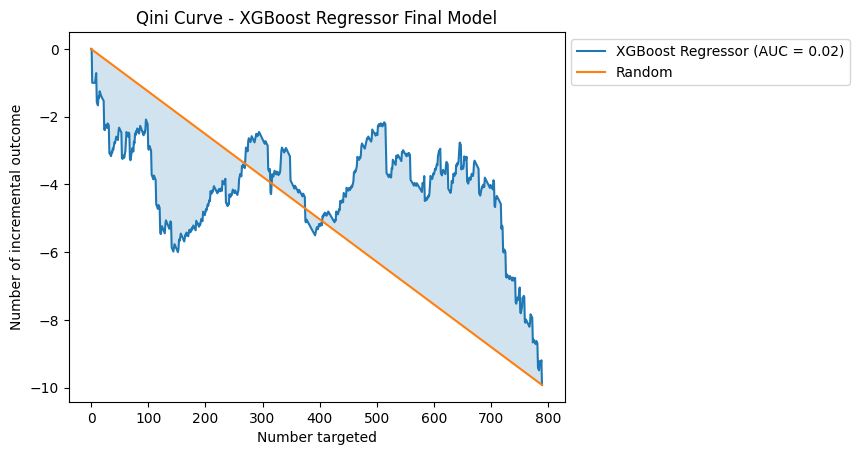

XGBoost Regressor Final Model AUQC: 0.022390958648141134

Evaluating DR-Learner with Linear Regression as the final model...


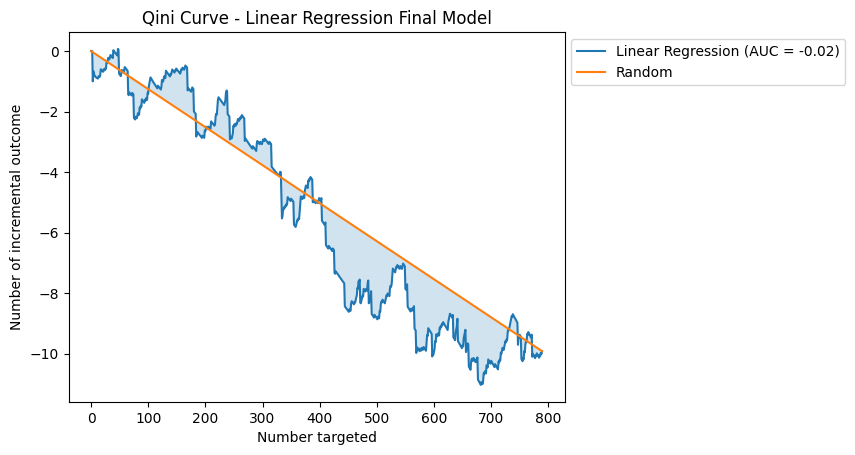

Linear Regression Final Model AUQC: -0.015001791219374522

Evaluating K-Nearest Neighbors for propensity and SVM for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


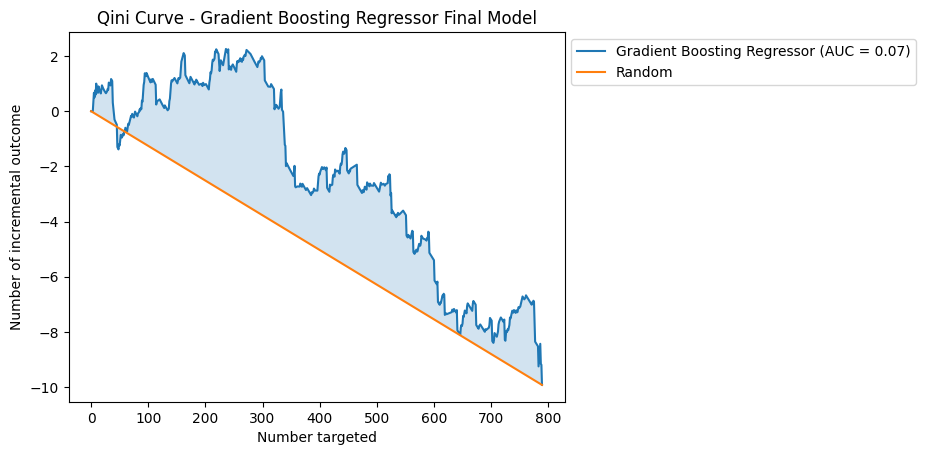

Gradient Boosting Regressor Final Model AUQC: 0.06699254743418863

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


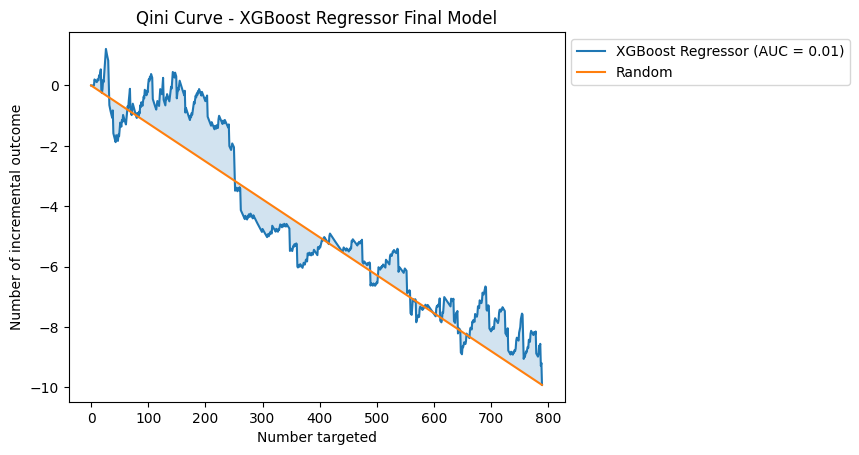

XGBoost Regressor Final Model AUQC: 0.010557563701299054

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


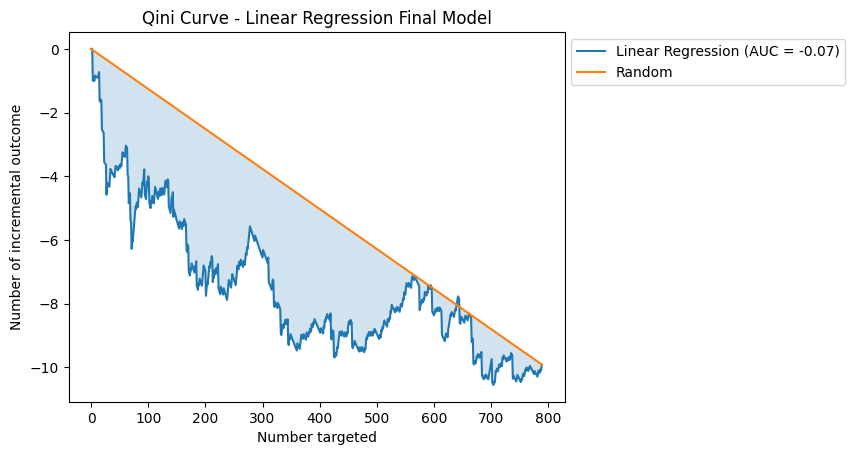

Linear Regression Final Model AUQC: -0.06680200180723454

Evaluating K-Nearest Neighbors for propensity and K-Nearest Neighbors for regression...
Evaluating DR-Learner with Gradient Boosting Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


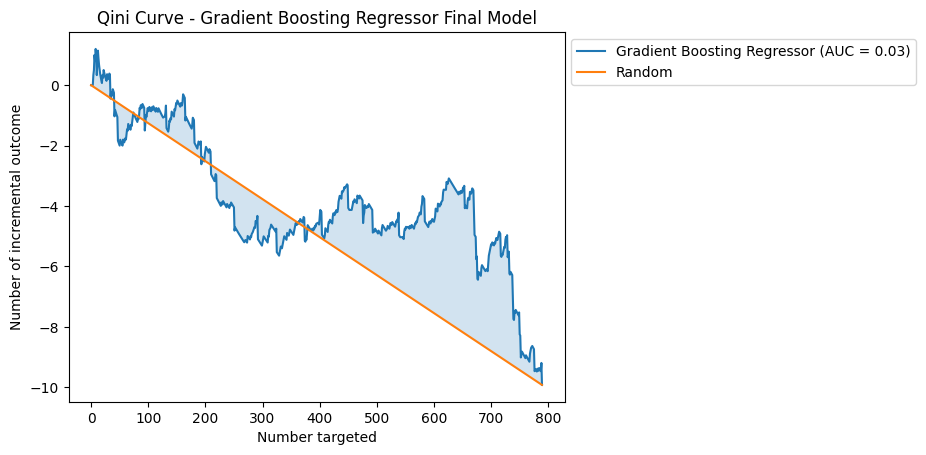

Gradient Boosting Regressor Final Model AUQC: 0.028807312127232115

Evaluating DR-Learner with XGBoost Regressor as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


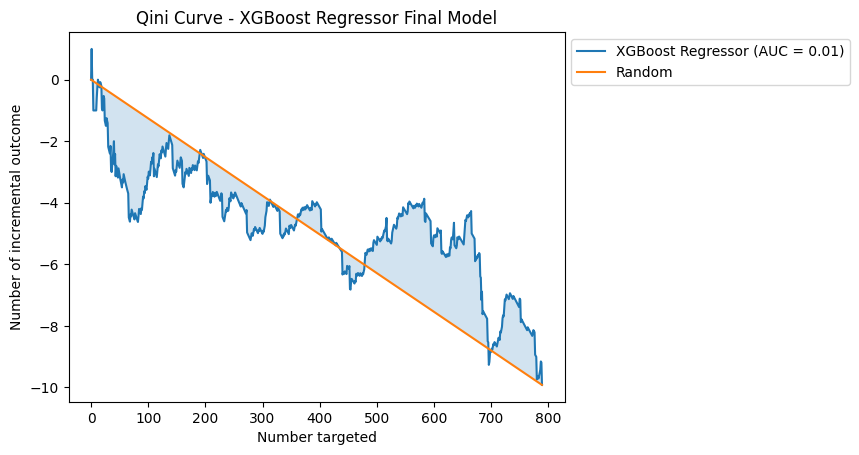

XGBoost Regressor Final Model AUQC: 0.006645619214036155

Evaluating DR-Learner with Linear Regression as the final model...


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


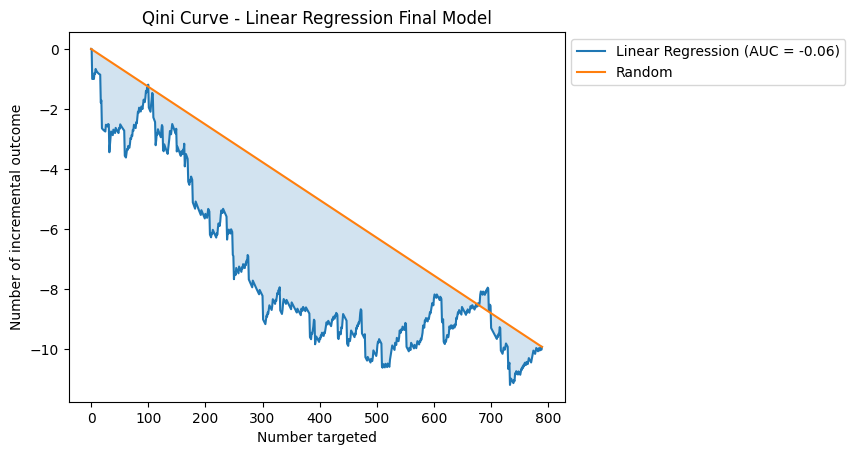

Linear Regression Final Model AUQC: -0.06349011494172066

Model comparison results:
Logistic Regression Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: 0.054195347770952224
Logistic Regression Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.08933677135957661
Logistic Regression Propensity and Logistic Regression Regression with Linear Regression Final: 0.01634101901665613
Logistic Regression Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.03991303095871167
Logistic Regression Propensity and Gradient Boosting Regression with XGBoost Regressor Final: 0.019661750507832244
Logistic Regression Propensity and Gradient Boosting Regression with Linear Regression Final: -0.004671283204918107
Logistic Regression Propensity and XGBoost Regression with Gradient Boosting Regressor Final: 0.029399580283284314
Logistic Regression Propensity and XGBoost Regression with XGBoost Regressor Final: 0.0

In [48]:
# Define models and parameter grids for grid search
propensity_models = {
    'Logistic Regression': (LogisticRegression(random_state=768), {
        'C': [0.1, 1.0, 10.0],
        'solver': ['lbfgs', 'liblinear']
    }),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=768), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    }),
    'XGBoost': (XGBClassifier(random_state=768), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    }),
    'SVM': (SVC(probability=True, random_state=768), {
        'C': [0.1, 1.0, 10.0],
        'kernel': ['linear', 'rbf']
    }),
    'K-Nearest Neighbors': (KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7]
    })
}

# Automated pipeline function for propensity and regression model selection
def evaluate_dr_learner(propensity_model_name, propensity_model, propensity_param_grid,
                        regression_model_name, regression_model, regression_param_grid):
    print(f"Evaluating {propensity_model_name} for propensity and {regression_model_name} for regression...")
    
    # Tune propensity model
    grid_search_propensity = GridSearchCV(propensity_model, propensity_param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
    grid_search_propensity.fit(X_train[selected_features], t_train)
    best_propensity_model = grid_search_propensity.best_estimator_
    best_propensity_params = grid_search_propensity.best_params_

    # Tune response model
    grid_search_regression = GridSearchCV(regression_model, regression_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search_regression.fit(X_train[selected_features], y_train)
    best_regression_model = grid_search_regression.best_estimator_
    best_regression_params = grid_search_regression.best_params_

    # Calibrate the propensity model
    calibrated_propensity_model = CalibratedClassifierCV(best_propensity_model, method='isotonic', cv=5)
    calibrated_propensity_model.fit(X_train[selected_features], t_train)

    return calibrated_propensity_model, best_regression_model, best_propensity_params, best_regression_params

# Loop through different final models for DR-Learner
final_models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=768, n_estimators=30),
    'XGBoost Regressor': XGBRegressor(random_state=768, n_estimators=30),
    'Linear Regression': LinearRegression()
}

def evaluate_final_model(final_model_name, final_model, calibrated_propensity_model, best_regression_model):
    print(f"Evaluating DR-Learner with {final_model_name} as the final model...")
    
    dr_learner = DRLearner(
        model_propensity=calibrated_propensity_model,
        model_regression=best_regression_model,
        model_final=final_model,
        discrete_outcome=True
    )

    dr_learner.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)
    cate = dr_learner.effect(X=X_test[selected_features])

    # Create data_test DataFrame
    data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
    data_test['outcome'] = y_test
    data_test['treatment'] = t_test
    data_test['CATE_DR'] = cate

    # Visualize Qini Curve
    fig, ax = plt.subplots(1, 1)
    ax.set_title(f'Qini Curve - {final_model_name} Final Model')

    plot_qini_curve(
        data_test['outcome'], data_test['CATE_DR'], data_test['treatment'],
        perfect=False, name=final_model_name, ax=ax
    )

    plt.show()

    # Calculate Qini AUC score
    auqc = qini_auc_score(data_test['outcome'], data_test['CATE_DR'], data_test['treatment'])
    print(f'{final_model_name} Final Model AUQC: {auqc}\n')
    return auqc

# Evaluate all combinations of models
results = {}
best_params_store = {}
for propensity_model_name, (propensity_model, propensity_param_grid) in propensity_models.items():
    for regression_model_name, (regression_model, regression_param_grid) in propensity_models.items():  # Reuse propensity models as regression models since outcome is binary
        key = f'{propensity_model_name} Propensity and {regression_model_name} Regression'
        calibrated_propensity_model, best_regression_model, best_propensity_params, best_regression_params = evaluate_dr_learner(propensity_model_name, propensity_model, propensity_param_grid,
                                                                                                                               regression_model_name, regression_model, regression_param_grid)
        best_params_store[key] = {
            'best_propensity_params': best_propensity_params,
            'best_regression_params': best_regression_params
        }
        for final_model_name, final_model in final_models.items():
            results[f'{key} with {final_model_name} Final'] = evaluate_final_model(final_model_name, final_model, calibrated_propensity_model, best_regression_model)

# Print results
print("Model comparison results:")
for key, auqc in results.items():
    print(f'{key}: {auqc}')

print("\nBest Parameters:")
for key, params in best_params_store.items():
    print(f'{key}:')
    print(f"  Best Propensity Model Params: {params['best_propensity_params']}")
    print(f"  Best Regression Model Params: {params['best_regression_params']}")

In [49]:
# Sort the results in descending order based on AUQC
sorted_results = sorted(results.items(), key=lambda item: item[1], reverse=True)

# Print sorted results
print("Sorted model comparison results:")
for key, auqc in sorted_results:
    print(f'{key}: {auqc}')

# print("\nBest Parameters:")
# for key, params in best_params_store.items():
#     print(f'{key}:')
#     print(f"  Best Propensity Model Params: {params['best_propensity_params']}")
#     print(f"  Best Regression Model Params: {params['best_regression_params']}")


Sorted model comparison results:
Logistic Regression Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.08933677135957661
Gradient Boosting Propensity and XGBoost Regression with XGBoost Regressor Final: 0.0885431001861384
SVM Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: 0.08094045111848067
SVM Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.0722207863098325
SVM Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: 0.07165202418026832
SVM Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.06761934361776363
K-Nearest Neighbors Propensity and SVM Regression with Gradient Boosting Regressor Final: 0.06699254743418863
K-Nearest Neighbors Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.05893326437993894
K-Nearest Neighbors Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.0

- Logistic Regression Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.08933677135957661
- Gradient Boosting Propensity and XGBoost Regression with XGBoost Regressor Final: 0.0885431001861384
- SVM Propensity and K-Nearest Neighbors Regression with XGBoost Regressor Final: 0.08094045111848067
- SVM Propensity and Gradient Boosting Regression with Gradient Boosting Regressor Final: 0.0722207863098325
- SVM Propensity and Logistic Regression Regression with Gradient Boosting Regressor Final: 0.07165202418026832
- SVM Propensity and Logistic Regression Regression with XGBoost Regressor Final: 0.06761934361776363


Best Parameters:
Logistic Regression Propensity and Logistic Regression Regression:
  Best Propensity Model Params: {'C': 10.0, 'solver': 'lbfgs'}
  Best Regression Model Params: {'C': 1.0, 'solver': 'liblinear'}
  
Gradient Boosting Propensity and XGBoost Regression:
  Best Propensity Model Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
  Best Regression Model Params: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}
  
SVM Propensity and K-Nearest Neighbors Regression:
  Best Propensity Model Params: {'C': 1.0, 'kernel': 'linear'}
  Best Regression Model Params: {'n_neighbors': 7}
  
SVM Propensity and Logistic Regression Regression:
  Best Propensity Model Params: {'C': 1.0, 'kernel': 'linear'}
  Best Regression Model Params: {'C': 1.0, 'solver': 'liblinear'}
  
SVM Propensity and Gradient Boosting Regression:
  Best Propensity Model Params: {'C': 1.0, 'kernel': 'linear'}
  Best Regression Model Params: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}

Logistic, logistic, xgboost

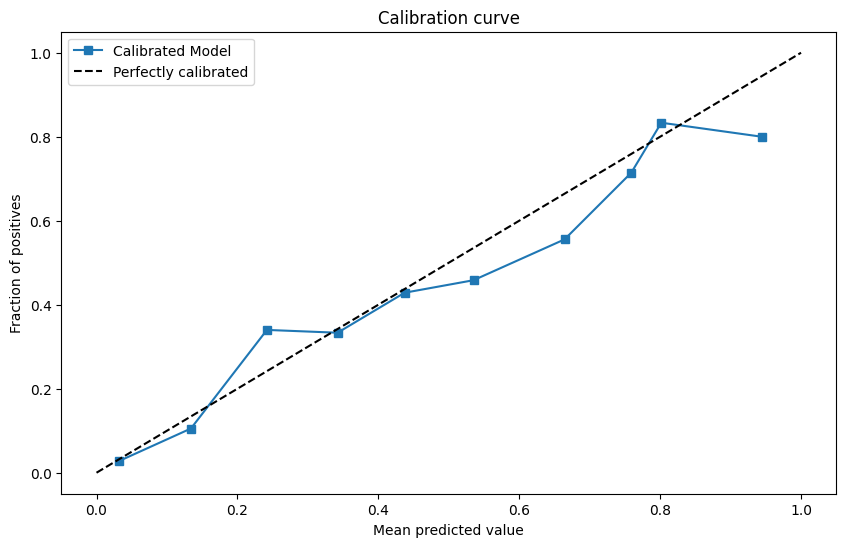

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
[15:16:04] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "n_samples" } are not used.

X has feature names, but LogisticRegression was fitted without feature names
X has feature names, but LogisticRegression was fitted without feature names
X has feature names, but LogisticRegression was fitted without feature names
X has feature names, but LogisticRegression was fitted without feature names
X has feature names, but LogisticRegression was fitted without feature names


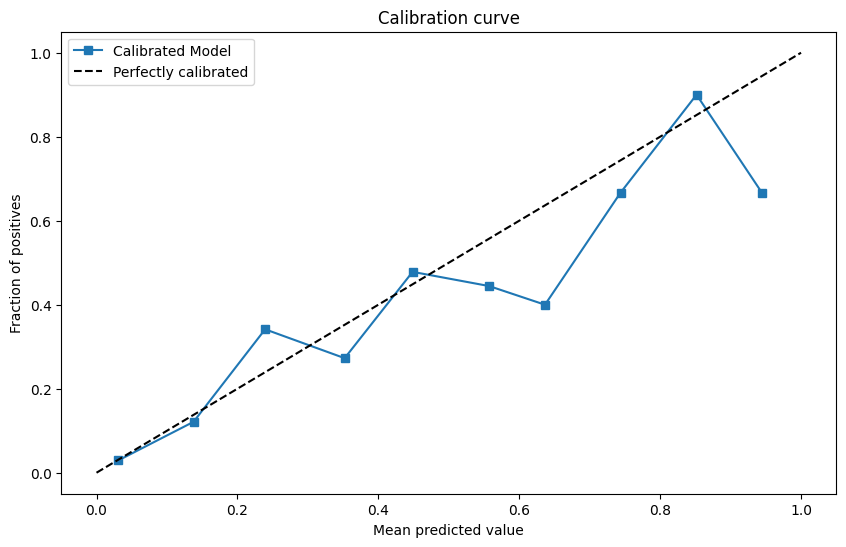

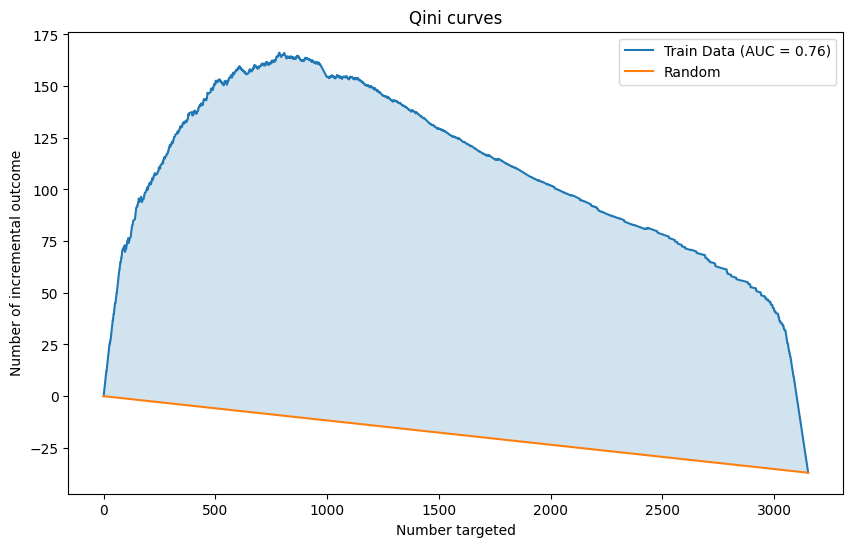

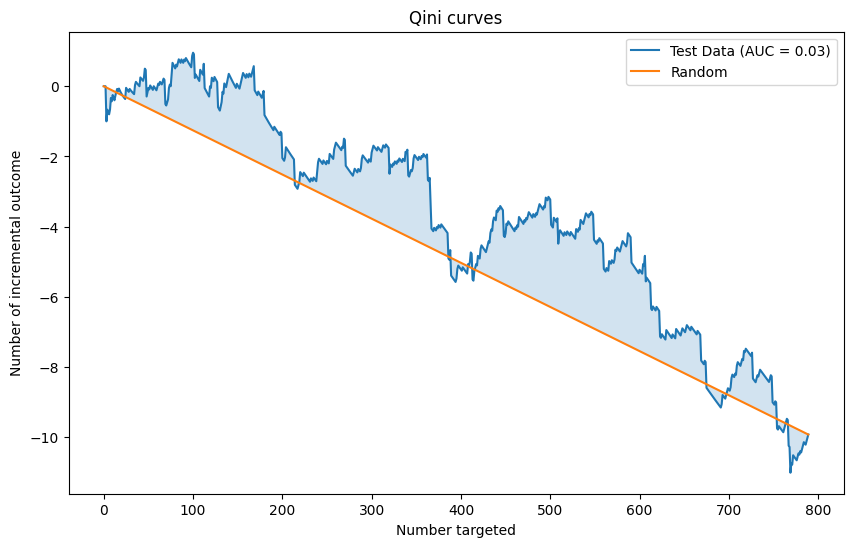

Train Data Qini AUC: 0.7622369895473221
Test Data Qini AUC: 0.03355367766069163


In [89]:

# Fit the DR-Learner with the best parameters
propensity_model = LogisticRegression(C=10.0, random_state=768, solver='lbfgs')
calibrated_propensity_model = CalibratedClassifierCV(propensity_model, method='isotonic', cv=5)
calibrated_propensity_model.fit(X_train[selected_features], t_train)

# Assume calibrated_propensity_model is already fitted
prob_pos = calibrated_propensity_model.predict_proba(X_test[selected_features])[:, 1]
fraction_of_positives, mean_predicted_value = calibration_curve(t_test, prob_pos, n_bins=10)

plt.figure(figsize=(10, 6))
plt.plot(mean_predicted_value, fraction_of_positives, "s-", label='Calibrated Model')
plt.plot([0, 1], [0, 1], "k--", label="Perfectly calibrated")
plt.xlabel("Mean predicted value")
plt.ylabel("Fraction of positives")
plt.title("Calibration curve")
plt.legend()
plt.show()

regression_model = LogisticRegression(C=1.0, random_state=768, solver='liblinear')
final_model = XGBRegressor(random_state=768, n_samples = 30)

dr_learner_best = DRLearner(
    model_propensity=calibrated_propensity_model,
    # model_propensity=LogisticRegression(C=10.0, random_state=768, solver='lbfgs'),
    model_regression=regression_model,
    model_final=final_model,
    discrete_outcome=True,
    cv=3
)

dr_learner_best.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)


# # Assume calibrated_propensity_model is already fitted
# prob_pos = dr_learner_best.models_propensity[0][0].predict_proba(X_test[selected_features])[:, 1]
# fraction_of_positives, mean_predicted_value = calibration_curve(t_test, prob_pos, n_bins=10)
# 
# plt.figure(figsize=(10, 6))
# plt.plot(mean_predicted_value, fraction_of_positives, "s-", label='Calibrated Model')
# plt.plot([0, 1], [0, 1], "k--", label="Perfectly calibrated")
# plt.xlabel("Mean predicted value")
# plt.ylabel("Fraction of positives")
# plt.title("Calibration curve")
# plt.legend()
# plt.show()

# Estimate CATE on training data
cate_train = dr_learner_best.effect(X=X_train[selected_features])

# Create data_train DataFrame
data_train = pd.DataFrame(X_train[selected_features], columns=selected_features)
data_train['outcome'] = y_train
data_train['treatment'] = t_train
data_train['CATE_DR'] = cate_train

# Sort data by CATE estimates in descending order for training data
data_train_sorted = data_train.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Estimate CATE on test data
cate_test = dr_learner_best.effect(X=X_test[selected_features])

# Create data_test DataFrame
data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
data_test['outcome'] = y_test
data_test['treatment'] = t_test
data_test['CATE_DR'] = cate_test

# Sort data by CATE estimates in descending order for test data
data_test_sorted = data_test.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Visualize Qini Curves
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.set_title('Qini curves')

plot_qini_curve(
    data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'],
    perfect=False, name='Train Data', ax=ax
)

# plot_qini_curve(
#     data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'],
#     perfect=False, name='Test Data', ax=ax
# )

plt.legend()
plt.show()

# Visualize Qini Curves
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.set_title('Qini curves')

# plot_qini_curve(
#     data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'],
#     perfect=False, name='Train Data', ax=ax
# )

plot_qini_curve(
    data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'],
    perfect=False, name='Test Data', ax=ax
)

plt.legend()
plt.show()

# Calculate Qini AUC for train and test data
qini_auc_train = qini_auc_score(data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'])
qini_auc_test = qini_auc_score(data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'])

print(f'Train Data Qini AUC: {qini_auc_train}')
print(f'Test Data Qini AUC: {qini_auc_test}')

In [ ]:

# Fit the DR-Learner with the best parameters
propensity_model = LogisticRegression(C=10.0, random_state=768, solver='lbfgs')
calibrated_propensity_model = CalibratedClassifierCV(propensity_model, method='isotonic', cv=5)
calibrated_propensity_model.fit(X_train[selected_features], t_train)

# Assume calibrated_propensity_model is already fitted
prob_pos = calibrated_propensity_model.predict_proba(X_test[selected_features])[:, 1]
fraction_of_positives, mean_predicted_value = calibration_curve(t_test, prob_pos, n_bins=10)

plt.figure(figsize=(10, 6))
plt.plot(mean_predicted_value, fraction_of_positives, "s-", label='Calibrated Model')
plt.plot([0, 1], [0, 1], "k--", label="Perfectly calibrated")
plt.xlabel("Mean predicted value")
plt.ylabel("Fraction of positives")
plt.title("Calibration curve")
plt.legend()
plt.show()

regression_model = LogisticRegression(C=1.0, random_state=768, solver='liblinear')
final_model = XGBRegressor(random_state=768, n_samples = 30)

dr_learner_best = DRLearner(
    # model_propensity=calibrated_propensity_model,
    model_propensity=LogisticRegression(C=10.0, random_state=768, solver='lbfgs'),
    model_regression=regression_model,
    model_final=final_model,
    discrete_outcome=True,
    cv=5
)

dr_learner_best.fit(y_train.astype(int), t_train, X=X_train[selected_features], W=None)


# Assume calibrated_propensity_model is already fitted
prob_pos = dr_learner_best.models_propensity[0][0].predict_proba(X_test[selected_features])[:, 1]
fraction_of_positives, mean_predicted_value = calibration_curve(t_test, prob_pos, n_bins=10)

plt.figure(figsize=(10, 6))
plt.plot(mean_predicted_value, fraction_of_positives, "s-", label='Calibrated Model')
plt.plot([0, 1], [0, 1], "k--", label="Perfectly calibrated")
plt.xlabel("Mean predicted value")
plt.ylabel("Fraction of positives")
plt.title("Calibration curve")
plt.legend()
plt.show()

# Estimate CATE on training data
cate_train = dr_learner_best.effect(X=X_train[selected_features])

# Create data_train DataFrame
data_train = pd.DataFrame(X_train[selected_features], columns=selected_features)
data_train['outcome'] = y_train
data_train['treatment'] = t_train
data_train['CATE_DR'] = cate_train

# Sort data by CATE estimates in descending order for training data
data_train_sorted = data_train.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Estimate CATE on test data
cate_test = dr_learner_best.effect(X=X_test[selected_features])

# Create data_test DataFrame
data_test = pd.DataFrame(X_test[selected_features], columns=selected_features)
data_test['outcome'] = y_test
data_test['treatment'] = t_test
data_test['CATE_DR'] = cate_test

# Sort data by CATE estimates in descending order for test data
data_test_sorted = data_test.sort_values(by='CATE_DR', ascending=False).reset_index(drop=True)

# Visualize Qini Curves
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.set_title('Qini curves')

plot_qini_curve(
    data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'],
    perfect=False, name='Train Data', ax=ax
)

# plot_qini_curve(
#     data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'],
#     perfect=False, name='Test Data', ax=ax
# )

plt.legend()
plt.show()

# Visualize Qini Curves
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.set_title('Qini curves')

# plot_qini_curve(
#     data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'],
#     perfect=False, name='Train Data', ax=ax
# )

plot_qini_curve(
    data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'],
    perfect=False, name='Test Data', ax=ax
)

plt.legend()
plt.show()

# Calculate Qini AUC for train and test data
qini_auc_train = qini_auc_score(data_train_sorted['outcome'], data_train_sorted['CATE_DR'], data_train_sorted['treatment'])
qini_auc_test = qini_auc_score(data_test_sorted['outcome'], data_test_sorted['CATE_DR'], data_test_sorted['treatment'])

print(f'Train Data Qini AUC: {qini_auc_train}')
print(f'Test Data Qini AUC: {qini_auc_test}')